<a href="https://colab.research.google.com/github/jtapiav/github-slideshow/blob/master/GA_ArchitecturesNoC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Dependencias

In [1463]:
# Dependencias
!pip install graph-lib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Bibliotecas

In [1464]:
# Bibliotecas
import numpy as np
import math
import matplotlib.pyplot as plt
import networkx as nx


# Arquitecturas

## Aplication Core

In [1465]:
class AplicationCore():
  def __init__( self, cores, labeled_edges_cores ):
    self.cores               = cores
    self.labeled_edges_cores = labeled_edges_cores
    self.tdg_matrix          = self.create_tdg_matrix( cores, labeled_edges_cores )

  def create_tdg_matrix( self, cores, labeled_edges_cores ):

    for source_core, destination_router in labeled_edges_cores.copy().keys():
      if (destination_router, source_core) not in labeled_edges_cores:
        labeled_edges_cores[(destination_router, source_core)] = labeled_edges_cores[(source_core, destination_router)]

    tdg_matrix = np.zeros( (len(cores), len(cores)), dtype=int )

    for source_core_index, source_core in enumerate( cores ):
      for destination_core_index, destination_core in enumerate( cores ):
        if( source_core, destination_core) in labeled_edges_cores:
          tdg_matrix[source_core_index, destination_core_index] = labeled_edges_cores[source_core,destination_core]

    return tdg_matrix

## Topologia

In [1466]:

def draw_bezier_curve(start_pos, end_pos):
  # Cálculo de las coordenadas de la curva de Bézier
  # Puedes ajustar los parámetros según tus necesidades
  control_point_x = start_pos[0]
  control_point_y = end_pos[1]
  curve = [(start_pos[0], start_pos[1]), (control_point_x, control_point_y), (end_pos[0], end_pos[1])]
  return curve

class Topology():
  def __init__(self, routers, cores, labeled_edges_routers, chromosome, topology_type ):
    self.routers                        = routers
    self.labeled_edges_routers          = labeled_edges_routers
    self.cores                          = cores
    self.labeled_edges_cores_to_routers = None
    self.topology_type                  = topology_type

    self.chromosome = chromosome
    self.labeled_edges_cores_to_routers = self.assign_cores_to_topology_routers( )
    self.routers_positions = self.get_routers_positions( topology_type )
    self.cores_positions   = self.get_cores_positions( self.routers_positions )



  def assign_cores_to_topology_routers( self ):
    labeled_edges_cores_to_routers = {}

    if self.chromosome is not None:
      # Assignation with Chromosme
      labeled_edges_cores_routers = {('C{}'.format(self.chromosome[router_index]+1), 'R{}'.format(router_index+1)):1 for router_index in range( len(self.chromosome))}

    else:
      if self.topology_type == 'custom':
        # Direct Assignation
        labeled_edges_cores_routers = {('C{}'.format(index), 'R{}'.format(index )):1 for index in range( 1, len(self.routers)+1 )}

      else:
        # Random Assignation
        routers  = self.routers.copy()
        cores    = self.cores.copy()

        np.random.shuffle( routers )
        np.random.shuffle( cores )

        labeled_edges_cores_routers = {(core, router):1 for core, router in zip(cores,routers)}

    return labeled_edges_cores_routers

  def get_routers_positions( self, topology_type ):

    node_positions = {}

    G = nx.Graph()
    G.add_nodes_from(self.routers)
    G.add_edges_from(self.labeled_edges_routers)


    if topology_type == 'custom':
      num_routers = len([node for node in G.nodes if node.startswith('R')])
      num_rows = int(np.sqrt(num_routers))
      num_cols = int(np.ceil(num_routers / num_rows))

      for i, node in enumerate(G.nodes):
        row = i // num_cols
        col = i % num_cols
        node_positions[node] = nx.spring_layout(G)[node]# Invertir el eje y para que los routers superiores estén arriba


    elif topology_type == 'mesh':
      num_routers = len([node for node in G.nodes if node.startswith('R')])
      num_rows = int(np.sqrt(num_routers))
      num_cols = int(np.ceil(num_routers / num_rows))

      for i, node in enumerate(G.nodes):
        row = i // num_cols
        col = i % num_cols
        node_positions[node] = (col, -row)  # Invertir el eje y para que los routers superiores estén arriba


    elif topology_type == 'torus':
      num_routers = len([node for node in G.nodes if node.startswith('R')])
      num_rows = int(np.sqrt(num_routers))
      num_cols = int(np.ceil(num_routers / num_rows))

      for i, node in enumerate(G.nodes):
        row = i // num_cols
        col = i % num_cols
        node_positions[node] = (col, -row)  # Invertir el eje y para que los routers superiores estén arriba

      # Modificar las aristas seleccionadas para que sean curvas
      curved_edges = [('R1', 'R7'), ('R2', 'R8'), ('R3', 'R9'), ('R1', 'R3'), ('R4', 'R6'), ('R7', 'R9')]
      for edge in curved_edges:
        router1 = edge[0]
        router2 = edge[1]
        node_positions[edge] = draw_bezier_curve(node_positions[router1], node_positions[router2])


    elif topology_type == 'ring':
      num_nodes = 9
      radius = 1.0  # Radio del anillo

      for i, node in enumerate(G.nodes):
        angle = 2 * np.pi * i / num_nodes  # Ángulo correspondiente al nodo en el anillo
        x = radius * np.cos(angle)  # Coordenada x basada en el ángulo y el radio
        y = radius * np.sin(angle)  # Coordenada y basada en el ángulo y el radio
        node_positions[node] = (x, y)

    return node_positions


  def get_cores_positions( self, routers_position ):

    cores_positions = {}

    G = nx.Graph()
    G.add_nodes_from( self.routers )
    G.add_edges_from( self.labeled_edges_routers )
    G.add_nodes_from( self.cores )
    G.add_edges_from( self.labeled_edges_cores_to_routers )

    for i, node in enumerate(G.nodes):
      if node.startswith('C'):
        for ( core, router ), _ in self.labeled_edges_cores_to_routers.items():
          if core == node:
            cores_positions[core] = ( routers_position[router][0] - 0.2, routers_position[router][1] - 0.2 )


    return cores_positions



## Architecture

In [1467]:
class Architecture():
  def __init__( self, application_core, topology_type, chromosome = None ):
    self.application_core = application_core
    self.topology_type    = topology_type
    self.chromosome = chromosome
    self.topology         = self.create_topology(self.application_core, self.topology_type)

    self.routers          = self.topology.routers
    self.cores            = self.application_core.cores
    self.labeled_edges_routers = self.topology.labeled_edges_routers

    self.labeled_edges_cores_to_routers =  self.topology.labeled_edges_cores_to_routers
    self.tdg_matrix              = application_core.tdg_matrix

    self.adj_matrix_routers = self.create_adj_matrix_routers( self.routers, self.labeled_edges_routers )
    self.adj_matrix_cores_to_routers   = self.create_adj_matrix_cores_to_routers( self.cores,  self.routers, self.labeled_edges_cores_to_routers )

    self.hop_matrix_routers      = self.create_hop_matrix_routers( self.adj_matrix_routers )
    self.hop_matrix_cores        = self.create_hop_matrix_cores( self.hop_matrix_routers, self.adj_matrix_cores_to_routers )

    self.chromosome  = self.create_chromosome( self.adj_matrix_cores_to_routers )


    self.hop_matrix_routers_tdg  = None
    self.hop_matrix_cores_tdg    = self.create_hop_matrix_cores_tdg( self.tdg_matrix, self.hop_matrix_cores )


    self.link_number_per_router  = np.sum( self.adj_matrix_routers, axis=0 )
    self.link_average_per_router = np.sum( self.link_number_per_router ) / self.adj_matrix_routers.shape[0]
    self.link_number_total       = np.sum( self.link_number_per_router )

    self.port_number_per_router  = np.sum( self.adj_matrix_routers, axis=0 )
    self.port_number_total       = np.sum( self.port_number_per_router ) / self.adj_matrix_routers.shape[0]
    self.port_number_total       = np.sum( self.port_number_per_router )


    self.port_number_type_per_router    =  self.port_number_type_per_router = [str(ports+1) + '-port' for ports in self.port_number_per_router]



    self.number_of_routers       = len( self.routers)

    self.hop_average_per_each_core = np.sum( self.hop_matrix_cores_tdg, axis=0 )/np.count_nonzero(self.hop_matrix_cores_tdg, axis=0 )
    self.hop_average_per_core      = np.sum( self.hop_average_per_each_core )/np.count_nonzero( self.hop_average_per_each_core )


  def create_chromosome( self, adj_matrix_cores_to_routers ):
    chromosome_standard = np.zeros( (adj_matrix_cores_to_routers.shape[0]), dtype= int )

    for source_core in range( adj_matrix_cores_to_routers.shape[0] ):
      for destination_router in range( adj_matrix_cores_to_routers.shape[0] ):
        if adj_matrix_cores_to_routers[source_core, destination_router] == 1:
          chromosome_standard[destination_router] = source_core

    return chromosome_standard

  def create_hop_matrix_cores_tdg( self, tdg_matrix, hop_matrix_cores ):

    hop_matrix_cores_tdg = hop_matrix_cores.astype(int)

    for source_core_index in range(hop_matrix_cores.shape[0]):
      for destination_core_index in range(hop_matrix_cores.shape[1]):
        if tdg_matrix[source_core_index,destination_core_index] > 0:
          hop_matrix_cores_tdg[source_core_index,destination_core_index] = hop_matrix_cores[source_core_index,destination_core_index]
        else:
          hop_matrix_cores_tdg[source_core_index,destination_core_index] = 0

    return hop_matrix_cores_tdg


  def create_adj_matrix_routers( self, routers, labeled_edge_routers ):

    for source_router, destination_router in labeled_edge_routers.copy().keys():
      if (destination_router, source_router) not in self.labeled_edges_routers:
        self.labeled_edges_routers[(destination_router, source_router)] = self.labeled_edges_routers[(source_router, destination_router)]

    adj_matrix_routers = np.zeros( (len(routers), len(routers)), dtype=int )

    for source_router_index, source_router in enumerate( routers ):
      for destination_router_index, destination_router in enumerate( routers ):
        if( source_router, destination_router) in self.labeled_edges_routers:
          adj_matrix_routers[source_router_index, destination_router_index] = 1

    return adj_matrix_routers

  def create_adj_matrix_cores_to_routers( self, cores, routers, labeled_edges_cores_to_routers ):

    for source_core, destination_router in labeled_edges_cores_to_routers.copy().keys():
      if (destination_router, source_core) not in self.labeled_edges_cores_to_routers:
        self.labeled_edges_cores_to_routers[(destination_router, source_core)] = self.labeled_edges_cores_to_routers[(source_core, destination_router)]

    adj_matrix_cores = np.zeros( (len(cores), len(routers)), dtype=int )

    for source_core_index, source_router in enumerate( cores ):
      for destination_router_index, destination_router in enumerate( routers ):
        if( source_router, destination_router) in self.labeled_edges_cores_to_routers:
          adj_matrix_cores[source_core_index, destination_router_index] = 1

    return adj_matrix_cores

  def create_hop_matrix_routers( self, adj_matrix_routers ):

    hop_matrix_routers = adj_matrix_routers.astype(float)
    hop_matrix_routers[hop_matrix_routers == 0] = np.inf

    for intermediate_router in range( adj_matrix_routers.shape[1] ):
      for source_router in range( adj_matrix_routers.shape[0] ):
        for destination_router in range( adj_matrix_routers.shape[1] ):
          if source_router == destination_router:
            hop_matrix_routers[source_router, destination_router] = 0
          else:
            hop_matrix_routers[source_router, destination_router]  = min(
                hop_matrix_routers[source_router, destination_router],
                hop_matrix_routers[source_router, intermediate_router] + hop_matrix_routers[intermediate_router, destination_router]
            )
    hop_matrix_routers = hop_matrix_routers.astype(int)

    return hop_matrix_routers

  def create_hop_matrix_cores( self, hop_matrix_routers, adj_matrix_cores_to_routers ):

    hop_matrix_cores = np.zeros_like( adj_matrix_cores_to_routers )

    for source_core in range( adj_matrix_cores_to_routers.shape[0] ):
      for destination_core in range( adj_matrix_cores_to_routers.shape[0] ):
        if source_core == destination_core:
          hop_matrix_cores[source_core,destination_core] = 0
        else:
          source_router = list(adj_matrix_cores_to_routers[source_core]).index(1)
          destination_router = list(adj_matrix_cores_to_routers[destination_core]).index(1)
          hop_matrix_cores[source_core,destination_core] = hop_matrix_routers[source_router,destination_router]

    return hop_matrix_cores


  def get_router_from_core( self, core ):
    return  np.where( self.adj_matrix_cores_to_routers[core,:] == 1)

  def get_core_from_router( self, router ):
    return  np.where( self.adj_matrix_cores_to_routers[:, router] == 1)



  def create_topology( self, application_core, topology_type ):

    if topology_type == 'custom':
      topology = self.create_custom( application_core.cores, application_core.labeled_edges_cores )

    elif topology_type == 'mesh':
      topology = self.create_mesh( application_core.cores, application_core.labeled_edges_cores )

    elif topology_type == 'torus':
      topology = self.create_torus( application_core.cores, application_core.labeled_edges_cores )

    elif topology_type == 'ring':
      topology = self.create_ring( application_core.cores, application_core.labeled_edges_cores )

    elif topology_type == 'polygon':
      topology = self.create_polygon( application_core.cores, application_core.labeled_edges_cores )

    else:
      topology = self.create_custom( application_core.cores, application_core.labeled_edges_cores )

    return topology


  def create_custom( self, cores, labeled_edges_cores ):

    routers = [ 'R{}'.format(index) for index in range( 1, len(cores)+1 )]

    labeled_edges_routers = {}

    for key, value in labeled_edges_cores.items():
      new_key = tuple(k.replace('C', 'R') for k in key)
      labeled_edges_routers[new_key] = value

    return Topology( routers, cores, labeled_edges_routers, self.chromosome, 'custom' )


  def create_mesh( self, cores, labeled_edges_cores ):
    n = int ( np.ceil( np.sqrt( len( cores ) ) ) )
    m = int ( np.ceil( np.sqrt( len( cores ) ) ) )

    routers = [ 'R{}'.format(index) for index in range( 1,  n * m + 1 )]

    labeled_edges_routers = {}

    mesh = None

    for i in range( n ):
      for j in range( m ):
        router =  i * m + j
        if j < m - 1:
          labeled_edges_routers[(routers[router], routers[router + 1])] = 1
        if i < n - 1:
          labeled_edges_routers[(routers[router], routers[router + m])] = 1

    return Topology( routers, cores, labeled_edges_routers, self.chromosome, 'mesh' )


  def create_torus( self, cores, labeled_edges_cores ):
    n = int ( np.ceil( np.sqrt( len( cores ) ) ) )
    m = int ( np.ceil( np.sqrt( len( cores ) ) ) )

    routers = ['R{}'.format(index) for index in range(1, n * m + 1)]
    labeled_edges_routers = {}

    for i in range(n):
        for j in range(m):
            router = i * m + j
            labeled_edges_routers[(routers[router], routers[((i+1) % n) * m + j])] = 1
            labeled_edges_routers[(routers[router], routers[i * m + (j+1) % m])] = 1

    return Topology( routers, cores, labeled_edges_routers, self.chromosome, 'torus')


  def create_ring( self, cores, labeled_edges_cores ):

    n = len( cores )

    routers = [ 'R{}'.format(index) for index in range( 1, n+1 ) ]

    labeled_edges_routers = {('R{}'.format(index), 'R{}'.format( (index % n) + 1 )):1 for index in range( 1, n+1 )}

    return Topology( routers, cores, labeled_edges_routers, self.chromosome, 'ring')

  def create_polygon( self, cores, labeled_edges_cores ):
    pass


  def set_parameters_Noc_delay( self, data_table_parameters_technology ):
    self.metric_delay = Delay( data_table_parameters_technology )
    self.metric_delay.calculate_total_delay( self )

  def get_NoC_delay( self ):
    return self.metric_delay.total_delay

  def set_parameters_NoC_area( self, data_table_area_routers, data_table_area_links ):
    self.metric_area = Area( data_table_area_routers, data_table_area_links )
    self.metric_area.calculate_area_total( self )

  def get_NoC_area(  self ):
    return self.metric_area.area_total

  def set_parameters_NoC_power( self, data_table_power_routers ):
    self.metric_power = Power( data_table_power_routers )
    self.metric_power.calculate_power_total( self )

  def get_NoC_power( self ):
    return self.metric_power.power_total

  def set_parameters_NoC_reliability( self, data_table_reliability ):
    self.metric_reliability = Reliability( data_table_reliability )
    self.metric_reliability.calculate_total_reliability( self )

  def get_NoC_reliability( self ):
    return self.metric_reliability.reliability_all_routers





## Metricas

### Latencia

In [1468]:
class Delay():
  def __init__(self, data_table_parameters_technology ):
    self.data_table_parameters_technology = data_table_parameters_technology
    self.dictonary_table_parameters_technology = self.create_dictonary_table_parameters_technology( self.data_table_parameters_technology )

  def create_dictonary_table_parameters_technology( self, data_table_parameters_technology ):
    dictonary_table_parameters_technology = {}

    for row in data_table_parameters_technology[1:]:
      parameter = row[0]
      value     = row[1]

      dictonary_table_parameters_technology[parameter] = value

    return dictonary_table_parameters_technology

  def calculate_total_delay( self, architecture ):

    self.inter_core_distance = self.calculate_inter_core_distance( architecture.tdg_matrix, architecture.hop_matrix_cores )
    router_arbitration_delay = self.calculate_router_arbitration_delay( architecture.link_average_per_router, "tau" )
    router_propagation_delay = self.calculate_router_propagation_delay(  )
    link_propagation_delay   = self.calculate_link_propagation_delay(  )

    self.total_delay =  self.calculate_NoC_delay( self.inter_core_distance, router_arbitration_delay, router_propagation_delay, link_propagation_delay, 8, 8 )


  def calculate_inter_core_distance( self, tdg_matrix, hop_matrix_cores ):
    tdg_hop_matrix = tdg_matrix * hop_matrix_cores / np.sum( tdg_matrix )
    inter_core_distance_per_core  = np.sum( tdg_hop_matrix, axis=0 )
    inter_core_distance = np.sum( inter_core_distance_per_core )
    return inter_core_distance

  def calculate_router_arbitration_delay( self, p, parameter ):
    tau = self.dictonary_table_parameters_technology[parameter]
    return ( (21/4) * np.log2(p) + (14/12) + 9 )*tau

  def calculate_router_propagation_delay( self ):
    return 1

  def calculate_link_propagation_delay( self ):
    return 1

  def calculate_NoC_delay( self, inter_core_distance, router_arbitration_delay, router_propagation_delay, link_propagation_delay, number_of_bit_per_packet, channel_width  ):
      return inter_core_distance * ( router_arbitration_delay + router_propagation_delay ) + ( inter_core_distance + 1 ) * link_propagation_delay + (number_of_bit_per_packet/ channel_width ) * link_propagation_delay


### Area

In [1469]:
class Area():
  def __init__(self, data_table_area_routers, data_table_area_links):

    self.data_table_area_routers  = data_table_area_routers
    self.data_table_area_links    = data_table_area_links

    self.dictonary_table_area_routers = self.create_dictonary_area_routers( self.data_table_area_routers )
    self.dictonary_table_area_links   = self.create_dictonary_area_links( self.data_table_area_links )

  def calculate_area_total( self, architecture ):
    self.number_of_routers = architecture.number_of_routers
    self.number_of_links   = architecture.link_number_total
    self.port_number_type_per_router = architecture.port_number_type_per_router

    self.number_of_channels_per_link = 2
    self.number_of_wires_per_channel = 8
    self.number_of_wires_in_network  = self.number_of_links * self.number_of_channels_per_link * self.number_of_wires_per_channel

    self.area_per_router  = self.get_area_per_router_from_table( self.dictonary_table_area_routers )
    self.area_all_routers = self.calculate_area_all_routers( self.area_per_router )

    self.area_per_link    = self.get_area_per_links_from_table( self.dictonary_table_area_links )
    self.area_all_links   = self.calculate_area_all_links( self.area_per_link )

    self.area_total       = self.area_all_routers + self.area_all_links

  def create_dictonary_area_routers( self, data_table_area_routers ):
    dictonary_table_area_routers = {}
    headers_col = data_table_area_routers[0][1:]

    for row in data_table_area_routers[0:]:
      value_row = row[0]

      for i, value in enumerate( row[1:] ):
        header_col =  headers_col[i]

        key = ( header_col )

        dictonary_table_area_routers[key] = value

    return dictonary_table_area_routers


  def create_dictonary_area_links( self, data_table_area_links ):
    dictonary_table_area_links = {}
    headers_col = data_table_area_links[0][1:]

    for row in data_table_area_links[0:]:
      value_row = row[0]

      for i, value in enumerate( row[1:] ):
        header_col =  headers_col[i]

        key = ( header_col )

        dictonary_table_area_links[key] = value

    return dictonary_table_area_links

  def get_area_per_router_from_table( self, dictonary_table_area_routers ):

    area_per_router = self.port_number_type_per_router.copy()

    for router_index in range( len( self.port_number_type_per_router ) ):
      area_per_router[router_index] = dictonary_table_area_routers[ (self.port_number_type_per_router[router_index])]

    return area_per_router



  def get_area_per_links_from_table( self, dictonary_table_area_links ):

    area_per_link = self.port_number_type_per_router.copy()

    for router_index in range( len( self.port_number_type_per_router ) ):
      area_per_link[router_index] = dictonary_table_area_links[("8-flit")]
    return area_per_link




  def calculate_area_all_routers( self, area_per_router ):
    return np.sum( area_per_router )

  def calculate_area_all_links( self, area_per_link ):
    return area_per_link[0] * self.number_of_wires_in_network
    #return np.sum( area_per_link )


### Potencia

In [1470]:
class Power():
  def __init__(self, data_table_power ):
    self.data_table_power = data_table_power
    self.dictonary_table_power_routers = self.create_dictonary_power_routers( self.data_table_power )

  def calculate_power_total( self, architecture ):
    self.number_of_routers = architecture.number_of_routers
    self.number_of_links   = architecture.link_number_total
    self.port_number_type_per_router = architecture.port_number_type_per_router

    self.number_of_channels_per_link = 2
    self.number_of_wires_per_channel = 8
    self.power_per_flit_transmission_link = 50 * 1e-9 # 1 uW per fli
    self.number_of_wires_in_network = self.number_of_links * self.number_of_channels_per_link * self.number_of_wires_per_channel

    self.power_per_router                = self.get_power_per_routers( architecture.port_number_type_per_router, self.dictonary_table_power_routers  )
    self.power_all_routers               = np.sum( self.power_per_router )

    self.power_matrix_transmission_links = self.calculate_power_matrix_transmission_links( architecture.tdg_matrix, architecture.hop_matrix_cores, self.power_per_flit_transmission_link )
    self.power_per_transmission_links_cores = np.sum( self.power_matrix_transmission_links, axis=0 )
    self.power_all_links                 =  np.sum( self.power_per_transmission_links_cores )
    self.power_total                     = self.power_all_routers + self.power_all_links

  def calculate_power_matrix_transmission_links( self, tdg_matrix, hop_matrix_cores, power_per_flit_transmission_link ):
    power_matrix_transmission_links =  (tdg_matrix * 1e6 * 8 / 8) * hop_matrix_cores * power_per_flit_transmission_link
    return power_matrix_transmission_links

  def get_power_per_routers( self, type_ports_routers , dictonary_table_power_routers ):

    power_per_router = type_ports_routers.copy()

    for router_index in range( len( type_ports_routers ) ):
      power_per_router[router_index] = dictonary_table_power_routers[(1.0, type_ports_routers[router_index])]
    return power_per_router



  def create_dictonary_power_routers( self, data_table_powers_routers ):
    dictonary_table_power_routers = {}
    headers_col = data_table_powers_routers[1][1:]

    for row in data_table_powers_routers[2:]:
      value_row = row[0]

      for i, value in enumerate( row[1:] ):
        header_col =  headers_col[i]

        key = (value_row, header_col )

        dictonary_table_power_routers[key] = value

    return dictonary_table_power_routers


### Confiabilidad

In [1471]:
class Reliability():
  def __init__(self, data_table_probability ):
    self.dictonary_table_probability = self.create_dictonary_probability( data_table_probability )

  def create_dictonary_probability( self, data_table_probability ):
    dictonary_table_probability = {}
    headers_col = data_table_probability[1][1:]

    for row in data_table_probability[2:]:
      value_row = row[0]

      for i, value  in enumerate( row[1:] ):
        header_col = headers_col[i]

        key = ( value_row, header_col )

        dictonary_table_probability[key] = value

    return dictonary_table_probability

  def get_probability_from_table_probability( self, voltage_swing, noise_standard_deviation ):
    return self.dictonary_table_probability[voltage_swing, noise_standard_deviation]

  def calculate_probability_matrix( self, tdg_matrix ):
    return np.power( self.probability , tdg_matrix )

  def calculate_total_reliability( self, architecture ):
    self.probability = self.get_probability_from_table_probability( 0.4,0.08 )
    self.probability_matrix = np.power( self.probability, architecture.tdg_matrix )
    self.probability_hop_matrix = np.power( self.probability_matrix, architecture.hop_matrix_cores )
    self.probability_per_router = np.prod( self.probability_hop_matrix, axis=0 )
    self.probability_total      = np.prod( self.probability_per_router, axis=0 )
    self.reliability_all_routers = self.probability_total

    self.total_reliability = self.reliability_all_routers
    self.reliability_NoC = self.reliability_all_routers

    from scipy.stats import binom

    self.probability_system_fail = binom.pmf(k=2, n=architecture.link_number_total, p=0.1)




## Rutas

In [1472]:
from networkx.algorithms.shortest_paths.generic import shortest_path
class Routing():
  def __init__( self, architecture  ):

    adj_matrix_routers = architecture.adj_matrix_routers

    self.hop_matrix, self.next_router_matrix = self.floyd_warshall( adj_matrix_routers )
    self.all_shortest_paths        = self.calculate_all_shortest_paths( self.next_router_matrix )
    self.all_k_hops_shortest_paths = self.calculate_all_k_hops_shortest_paths( architecture.adj_matrix_routers, 4 )

    self.edges_dictionary         = self.create_edges_dictionary( adj_matrix_routers )
    self.edges_counter_dictionary = self.contar_solapamiento_aristas_en_rutas( self.all_shortest_paths, self.edges_dictionary  )
    self.edges_labeled_dictionary = self.create_edge_labeled_dictionary( self.edges_dictionary )
    self.edges_traffic_dictionary = self.create_edges_traffic_dictionary( self.all_shortest_paths, self.edges_dictionary, architecture.tdg_matrix )

    self.routers_counter_dictionary = self.create_router_counter_dictionary( self.all_shortest_paths )


  def floyd_warshall( self, adj_matrix_routers ):
    number_of_routers = adj_matrix_routers.shape[0]

    hop_matrix_routers = adj_matrix_routers.astype(float)
    hop_matrix_routers[hop_matrix_routers == 0] = np.inf

    next_router_matrix       = np.full( (number_of_routers, number_of_routers), np.arange(0, number_of_routers).reshape(-1, 1), dtype=int )

    for intermediate_router in range( number_of_routers ):
      for source_router in range( number_of_routers ):
        for destination_router in range(number_of_routers ):
          if source_router == destination_router:
            hop_matrix_routers[source_router, destination_router] = 0
            next_router_matrix[source_router, destination_router] = 0
          elif hop_matrix_routers[source_router, intermediate_router] + hop_matrix_routers[intermediate_router, destination_router] < hop_matrix_routers[source_router,destination_router]:
            hop_matrix_routers[source_router,destination_router] = hop_matrix_routers[source_router, intermediate_router] + hop_matrix_routers[intermediate_router, destination_router]
            next_router_matrix[source_router, destination_router] = intermediate_router

    return hop_matrix_routers.astype(int), next_router_matrix

  def calculate_all_shortest_paths( self, next_router_matrix ):
    number_of_routers = next_router_matrix.shape[0]
    all_paths_shortest_paths = np.full( (number_of_routers, number_of_routers), 0, dtype=object )

    for source_router in range( number_of_routers ):
      for destination_router in range( number_of_routers ):
        if source_router != destination_router:
          path = self.calculate_shortest_path( source_router, destination_router, next_router_matrix )
          all_paths_shortest_paths[source_router, destination_router] = path

    return all_paths_shortest_paths

  def calculate_shortest_path(  self, source_router, destination_router, next_router_matrix ):
    if next_router_matrix[source_router, destination_router] == source_router:
      return [source_router, destination_router]
    else:
      intermediate_router = next_router_matrix[source_router, destination_router]
      path1 = self.calculate_shortest_path( source_router, intermediate_router, next_router_matrix )
      path2 = self.calculate_shortest_path( intermediate_router, destination_router, next_router_matrix )
    return path1 + path2[1:]

  def deep_first_search( self, intermediate_router, destination_router, adj_matrix, k, path, paths, source_router ):
    if intermediate_router == destination_router and len(path) <= k:
      path.insert( 0, source_router )
      paths.append(path.copy())
      return paths

    if len(path) > k:
      return

    for neighbor_router in range( len(adj_matrix[intermediate_router])):
      if adj_matrix[intermediate_router, neighbor_router] == 1 and neighbor_router not in path and neighbor_router != source_router:
        self.deep_first_search(neighbor_router, destination_router, adj_matrix, k, path + [neighbor_router], paths, source_router)

  def calculate_all_k_hops_shortest_paths(self, adj_matrix, k):
    number_of_routers = adj_matrix.shape[0]
    all_paths_shortest_paths = np.full( (number_of_routers, number_of_routers), 0, dtype=object )
    for source_router in range(number_of_routers):
        for destination_router in range(number_of_routers):
          paths = []
          if source_router != destination_router:
            self.deep_first_search( source_router, destination_router, adj_matrix, k, [],  paths, source_router )
          all_paths_shortest_paths[source_router][destination_router] = paths
    return all_paths_shortest_paths



  def get_hop_matrix( self ):
    return self.hop_matrix

  def get_all_shortest_paths( self ):
    return self.all_shortest_paths

  def get_shortest_path_between_routers( self, source_router, destination_router ):
    return self.all_shortest_paths[source_router, destination_router]

  def get_all_k_hops_shortest_paths( self ):
    return self.all_k_hops_shortest_paths

  def get_k_hops_shortest_paths_between_routers( self, source_router, destination_router ):
    return self.all_k_hops_shortest_paths[source_router, destination_router]

  def create_edges_dictionary( self, adj_matrix_routers ):
    edge_dictionary = {}
    number_of_routers = adj_matrix_routers.shape[0]

    for source_router in range( number_of_routers ):
      for destination_router in range( number_of_routers ):
        if adj_matrix_routers[source_router, destination_router] == 1:
          edge_dictionary[(source_router, destination_router)] = 0

    return edge_dictionary


  def contar_solapamiento_aristas_en_rutas( self, all_paths_shortest_paths, edge_dictionary ):
    edge_count_dictionary = edge_dictionary.copy()

    number_of_routers = all_paths_shortest_paths.shape[0]

    for source_router in range(number_of_routers):
      for destination_router in range(number_of_routers):
        shortest_path = all_paths_shortest_paths[source_router,destination_router]
        if isinstance( shortest_path, list ):
          for intermediate_router in range( len(shortest_path) - 1 ):
            edge = ( shortest_path[intermediate_router], shortest_path[intermediate_router + 1] )
            if edge in edge_count_dictionary:
               edge_count_dictionary[edge] += 1

    return edge_count_dictionary

  def create_edge_labeled_dictionary( self, edge_dictionary ):
    labels_router = ['R1', 'R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8', 'R9']
    dictionary_labeled_edges = {}

    for edge, value in edge_dictionary.items():
      source_router      = labels_router[edge[0]]
      destination_router = labels_router[edge[1]]
      dictionary_labeled_edges[(source_router,destination_router)] = value

    return dictionary_labeled_edges

  def create_edges_traffic_dictionary( self, all_paths_shortest_paths, edge_dictionary, tdg_matrix ):
    number_of_routers = all_paths_shortest_paths.shape[0]

    edges_traffic_dictionary = edge_dictionary.copy()

    for source_router in range( number_of_routers ):
      for destination_router in range( number_of_routers ):
        shortest_path = all_paths_shortest_paths[source_router,destination_router]
        if isinstance( shortest_path, list ):
          for intermediate_router in range( len(shortest_path) - 1 ):
            edge = ( shortest_path[intermediate_router], shortest_path[intermediate_router + 1] )
            if edge in edges_traffic_dictionary:
               edges_traffic_dictionary[edge] += tdg_matrix[source_router, destination_router]
    return edges_traffic_dictionary

  def create_router_counter_dictionary( self, all_paths_shortest_paths ):
    number_of_routers = all_paths_shortest_paths.shape[0]
    routers_counter_dictionary = {router: 0 for router in range(number_of_routers)}

    for source_router in range( number_of_routers ):
      for destination_router in range( number_of_routers ):
        shortest_path = all_paths_shortest_paths[source_router,destination_router]
        if isinstance( shortest_path, list ):
          for intermediate_router in range( len(shortest_path) ):
            if shortest_path[intermediate_router] in routers_counter_dictionary:
              routers_counter_dictionary[shortest_path[intermediate_router]] += 1

    return routers_counter_dictionary


  def create_map_color_graph( self ):
    pass

  def plot_heatmap_routers_graph( self, cores, labeled_edges_cores ):
    import networkx as nx
    import matplotlib.pyplot as plt
    import matplotlib.cm as cm

    G = nx.Graph()
    G.add_nodes_from(cores)
    G.add_edges_from(labeled_edges_cores)

    routers_count = {'R1': 24, 'R2': 34, 'R3': 24, 'R4': 26, 'R5': 32, 'R6': 26, 'R7':16, 'R8':18, 'R9': 16}
    # Configuración de atributos para los nodos
    node_attributes = {}
    for node in G.nodes:
        if node.startswith('R'):  # Routers
            node_attributes[node] = {'color': 'skyblue', 'size': 1000}
        else:  # Processing Elements
            node_attributes[node] = {'color': 'gray', 'size': 500}

    position = nx.spring_layout(G)

    # Dibujar los nodos originales del router
    router_nodes = [node for node in G.nodes if node.startswith('R')]

    nx.draw_networkx_nodes(
        G,
        pos=position,
        nodelist=router_nodes,
        node_size=[node_attributes[node]['size'] for node in router_nodes],
        node_color=[node_attributes[node]['color'] for node in router_nodes]
    )

    # Dibujar los recuadros semi-transparentes
    semi_transparent_size = [5.5 * node_attributes[node]['size'] for node in router_nodes]

    # Obtener los valores mínimos y máximos de los routers_count
    min_value = min(routers_count.values())
    max_value = max(routers_count.values())

    # Mapear los colores a una escala de azul a rojo
    cmap = cm.Reds
    norm = plt.Normalize(min_value, max_value)
    colors = [cmap(norm(routers_count[node])) for node in router_nodes]

    # Verificar si es necesario utilizar el mapa de colores "Blues" para valores pequeños
    if min_value < 0:
        cmap = cm.get_cmap("Blues")
        norm = plt.Normalize(min_value, 0)
        colors = [cmap(norm(routers_count[node])) if routers_count[node] < 0 else cmap(norm(0))
                  for node in router_nodes]

    nx.draw_networkx_nodes(
        G,
        pos=position,
        nodelist=router_nodes,
        node_size=semi_transparent_size,
        node_color=colors,
        node_shape='s',
        alpha=0.5
    )

    # Dibujar las etiquetas de los routers originales
    router_labels = {node: node for node in router_nodes}
    nx.draw_networkx_labels(
        G,
        pos=position,
        labels=router_labels,
        font_color='black',
        font_size=10
    )

    # Dibujar los demás nodos
    non_router_nodes = [node for node in G.nodes if not node.startswith('R')]

    nx.draw_networkx_nodes(
        G,
        pos=position,
        nodelist=non_router_nodes,
        node_size=[node_attributes[node]['size'] for node in non_router_nodes],
        node_color=[node_attributes[node]['color'] for node in non_router_nodes]
    )

    # Dibujar las aristas
    nx.draw_networkx_edges(
        G,
        pos=position,
        edge_color='red'
    )

    # Etiquetas de las aristas
    edge_labels = nx.get_edge_attributes(G, 'weight')
    nx.draw_networkx_edge_labels(
        G,
        pos=position,
        font_color='red',
        edge_labels=labeled_edges_cores
    )

    # Crear una barra de color para mostrar la correspondencia entre colores y valores
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    plt.colorbar(sm)

    plt.title('Application Core Graph')

    plt.show()






  def plot_heatmap_edges_graph( self, cores, labeled_edges_cores, edges_count ):

    import networkx as nx
    import matplotlib.pyplot as plt
    import matplotlib.cm as cm

    G = nx.Graph()
    G.add_nodes_from(cores)
    G.add_edges_from(labeled_edges_cores)

    # Configuración de atributos para los nodos
    node_attributes = {}
    for node in G.nodes:
        if node.startswith('R'):  # Routers
            node_attributes[node] = {'color': 'skyblue', 'size': 1000}
        else:  # Processing Elements
            node_attributes[node] = {'color': 'gray', 'size': 500}

    position = nx.spring_layout(G)

    # Crear un mapa de colores que vaya desde el azul hasta el rojo
    cmap = cm.get_cmap('coolwarm')

    # Obtener los valores mínimos y máximos de los edges_count
    min_value = min(edges_count.values())
    max_value = max(edges_count.values())

    # Dibujar la red con atributos personalizados
    nx.draw_networkx(
        G,
        pos=position,
        with_labels=True,
        node_size=[node_attributes[node]['size'] for node in G.nodes],
        node_color=[node_attributes[node]['color'] for node in G.nodes],
        edge_color=[cmap(edges_count[edge]) for edge in G.edges],
        edge_vmin=min_value,
        edge_vmax=max_value
    )

    # Etiquetas de las aristas
    edge_labels = nx.get_edge_attributes(G, 'weight')
    nx.draw_networkx_edge_labels(
        G,
        pos=position,
        font_color='red',
        edge_labels=edge_labels
    )

    # Agregar la barra de color
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min_value, vmax=max_value))
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=plt.gca())

    plt.title('Application Core Graph')
    plt.show()

  def plot_path(self, cores, labeled_edges_cores, paths):
    G = nx.Graph()
    G.add_nodes_from(cores)
    G.add_edges_from(labeled_edges_cores)

    # Configuración de atributos para los nodos
    node_attributes = {}
    for node in G.nodes:
        if node.startswith('R'):  # Routers
            node_attributes[node] = {'color': 'skyblue', 'size': 1000}
        else:  # Processing Elements
            node_attributes[node] = {'color': 'gray', 'size': 500}

    # Configuración de atributos para las aristas
    edge_attributes = {}
    for edge in G.edges:
        edge_attributes[edge] = {'color': 'black'}  # Establecer el color predeterminado de las aristas a negro

    # Asignar colores diferentes a cada camino
    colors = ['red', 'green', 'blue', 'yellow']  # Puedes agregar más colores si tienes más caminos
    for i, path in enumerate(paths):
        color = colors[i % len(colors)]  # Seleccionar el color correspondiente al índice del camino actual
        for edge in zip(path, path[1:]):
            edge_attributes[edge] = {'color': color}

    # Configuración de la posición de los nodos
    position = nx.spring_layout(G)

    # Dibujar el grafo
    nx.draw_networkx_nodes(G, position, node_color=[node_attributes[node]['color'] for node in G.nodes], node_size=[node_attributes[node]['size'] for node in G.nodes])
    nx.draw_networkx_edges(G, position, edgelist=edge_attributes.keys(), edge_color=[edge_attributes[edge]['color'] for edge in G.edges])
    nx.draw_networkx_labels(G, position, labels={node: node for node in G.nodes if node.startswith('R')})

    # Mostrar el grafo
    plt.show()



  def plot_path(self, cores, labeled_edges_cores, paths):
    import matplotlib.cm as cm
    G = nx.Graph()
    G.add_nodes_from(cores)
    G.add_edges_from(labeled_edges_cores)

    # Configuración de atributos para los nodos
    node_attributes = {}
    for node in G.nodes:
        if node.startswith('R'):  # Routers
            node_attributes[node] = {'color': 'skyblue', 'size': 1000}
        else:  # Processing Elements
            node_attributes[node] = {'color': 'gray', 'size': 500}

    # Configuración de atributos para las aristas
    edge_attributes = {}
    for edge in G.edges:
        edge_attributes[edge] = {'color': 'black'}  # Todos los bordes inicialmente en negro

    # Obtener el path más corto
    shortest_path = min(paths, key=lambda path: len(path))

    # Colorear los demás paths de rojo
    for path in paths:
        if path != shortest_path:
            for i in range(len(path) - 1):
                edge = (path[i], path[i+1])
                if edge in edge_attributes:
                    edge_attributes[edge]['color'] = 'red'

    # Colorear el path más corto de verde
    for i in range(len(shortest_path) - 1):
        edge = (shortest_path[i], shortest_path[i+1])
        if edge in edge_attributes:
            edge_attributes[edge]['color'] = 'green'

    # Configuración de la posición de los nodos
    position = nx.spring_layout(G)

    # Dibujar el grafo
    nx.draw_networkx_nodes(G, position, node_color=[node_attributes[node]['color'] for node in G.nodes], node_size=[node_attributes[node]['size'] for node in G.nodes])
    nx.draw_networkx_edges(G, position, edgelist=edge_attributes.keys(), edge_color=[edge_attributes[edge]['color'] for edge in G.edges])
    nx.draw_networkx_labels(G, position, labels={node: node for node in G.nodes if node.startswith('R')})

    # Mostrar leyendas para cada path
    legend_labels = [f'Path {i+1} ({len(path) - 1} saltos)' for i, path in enumerate(paths)]
    legend_colors = ['green' if path == shortest_path else 'red' for path in paths]
    legend_lines = [plt.Line2D([0], [0], color=color, linewidth=2) for color in legend_colors]
    plt.legend(legend_lines, legend_labels, loc='upper right', title='Paths', facecolor='white', framealpha=1, edgecolor='black')

    # Mostrar el grafo
    plt.show()







## Probabilidad

In [1473]:
class Probability:
  def __init__(self, architecture, all_k_hops_shortest_paths ):
    self.probability_edge_matrix = self.get_probability_edge_matrix( architecture.tdg_matrix, 0.1 )
    self.paths_probability       = self.calculate_probability_succesful_paths( self.probability_edge_matrix, all_k_hops_shortest_paths )
    self.reliability_matrix      = self.calculate_reliability_matrix( self.paths_probability )

    #self.probability_succesful_hop_per_flit = 0.1
    #self.probability_succesful_path
    #self.probability_succesful_paths

  def get_probability_edge_matrix( self, tdg_matrix_routers, probability_edge ):
    number_of_routers = tdg_matrix_routers.shape[0]
    return np.full( (number_of_routers, number_of_routers), probability_edge, dtype=float )

  def calculate_probability_succesful_paths( self, probability_edge_matrix, all_k_hops_shortest_paths ):
    number_of_routers = probability_edge_matrix.shape[0]
    paths_probability = np.full( (number_of_routers, number_of_routers), 0, dtype=object )
    for source_router in range( number_of_routers ):
      for destination_router in range( number_of_routers ):
        paths_probability[source_router, destination_router] = self.calculate_probability_succesful_path( probability_edge_matrix, all_k_hops_shortest_paths[source_router, destination_router] )

    return paths_probability


  def calculate_probability_succesful_path( self, probability_edge_matrix, paths ):
    paths_probability = []

    for path in paths:
      probability_path = 1
      for intermediate_router in range( len(path) - 1 ):
        probability_link  = probability_edge_matrix[path[intermediate_router],path[intermediate_router+1]]
        probability_path *= probability_link

      paths_probability.append( probability_path )

    return paths_probability

  def get_paths_probability_beetwen_routers( self, source_router, destination_router ):
    return self.paths_probability[source_router, destination_router]

  def calculate_reliability_matrix( self, paths_probability ):
    number_of_routers = paths_probability.shape[0]
    reliability_matrix = np.full( (number_of_routers, number_of_routers), 0, dtype=float )

    for source_router in range( number_of_routers ):
      for destination_router in range( number_of_routers ):
        reliability_matrix[source_router, destination_router] = np.sum( paths_probability[source_router,destination_router] )

    return reliability_matrix

  def get_reliability_beetwen_routers( self, source_router, destination_router ):
    return self.reliability_matrix[source_router, destination_router]

  def get_reliability_send_per_router( self ):
    return np.sum( self.reliability_matrix, axis=0 )

  def get_reliability_received_per_router( self ):
    return np.sum( self.reliability_matrix, axis=1 )

  def get_NoC_reliability( self ):
    pass

  def plot_path(self, routers, labeled_edges_routers, paths, paths_probability):
    import matplotlib.cm as cm
    G = nx.Graph()
    G.add_nodes_from(routers)
    G.add_edges_from(labeled_edges_routers)

    # Configuración de atributos para los nodos
    node_attributes = {}
    for node in G.nodes:
        if node.startswith('R'):  # Routers
            node_attributes[node] = {'color': 'skyblue', 'size': 1000}
        else:  # Processing Elements
            node_attributes[node] = {'color': 'gray', 'size': 500}

    # Configuración de atributos para las aristas
    edge_attributes = {}
    for edge in G.edges:
        edge_attributes[edge] = {'color': 'black'}  # Todos los bordes inicialmente en negro

    # Obtener el path más corto
    shortest_path = min(paths, key=lambda path: len(path))

    # Colorear los demás paths de rojo
    for path in paths:
        if path != shortest_path:
            for i in range(len(path) - 1):
                edge = (path[i], path[i+1])
                if edge in edge_attributes:
                    edge_attributes[edge]['color'] = 'red'

    # Colorear el path más corto de verde
    for i in range(len(shortest_path) - 1):
        edge = (shortest_path[i], shortest_path[i+1])
        if edge in edge_attributes:
            edge_attributes[edge]['color'] = 'green'

    # Configuración de la posición de los nodos
    position = nx.spring_layout(G)

    # Crear una figura con dos subplots: uno para el grafo y otro para las leyendas
    fig, (ax_graph, ax_legend) = plt.subplots(ncols=2, figsize=(10, 8))

    # Dibujar el grafo en el primer subplot (ax_graph)
    nx.draw_networkx_nodes(G, position, node_color=[node_attributes[node]['color'] for node in G.nodes], node_size=[node_attributes[node]['size'] for node in G.nodes], ax=ax_graph)
    nx.draw_networkx_edges(G, position, edgelist=edge_attributes.keys(), edge_color=[edge_attributes[edge]['color'] for edge in G.edges], ax=ax_graph)
    nx.draw_networkx_labels(G, position, labels={node: node for node in G.nodes if node.startswith('R')}, ax=ax_graph)

    # Configurar el segundo subplot (ax_legend) para mostrar las leyendas
    ax_legend.axis('off')  # Desactivar los ejes y las etiquetas en el subplot de las leyendas

    # Mostrar las leyendas en el segundo subplot (ax_legend)
    legend_labels = [f'Path {i+1} ({path_probability})' for i, path_probability in enumerate(paths_probability)]
    legend_colors = ['green' if path == shortest_path else 'red' for path in paths]
    legend_lines = [plt.Line2D([0], [0], color=color, linewidth=2) for color in legend_colors]
    ax_legend.legend(legend_lines, legend_labels, loc='center', title='Paths', facecolor='white', framealpha=1, edgecolor='black')

    # Ajustar los márgenes de la figura para que los subplots no se superpongan
    plt.tight_layout()

    # Mostrar la figura
    plt.show()

  def plot_path_full(self, routers, labeled_edges_routers, cores, labeled_edges_cores_to_routers, paths, paths_probability):
    import matplotlib.cm as cm
    G = nx.DiGraph()

    G.add_nodes_from( routers )
    G.add_nodes_from( cores )
    G.add_edges_from( labeled_edges_routers )
    G.add_edges_from( labeled_edges_cores_to_routers )


    # Configuración de atributos para los nodos
    node_attributes = {}
    for node in G.nodes:
        if node.startswith('R'):  # Routers
            node_attributes[node] = {'color': 'skyblue', 'size': 1000}
        else:  # cores
            node_attributes[node] = {'color': 'gray', 'size': 500}

    # Configuración de atributos para las aristas
    edge_attributes = {}
    for edge in G.edges:
      edge_attributes[edge] = {'color': 'black'}  # Todos los bordes inicialmente en negro

    # Obtener el path más corto
    shortest_path = min(paths, key=lambda path: len(path))

    # Colorear los demás paths de rojo
    for path in paths:
      if path != shortest_path:
        for i in range(len(path) - 1):
          edge = (path[i], path[i+1])
          edge_inverse = (path[i+1], path[i])
          if edge in edge_attributes:
            edge_attributes[edge]['color'] = 'red'
            edge_attributes[edge_inverse]['color'] = 'red'


    # Colorear el path más corto de verde
    for i in range(len(shortest_path) - 1):
        edge = (shortest_path[i], shortest_path[i+1])
        edge_inverse = (shortest_path[i+1], shortest_path[i])
        if edge in edge_attributes:
          edge_attributes[edge]['color'] = 'green'
          edge_attributes[edge_inverse]['color'] = 'green'

    # Configuración de la posición de los nodos
    position = nx.spring_layout(G)

    # Crear una figura con dos subplots: uno para el grafo y otro para las leyendas
    fig, (ax_graph, ax_legend) = plt.subplots(ncols=2, figsize=(10, 8))

    # Dibujar el grafo en el primer subplot (ax_graph)
    nx.draw_networkx_nodes(G, position, node_color=[node_attributes[node]['color'] for node in G.nodes], node_size=[node_attributes[node]['size'] for node in G.nodes], ax=ax_graph)
    nx.draw_networkx_edges(G, position, edgelist=edge_attributes.keys(), edge_color=[edge_attributes[edge]['color'] for edge in G.edges], ax=ax_graph)
    nx.draw_networkx_labels(G, position, labels={node: node for node in G.nodes }, ax=ax_graph)

    # Configurar el segundo subplot (ax_legend) para mostrar las leyendas
    ax_legend.axis('off')  # Desactivar los ejes y las etiquetas en el subplot de las leyendas

    # Mostrar las leyendas en el segundo subplot (ax_legend)
    legend_labels = [f'Path {i+1} ({path_probability})' for i, path_probability in enumerate(paths_probability)]
    legend_colors = ['green' if path == shortest_path else 'red' for path in paths]
    legend_lines = [plt.Line2D([0], [0], color=color, linewidth=2) for color in legend_colors]
    ax_legend.legend(legend_lines, legend_labels, loc='center', title='Paths', facecolor='white', framealpha=1, edgecolor='black')

    # Ajustar los márgenes de la figura para que los subplots no se superpongan
    plt.tight_layout()

    # Mostrar la figura
    plt.show()

  def plot_path_full_position(self, routers, routers_position, labeled_edges_routers, cores, cores_positions, labeled_edges_cores_to_routers, paths, paths_probability):
    import matplotlib.cm as cm
    G = nx.DiGraph()

    G.add_nodes_from( routers )
    G.add_nodes_from( cores )
    G.add_edges_from( labeled_edges_routers )
    G.add_edges_from( labeled_edges_cores_to_routers )


    # Configuración de atributos para los nodos
    node_attributes = {}
    for node in G.nodes:
        if node.startswith('R'):  # Routers
            node_attributes[node] = {'color': 'skyblue', 'size': 1000}
        else:  # cores
            node_attributes[node] = {'color': 'gray', 'size': 500}

    # Configuración de atributos para las aristas
    edge_attributes = {}
    for edge in G.edges:
      edge_attributes[edge] = {'color': 'black'}  # Todos los bordes inicialmente en negro

    # Obtener el path más corto
    shortest_path = min(paths, key=lambda path: len(path))

    # Colorear los demás paths de rojo
    for path in paths:
      if path != shortest_path:
        for i in range(len(path) - 1):
          edge = (path[i], path[i+1])
          edge_inverse = (path[i+1], path[i])
          if edge in edge_attributes:
            edge_attributes[edge]['color'] = 'red'
            edge_attributes[edge_inverse]['color'] = 'red'


    # Colorear el path más corto de verde
    for i in range(len(shortest_path) - 1):
        edge = (shortest_path[i], shortest_path[i+1])
        edge_inverse = (shortest_path[i+1], shortest_path[i])
        if edge in edge_attributes:
          edge_attributes[edge]['color'] = 'green'
          edge_attributes[edge_inverse]['color'] = 'green'

    # Configuración de la posición de los nodos
    position = nx.spring_layout(G)
    position = routers_position
    position.update( cores_positions )
    # Crear una figura con dos subplots: uno para el grafo y otro para las leyendas
    fig, (ax_graph, ax_legend) = plt.subplots(ncols=2, figsize=(10, 8))

    # Dibujar el grafo en el primer subplot (ax_graph)
    nx.draw_networkx_nodes(G, position, node_color=[node_attributes[node]['color'] for node in G.nodes], node_size=[node_attributes[node]['size'] for node in G.nodes], ax=ax_graph)
    nx.draw_networkx_edges(G, position, edgelist=edge_attributes.keys(), edge_color=[edge_attributes[edge]['color'] for edge in G.edges], ax=ax_graph)
    nx.draw_networkx_labels(G, position, labels={node: node for node in G.nodes }, ax=ax_graph)

    # Configurar el segundo subplot (ax_legend) para mostrar las leyendas
    ax_legend.axis('off')  # Desactivar los ejes y las etiquetas en el subplot de las leyendas

    # Mostrar las leyendas en el segundo subplot (ax_legend)
    legend_labels = [f'Path {i+1} ({path_probability})' for i, path_probability in enumerate(paths_probability)]
    legend_colors = ['green' if path == shortest_path else 'red' for path in paths]
    legend_lines = [plt.Line2D([0], [0], color=color, linewidth=2) for color in legend_colors]
    ax_legend.legend(legend_lines, legend_labels, loc='center', title='Paths', facecolor='white', framealpha=1, edgecolor='black')

    # Ajustar los márgenes de la figura para que los subplots no se superpongan
    plt.tight_layout()

    # Mostrar la figura
    plt.show()

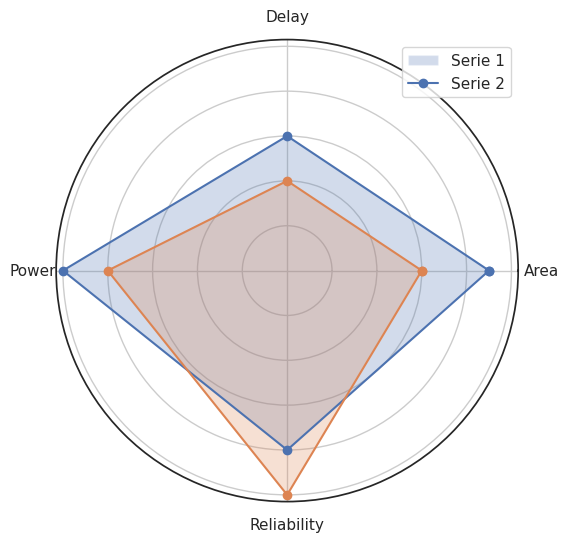

In [1474]:
import numpy as np
import matplotlib.pyplot as plt

# Datos de ejemplo
categorias = ['Area', 'Delay', 'Power', 'Reliability']
valores1 = [4.5, 3, 5, 4]
valores2 = [3, 2, 4, 5]

# Calcular los ángulos para las categorías
angulos = np.linspace(0, 2 * np.pi, len(categorias), endpoint=False).tolist()

# Crear el gráfico de radar
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))

# Dibujar las áreas sombreadas y las líneas para cada serie
ax.fill(angulos + [angulos[0]], valores1 + [valores1[0]], alpha=0.25)
ax.plot(angulos + [angulos[0]], valores1 + [valores1[0]], marker='o', linestyle='-')
ax.fill(angulos + [angulos[0]], valores2 + [valores2[0]], alpha=0.25)
ax.plot(angulos + [angulos[0]], valores2 + [valores2[0]], marker='o', linestyle='-')

# Personalizar el gráfico
ax.set_xticks(angulos)
ax.set_xticklabels(categorias)
ax.set_yticklabels([])
ax.set_rticks([1, 2, 3, 4, 5])
ax.grid(True)

# Añadir leyenda
ax.legend(['Serie 1', 'Serie 2'])

# Mostrar el gráfico
plt.show()


## Configuracion plot

In [1475]:
def plot_graph( cores, labeled_edges_cores ):
  G = nx.Graph()
  G.add_nodes_from(cores)
  G.add_edges_from(labeled_edges_cores)

  # Configuración de atributos para los nodos
  node_attributes = {}
  for node in G.nodes:
    if node.startswith('R'):  # Routers
      node_attributes[node] = {'color': 'skyblue', 'size': 1000}
    else:  # Processing Elements
        node_attributes[node] = {'color': 'gray', 'size': 500}

  position = nx.spring_layout(G)
  # Dibujo de la red con atributos personalizados
  nx.draw_networkx(
    G,
    pos = position,
    with_labels=True,
    node_size=[node_attributes[node]['size'] for node in G.nodes],
    node_color=[node_attributes[node]['color'] for node in G.nodes],
    edge_color='black')

  # Etiquetas de las aristas
  edge_labels = nx.get_edge_attributes(G, 'weight')
  nx.draw_networkx_edge_labels(
    G,
    pos=position,  # Puedes ajustar el algoritmo de posicionamiento si lo deseas
    font_color='red',
    edge_labels=labeled_edges_cores)

  plt.title( 'Application Core Graph' )
  plt.show()

In [1476]:
import networkx as nx
import matplotlib.pyplot as plt

def plot_heatmap_graph(cores, labeled_edges_cores):
    G = nx.Graph()
    G.add_nodes_from(cores)
    G.add_edges_from(labeled_edges_cores)

    # Configuración de atributos para los nodos
    node_attributes = {}
    for node in G.nodes:
        if node.startswith('R'):  # Routers
            node_attributes[node] = {'color': 'skyblue', 'size': 1000}
        else:  # Processing Elements
            node_attributes[node] = {'color': 'gray', 'size': 500}

    position = nx.spring_layout(G)

    # Dibujar los nodos originales del router
    router_nodes = [node for node in G.nodes if node.startswith('R')]

    nx.draw_networkx_nodes(
        G,
        pos=position,
        nodelist=router_nodes,
        node_size=[node_attributes[node]['size'] for node in router_nodes],
        node_color=[node_attributes[node]['color'] for node in router_nodes]
    )

    # Dibujar los recuadros semi-transparentes
    semi_transparent_size = [5.5 * node_attributes[node]['size'] for node in router_nodes]

    nx.draw_networkx_nodes(
        G,
        pos=position,
        nodelist=router_nodes,
        node_size=semi_transparent_size,
        node_color=[node_attributes[node]['color'] for node in router_nodes],
        node_shape='s',
        alpha=0.5
    )

    # Dibujar las etiquetas de los routers originales
    router_labels = {node: node for node in router_nodes}
    nx.draw_networkx_labels(
        G,
        pos=position,
        labels=router_labels,
        font_color='black',
        font_size=10
    )

    # Dibujar los demás nodos
    non_router_nodes = [node for node in G.nodes if not node.startswith('R')]

    nx.draw_networkx_nodes(
        G,
        pos=position,
        nodelist=non_router_nodes,
        node_size=[node_attributes[node]['size'] for node in non_router_nodes],
        node_color=[node_attributes[node]['color'] for node in non_router_nodes]
    )

    # Dibujar las aristas
    nx.draw_networkx_edges(
        G,
        pos=position,
        edge_color='red'
    )

    # Etiquetas de las aristas
    edge_labels = nx.get_edge_attributes(G, 'weight')
    nx.draw_networkx_edge_labels(
        G,
        pos=position,
        font_color='red',
        edge_labels=labeled_edges_cores
    )

    plt.title('Application Core Graph')

    plt.show()



## Prueba

['R1', 'R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8', 'R9']
['R1', 'R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8', 'R9']
['R1', 'R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8', 'R9']
['R1', 'R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8', 'R9']
['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9']
['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9']
['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9']
['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9']
[[0 1 0 1 0 0 0 0 0]
 [1 0 1 0 1 0 0 0 0]
 [0 1 0 0 0 1 0 0 0]
 [1 0 0 0 1 0 1 0 0]
 [0 1 0 1 0 1 0 1 0]
 [0 0 1 0 1 0 0 0 1]
 [0 0 0 1 0 0 0 1 0]
 [0 0 0 0 1 0 1 0 1]
 [0 0 0 0 0 1 0 1 0]]
[[  0  64 128   0   0   0   0   0   0]
 [ 64   0   0   0   0   0   0   0 128]
 [128   0   0 192   0   0   0   0   0]
 [  0   0 192   0  96   0   0   0   0]
 [  0   0   0  96   0   0   0   0 192]
 [  0   0   0   0   0   0  64   0  64]
 [  0   0   0   0   0  64   0  64   0]
 [  0   0   0   0   0   0  64   0   0]
 [  0 128   0   0 192  64   0   0   0]]
[[0 0 1 0 1 2 3 4 

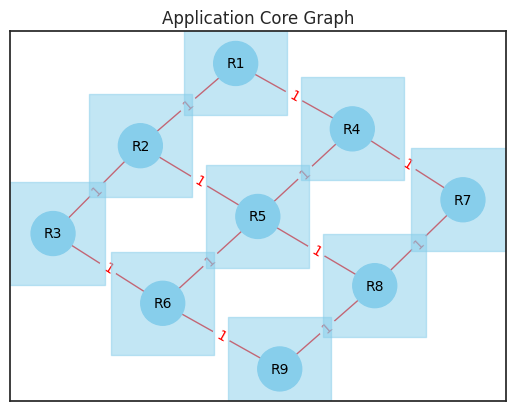

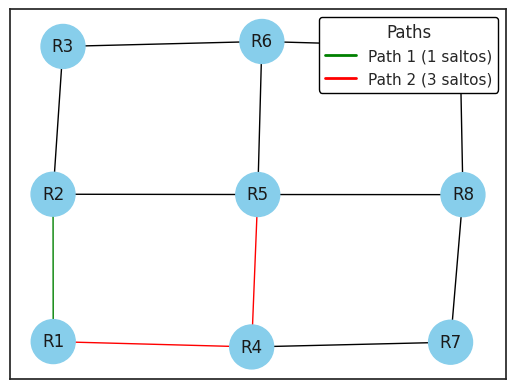

In [1477]:
cores = ['C{}'.format(index) for index in range(1, 10)]
#labeled_edges_cores = {('C1', 'C2'):30, ('C1','C3'):32, ('C1','C4'): 90, ('C2','C5'):39, ('C2', 'C9'):34, ('C3', 'C4'):22, ('C3','C6'):45, ('C4','C7'):65, ('C4','C8'):54, ('C5','C7'):84 }
labeled_edges_cores = {('C1','C2'):64, ('C1','C3'):128, ('C2','C9'):128, ('C3','C4'):192, ('C4','C5'):96, ('C5','C9'):192, ('C6','C7'):64, ('C6','C9'):64,('C7','C8'):64}

application_core = AplicationCore( cores, labeled_edges_cores )

architecture_custom  = Architecture( application_core, 'custom' )
architecture_mesh    = Architecture( application_core, 'mesh' )
architecture_torus   = Architecture( application_core, 'torus' )
architecture_ring    = Architecture( application_core, 'ring' )
#architecture_polygon = Architecture( application_core, 'polygon' )

print( architecture_custom.routers )
print( architecture_mesh.routers )
print( architecture_torus.routers )
print( architecture_ring.routers )
#print( architecture_polygon.routers )

print( architecture_custom.cores )
print( architecture_mesh.cores )
print( architecture_torus.cores )
print( architecture_ring.cores )
#print( architecture_polygon.cores )




print( architecture_mesh.adj_matrix_routers  )
print( architecture_mesh.tdg_matrix )

routing = Routing( architecture_mesh )

print( routing.next_router_matrix )
print( routing.get_all_shortest_paths() )
print( routing.get_all_k_hops_shortest_paths() )

print( routing.get_k_hops_shortest_paths_between_routers( 0,1 )  )

#print( routing.routers_labeled_dictionary )
#print( routing.edges_dictionary )
#print( routing.edges_counter_dictionary)
#print( routing.edges_labeled_dictionary )
#print( routing.edges_traffic_dictionary )


#routing.plot_heatmap_edges_graph( )
#routing.plot_heatmap_routers_graph( )
plot_heatmap_graph( architecture_mesh.routers, architecture_mesh.labeled_edges_routers )
#plot_graph( architecture_torus.routers, architecture_torus.labeled_edges_routers )

routing.plot_path( architecture_mesh.routers, architecture_mesh.labeled_edges_routers, list([['R1', 'R2'], ['R1', 'R4', 'R5', 'R2']]) )



In [1478]:
%%capture
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, clear_output
import ipywidgets as widgets



def grafica_all( source_router, destination_router ):
  paths = routing.get_k_hops_shortest_paths_between_routers( source_router, destination_router )
  print( paths )

  routers = [ f'R{index_router}' for index_router in range(1,10) ]
  paths_labeled = []
  for path in paths:
    paths_labeled.append( [ routers[index_router] for index_router in path ] )

  print( paths_labeled )
  routing.plot_path( architecture_mesh.routers, architecture_mesh.labeled_edges_routers, paths_labeled )
  clear_output(wait=True)

In [1479]:
widgets.interact( grafica_all, source_router=(0,8), destination_router=(0,8) );

interactive(children=(IntSlider(value=4, description='source_router', max=8), IntSlider(value=4, description='…

## Arquitectura Custom

In [1480]:
def grafica_all( source_router, destination_router ):
  architecture = architecture_custom
  routing = Routing( architecture )
  probability = Probability( architecture, routing.get_all_k_hops_shortest_paths() )
  paths = routing.get_k_hops_shortest_paths_between_routers( source_router, destination_router )
  paths_probability = probability.get_paths_probability_beetwen_routers( source_router, destination_router )

  routers = [ f'R{index_router}' for index_router in range(1,10) ]
  paths_labeled = []
  for path in paths:
    paths_labeled.append( [ routers[index_router] for index_router in path ] )

  probability.plot_path( architecture.routers, architecture.labeled_edges_routers, paths_labeled, paths_probability )
  clear_output(wait=True)

In [1481]:
widgets.interact( grafica_all, source_router=(0,8), destination_router=(0,8) );

interactive(children=(IntSlider(value=4, description='source_router', max=8), IntSlider(value=4, description='…

## Arquitectura Mesh

In [1482]:
def grafica_all( source_router, destination_router ):
  architecture = architecture_mesh
  routing = Routing( architecture )
  probability = Probability( architecture, routing.get_all_k_hops_shortest_paths() )
  paths = routing.get_k_hops_shortest_paths_between_routers( source_router, destination_router )
  paths_probability = probability.get_paths_probability_beetwen_routers( source_router, destination_router )

  routers = [ f'R{index_router}' for index_router in range(1,10) ]
  paths_labeled = []
  for path in paths:
    paths_labeled.append( [ routers[index_router] for index_router in path ] )

  probability.plot_path( architecture.routers, architecture.labeled_edges_routers, paths_labeled, paths_probability )
  clear_output(wait=True)

In [1483]:
widgets.interact( grafica_all, source_router=(0,8), destination_router=(0,8) );

interactive(children=(IntSlider(value=4, description='source_router', max=8), IntSlider(value=4, description='…

## Arquitectura Torus

In [1484]:
def grafica_all( source_router, destination_router ):
  architecture = architecture_torus
  routing = Routing( architecture )
  probability = Probability( architecture, routing.get_all_k_hops_shortest_paths() )
  paths = routing.get_k_hops_shortest_paths_between_routers( source_router, destination_router )
  paths_probability = probability.get_paths_probability_beetwen_routers( source_router, destination_router )

  routers = [ f'R{index_router}' for index_router in range(1,10) ]
  paths_labeled = []
  for path in paths:
    paths_labeled.append( [ routers[index_router] for index_router in path ] )

  probability.plot_path( architecture.routers, architecture.labeled_edges_routers, paths_labeled, paths_probability )
  clear_output(wait=True)

In [1485]:
widgets.interact( grafica_all, source_router=(0,8), destination_router=(0,8) );

interactive(children=(IntSlider(value=4, description='source_router', max=8), IntSlider(value=4, description='…

## Arquitectura Ring

In [1486]:
def grafica_all( source_router, destination_router ):
  architecture = architecture_ring
  routing = Routing( architecture )
  probability = Probability( architecture, routing.get_all_k_hops_shortest_paths() )
  paths = routing.get_k_hops_shortest_paths_between_routers( source_router, destination_router )
  paths_probability = probability.get_paths_probability_beetwen_routers( source_router, destination_router )

  routers = [ f'R{index_router}' for index_router in range(1,10) ]
  paths_labeled = []
  for path in paths:
    paths_labeled.append( [ routers[index_router] for index_router in path ] )

  probability.plot_path( architecture.routers, architecture.labeled_edges_routers, paths_labeled, paths_probability )
  clear_output(wait=True)

In [1487]:
widgets.interact( grafica_all, source_router=(0,8), destination_router=(0,8) );

interactive(children=(IntSlider(value=4, description='source_router', max=8), IntSlider(value=4, description='…

## Información

3
0
['R1', 'R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8', 'R9']
['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9']
{('R1', 'R4'): 1, ('R1', 'R2'): 1, ('R2', 'R5'): 1, ('R2', 'R3'): 1, ('R3', 'R6'): 1, ('R3', 'R1'): 1, ('R4', 'R7'): 1, ('R4', 'R5'): 1, ('R5', 'R8'): 1, ('R5', 'R6'): 1, ('R6', 'R9'): 1, ('R6', 'R4'): 1, ('R7', 'R1'): 1, ('R7', 'R8'): 1, ('R8', 'R2'): 1, ('R8', 'R9'): 1, ('R9', 'R3'): 1, ('R9', 'R7'): 1, ('R4', 'R1'): 1, ('R2', 'R1'): 1, ('R5', 'R2'): 1, ('R3', 'R2'): 1, ('R6', 'R3'): 1, ('R1', 'R3'): 1, ('R7', 'R4'): 1, ('R5', 'R4'): 1, ('R8', 'R5'): 1, ('R6', 'R5'): 1, ('R9', 'R6'): 1, ('R4', 'R6'): 1, ('R1', 'R7'): 1, ('R8', 'R7'): 1, ('R2', 'R8'): 1, ('R9', 'R8'): 1, ('R3', 'R9'): 1, ('R7', 'R9'): 1}
{('C4', 'R2'): 1, ('C8', 'R3'): 1, ('C1', 'R4'): 1, ('C9', 'R7'): 1, ('C3', 'R5'): 1, ('C7', 'R8'): 1, ('C5', 'R1'): 1, ('C2', 'R9'): 1, ('C6', 'R6'): 1, ('R2', 'C4'): 1, ('R3', 'C8'): 1, ('R4', 'C1'): 1, ('R7', 'C9'): 1, ('R5', 'C3'): 1, ('R8', 'C7'): 1, ('R1', 'C5'): 1, 

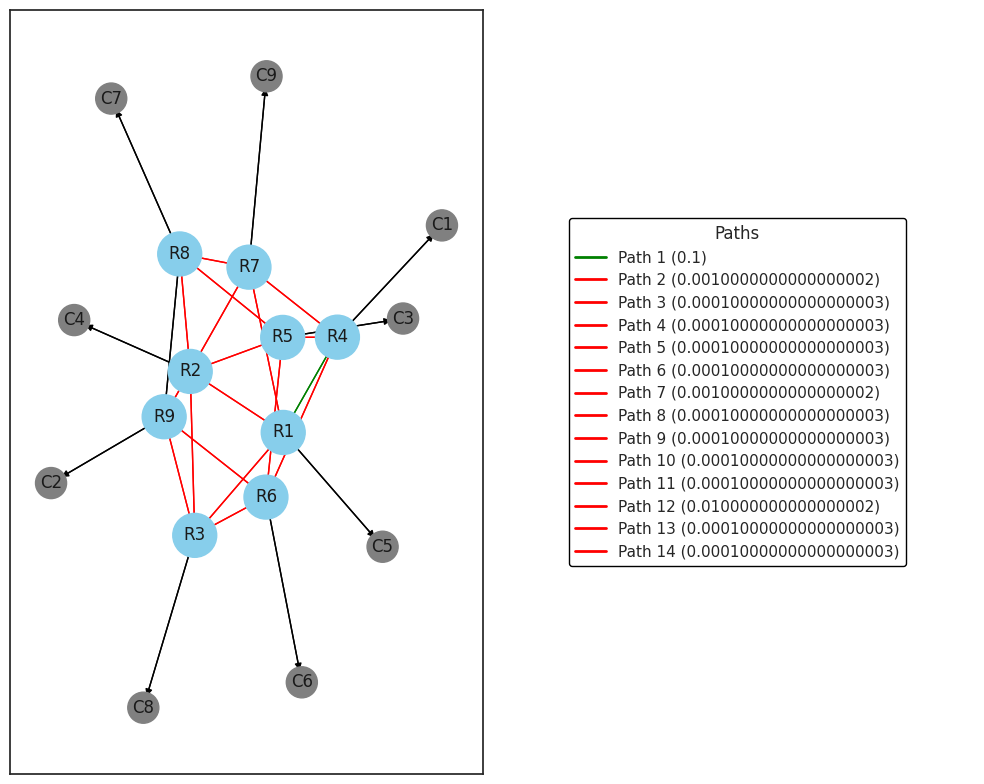

In [1488]:
architecture = architecture_torus



source_core = 0
destination_core = 4

source_router      = int(architecture.get_router_from_core( source_core )[0])
destination_router = int(architecture.get_router_from_core( destination_core )[0])



print( source_router )
print( destination_router )

routing = Routing( architecture )
probability = Probability( architecture, routing.get_all_k_hops_shortest_paths() )
paths = routing.get_k_hops_shortest_paths_between_routers( source_router, destination_router )
paths_probability = probability.get_paths_probability_beetwen_routers( source_router, destination_router )


routers = [ f'R{index_router}' for index_router in range(1,10) ]
paths_labeled = []
for path in paths:
    paths_labeled.append( [ routers[index_router] for index_router in path ] )

print( architecture.routers )
print( architecture.cores )
print( architecture.labeled_edges_routers )
print( architecture.labeled_edges_cores_to_routers )
print( paths )
print( paths_labeled )

probability.plot_path_full( architecture.routers, architecture.labeled_edges_routers, architecture.cores, architecture.labeled_edges_cores_to_routers, paths_labeled, paths_probability )

## Arquitectura Custom

In [1489]:
def grafica_all( source_core, destination_core ):
  architecture = architecture_custom

  source_router      = int(architecture.get_router_from_core( source_core )[0])
  destination_router = int(architecture.get_router_from_core( destination_core )[0])

  routing = Routing( architecture )
  probability = Probability( architecture, routing.get_all_k_hops_shortest_paths() )
  paths = routing.get_k_hops_shortest_paths_between_routers( source_router, destination_router )
  paths_probability = probability.get_paths_probability_beetwen_routers( source_router, destination_router )


  routers = [ f'R{index_router}' for index_router in range(1,10) ]
  paths_labeled = []
  for path in paths:
    paths_labeled.append( [ routers[index_router] for index_router in path ] )

  probability.plot_path_full( architecture.routers, architecture.labeled_edges_routers, architecture.cores, architecture.labeled_edges_cores_to_routers, paths_labeled, paths_probability )

In [1490]:
widgets.interact( grafica_all, source_core=(0,8), destination_core=(0,8) );

interactive(children=(IntSlider(value=4, description='source_core', max=8), IntSlider(value=4, description='de…

## Arquitectura Mesh

In [1491]:
def grafica_all( source_core, destination_core ):
  architecture = architecture_mesh

  source_router      = int(architecture.get_router_from_core( source_core )[0])
  destination_router = int(architecture.get_router_from_core( destination_core )[0])

  routing = Routing( architecture )
  probability = Probability( architecture, routing.get_all_k_hops_shortest_paths() )
  paths = routing.get_k_hops_shortest_paths_between_routers( source_router, destination_router )
  paths_probability = probability.get_paths_probability_beetwen_routers( source_router, destination_router )


  routers = [ f'R{index_router}' for index_router in range(1,10) ]
  paths_labeled = []
  for path in paths:
    paths_labeled.append( [ routers[index_router] for index_router in path ] )

  probability.plot_path_full( architecture.routers, architecture.labeled_edges_routers, architecture.cores, architecture.labeled_edges_cores_to_routers, paths_labeled, paths_probability )

In [1492]:
widgets.interact( grafica_all, source_core=(0,8), destination_core=(0,8) );

interactive(children=(IntSlider(value=4, description='source_core', max=8), IntSlider(value=4, description='de…

## Arquitectura Torus

In [1493]:
def grafica_all( source_core, destination_core ):
  architecture = architecture_torus

  source_router      = int(architecture.get_router_from_core( source_core )[0])
  destination_router = int(architecture.get_router_from_core( destination_core )[0])

  routing = Routing( architecture )
  probability = Probability( architecture, routing.get_all_k_hops_shortest_paths() )
  paths = routing.get_k_hops_shortest_paths_between_routers( source_router, destination_router )
  paths_probability = probability.get_paths_probability_beetwen_routers( source_router, destination_router )


  routers = [ f'R{index_router}' for index_router in range(1,10) ]
  paths_labeled = []
  for path in paths:
    paths_labeled.append( [ routers[index_router] for index_router in path ] )

  probability.plot_path_full( architecture.routers, architecture.labeled_edges_routers, architecture.cores, architecture.labeled_edges_cores_to_routers, paths_labeled, paths_probability )

In [1494]:
widgets.interact( grafica_all, source_core=(0,8), destination_core=(0,8) );

interactive(children=(IntSlider(value=4, description='source_core', max=8), IntSlider(value=4, description='de…

## Arquitectura Ring

In [1495]:
def grafica_all( source_core, destination_core ):
  architecture = architecture_ring

  source_router      = int(architecture.get_router_from_core( source_core )[0])
  destination_router = int(architecture.get_router_from_core( destination_core )[0])

  routing = Routing( architecture )
  probability = Probability( architecture, routing.get_all_k_hops_shortest_paths() )
  paths = routing.get_k_hops_shortest_paths_between_routers( source_router, destination_router )
  paths_probability = probability.get_paths_probability_beetwen_routers( source_router, destination_router )


  routers = [ f'R{index_router}' for index_router in range(1,10) ]
  paths_labeled = []
  for path in paths:
    paths_labeled.append( [ routers[index_router] for index_router in path ] )

  probability.plot_path_full( architecture.routers, architecture.labeled_edges_routers, architecture.cores, architecture.labeled_edges_cores_to_routers, paths_labeled, paths_probability )

In [1496]:
widgets.interact( grafica_all, source_core=(0,8), destination_core=(0,8) );

interactive(children=(IntSlider(value=4, description='source_core', max=8), IntSlider(value=4, description='de…

In [1497]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

# Configuración de atributos para los nodos
def configure_node_attributes(G):
    node_attributes = {}
    for node in G.nodes:
        if node.startswith('R'):  # Routers
            node_attributes[node] = {'color': 'skyblue', 'size': 1000}
        else:  # Processing Elements
            node_attributes[node] = {'color': 'gray', 'size': 500}
    return node_attributes

# Graficar población en subplots
def plot_population(population):
    num_individuals = len(population)
    num_cols = 3  # Número de columnas en los subplots
    num_rows = (num_individuals - 1) // num_cols + 1  # Número de filas en los subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 8))

    if num_rows == 1:
        axes = np.expand_dims(axes, axis=0)

    current_ax = 0

    for i, individual in enumerate(population):
        row = current_ax // num_cols
        col = current_ax % num_cols
        ax = axes[row, col]

        G = nx.Graph()
        G.add_nodes_from(individual.routers)
        G.add_edges_from(individual.labeled_edges_routers)
        G.add_nodes_from(individual.cores)
        G.add_edges_from(individual.labeled_edges_cores_to_routers)

        node_attributes = configure_node_attributes(G)

        ax.set_title(f'Architecture #{i+1}: {individual.hop_average_per_core:0.2f}')
        nx.draw_networkx(
            G,
            with_labels=True,
            node_size=[node_attributes[node]['size'] for node in G.nodes],
            node_color=[node_attributes[node]['color'] for node in G.nodes],
            edge_color='black',
            ax=ax)

        current_ax += 1

    # Eliminar subgráficos no utilizados
    for i in range(len(population), num_rows * num_cols):
        row = current_ax // num_cols
        col = current_ax % num_cols
        axes[row, col].axis('off')
        current_ax += 1

    plt.tight_layout()
    plt.show()

## Plots

In [1498]:
print( architecture_mesh.topology.routers_positions )
print( architecture_mesh.topology.cores_positions )

print( architecture_mesh.topology.labeled_edges_routers )
print( architecture_mesh.topology.labeled_edges_cores_to_routers )

{'R1': (0, 0), 'R2': (1, 0), 'R3': (2, 0), 'R4': (0, -1), 'R5': (1, -1), 'R6': (2, -1), 'R7': (0, -2), 'R8': (1, -2), 'R9': (2, -2)}
{'C1': (-0.2, -2.2), 'C2': (0.8, -2.2), 'C3': (1.8, -2.2), 'C4': (1.8, -0.2), 'C5': (1.8, -1.2), 'C6': (0.8, -0.2), 'C7': (-0.2, -1.2), 'C8': (-0.2, -0.2), 'C9': (0.8, -1.2)}
{('R1', 'R2'): 1, ('R1', 'R4'): 1, ('R2', 'R3'): 1, ('R2', 'R5'): 1, ('R3', 'R6'): 1, ('R4', 'R5'): 1, ('R4', 'R7'): 1, ('R5', 'R6'): 1, ('R5', 'R8'): 1, ('R6', 'R9'): 1, ('R7', 'R8'): 1, ('R8', 'R9'): 1, ('R2', 'R1'): 1, ('R4', 'R1'): 1, ('R3', 'R2'): 1, ('R5', 'R2'): 1, ('R6', 'R3'): 1, ('R5', 'R4'): 1, ('R7', 'R4'): 1, ('R6', 'R5'): 1, ('R8', 'R5'): 1, ('R9', 'R6'): 1, ('R8', 'R7'): 1, ('R9', 'R8'): 1}
{('C9', 'R5'): 1, ('C5', 'R6'): 1, ('C2', 'R8'): 1, ('C1', 'R7'): 1, ('C6', 'R2'): 1, ('C8', 'R1'): 1, ('C3', 'R9'): 1, ('C7', 'R4'): 1, ('C4', 'R3'): 1, ('R5', 'C9'): 1, ('R6', 'C5'): 1, ('R8', 'C2'): 1, ('R7', 'C1'): 1, ('R2', 'C6'): 1, ('R1', 'C8'): 1, ('R9', 'C3'): 1, ('R4', 'C7

## Arquitectura Custom

In [1499]:
def grafica_all( source_core, destination_core ):
  architecture = architecture_mesh

  source_router      = int(architecture.get_router_from_core( source_core )[0])
  destination_router = int(architecture.get_router_from_core( destination_core )[0])

  routing = Routing( architecture )
  probability = Probability( architecture, routing.get_all_k_hops_shortest_paths() )
  paths = routing.get_k_hops_shortest_paths_between_routers( source_router, destination_router )
  paths_probability = probability.get_paths_probability_beetwen_routers( source_router, destination_router )


  routers = [ f'R{index_router}' for index_router in range(1,10) ]
  paths_labeled = []
  for path in paths:
    paths_labeled.append( [ routers[index_router] for index_router in path ] )

  probability.plot_path_full_position( architecture.routers, architecture_mesh.topology.routers_positions, architecture.labeled_edges_routers, architecture.cores, architecture.topology.cores_positions, architecture.labeled_edges_cores_to_routers, paths_labeled, paths_probability )

In [1500]:
widgets.interact( grafica_all, source_core=(0,8), destination_core=(0,8) );

interactive(children=(IntSlider(value=4, description='source_core', max=8), IntSlider(value=4, description='de…

## Routers y Cores

In [1501]:
# Obtener el router al que está conectado el procesador
def get_router_by_pe(processor, labeled_edges_cores_to_routers):
    for (pe, router), _ in labeled_edges_cores_to_routers.items():
        if pe == processor:
            return router
    return None

def draw_curved_arc(start_pos, end_pos):
  # Cálculo de las coordenadas del arco curvado
  # Puedes ajustar los parámetros según tus necesidades
  control_point_x = (start_pos[0] + end_pos[0]) / 2
  control_point_y = (start_pos[1] + end_pos[1]) / 2 - 0.5
  curve = [(start_pos[0], start_pos[1]), (control_point_x, control_point_y), (end_pos[0], end_pos[1])]
  return curve

def draw_bezier_curve(start_pos, end_pos):
  # Cálculo de las coordenadas de la curva de Bézier
  # Puedes ajustar los parámetros según tus necesidades
  control_point_x = start_pos[0]
  control_point_y = end_pos[1]
  curve = [(start_pos[0], start_pos[1]), (control_point_x, control_point_y), (end_pos[0], end_pos[1])]
  return curve

def configure_node_attributes(G, labeled_edges_cores_to_routers, topology):
    node_attributes = {}
    node_positions = {}

    if topology == 'custom':
      num_routers = len([node for node in G.nodes if node.startswith('R')])
      num_rows = int(np.sqrt(num_routers))
      num_cols = int(np.ceil(num_routers / num_rows))

      for i, node in enumerate(G.nodes):
        if node.startswith('R'):  # Routers
          node_attributes[node] = {'color': 'skyblue', 'size': 1000}
          row = i // num_cols
          col = i % num_cols
          node_positions[node] = nx.spring_layout(G)[node]# Invertir el eje y para que los routers superiores estén arriba
        else:  # Processing Elements
          node_attributes[node] = {'color': 'gray', 'size': 500}

          router = get_router_by_pe(node, labeled_edges_cores_to_routers)  # Obtener el número de router al que está conectado el PE
          if router is None:
            continue  # Si no se encuentra el router, pasar al siguiente procesador

          router_pos = node_positions[router]  # Obtener la posición del router correspondiente
          pe_pos = (router_pos[0] - 0.2, router_pos[1] - 0.2)  # Posición relativa al router (un poco a la izquierda y abajo)
          node_positions[node] = pe_pos

    if topology == 'mesh':
      num_routers = len([node for node in G.nodes if node.startswith('R')])
      num_rows = int(np.sqrt(num_routers))
      num_cols = int(np.ceil(num_routers / num_rows))

      for i, node in enumerate(G.nodes):
        if node.startswith('R'):  # Routers
          node_attributes[node] = {'color': 'skyblue', 'size': 1000}
          row = i // num_cols
          col = i % num_cols
          node_positions[node] = (col, -row)  # Invertir el eje y para que los routers superiores estén arriba
        else:  # Processing Elements
          node_attributes[node] = {'color': 'gray', 'size': 500}

          router = get_router_by_pe(node, labeled_edges_cores_to_routers)  # Obtener el número de router al que está conectado el PE
          if router is None:
            continue  # Si no se encuentra el router, pasar al siguiente procesador

          router_pos = node_positions[router]  # Obtener la posición del router correspondiente
          pe_pos = (router_pos[0] - 0.2, router_pos[1] - 0.2)  # Posición relativa al router (un poco a la izquierda y abajo)
          node_positions[node] = pe_pos

    elif topology == 'torus':
      num_routers = len([node for node in G.nodes if node.startswith('R')])
      num_rows = int(np.sqrt(num_routers))
      num_cols = int(np.ceil(num_routers / num_rows))

      for i, node in enumerate(G.nodes):
        if node.startswith('R'):  # Routers
          node_attributes[node] = {'color': 'skyblue', 'size': 1000}
          row = i // num_cols
          col = i % num_cols
          node_positions[node] = (col, -row)  # Invertir el eje y para que los routers superiores estén arriba
        else:  # Processing Elements
          node_attributes[node] = {'color': 'gray', 'size': 500}

          router = get_router_by_pe(node, labeled_edges_cores_to_routers)  # Obtener el número de router al que está conectado el PE
          if router is None:
            continue  # Si no se encuentra el router, pasar al siguiente procesador

          router_pos = node_positions[router]  # Obtener la posición del router correspondiente
          pe_pos = (router_pos[0] - 0.2, router_pos[1] - 0.2)  # Posición relativa al router (un poco a la izquierda y abajo)
          node_positions[node] = pe_pos

      # Modificar las aristas seleccionadas para que sean curvas
      curved_edges = [('R1', 'R7'), ('R2', 'R8'), ('R3', 'R9'), ('R1', 'R3'), ('R4', 'R6'), ('R7', 'R9')]
      for edge in curved_edges:
        router1 = edge[0]
        router2 = edge[1]
        node_positions[edge] = draw_bezier_curve(node_positions[router1], node_positions[router2])


    elif topology == 'ring':
        num_nodes = 9
        radius = 1.0  # Radio del anillo

        for i, node in enumerate(G.nodes):
            if node.startswith('R'):  # Routers
                node_attributes[node] = {'color': 'skyblue', 'size': 1000}
                angle = 2 * np.pi * i / num_nodes  # Ángulo correspondiente al nodo en el anillo
                x = radius * np.cos(angle)  # Coordenada x basada en el ángulo y el radio
                y = radius * np.sin(angle)  # Coordenada y basada en el ángulo y el radio
                node_positions[node] = (x, y)
            else:  # Processing Elements
                node_attributes[node] = {'color': 'gray', 'size': 500}

                router = get_router_by_pe(node, labeled_edges_cores_to_routers)  # Obtener el número de router al que está conectado el PE
                if router is None:
                    continue  # Si no se encuentra el router, pasar al siguiente procesador

                router_pos = node_positions[router]  # Obtener la posición del router correspondiente
                pe_pos = (router_pos[0] - 0.2, router_pos[1] - 0.2)  # Posición relativa al router (un poco a la izquierda y abajo)
                node_positions[node] = pe_pos

    return node_attributes, node_positions

def plot_population(population):
  num_architectures = len(population)
  num_cols = 2  # Update the number of columns as needed
  num_rows = int(np.ceil(num_architectures / num_cols))

  figsize_width = 12  # Ancho deseado de la figura
  figsize_height = 8 + 2 * num_rows  # Altura deseada de la figura (ajuste según necesidades)

  fig, axes = plt.subplots(num_rows, num_cols, figsize=(figsize_width, figsize_height), sharex=True, sharey=True)
  fig.tight_layout(pad=5)

  current_ax = 0

  for i, individual in enumerate(population):
    row = current_ax // num_cols
    col = current_ax % num_cols
    ax = axes[row, col]

    G = nx.Graph()
    G.add_nodes_from(individual.routers)
    G.add_edges_from(individual.labeled_edges_routers)
    G.add_nodes_from(individual.cores)
    G.add_edges_from(individual.labeled_edges_cores_to_routers)

    node_attributes, node_positions = configure_node_attributes(G, individual.labeled_edges_cores_to_routers, individual.topology_type)

    ax.set_title(f'Architecture #{i+1}')

    # Dibujar los nodos
    nx.draw_networkx_nodes(
        G,
        pos=node_positions,
        node_size=[node_attributes[node]['size'] for node in G.nodes],
        node_color=[node_attributes[node]['color'] for node in G.nodes],
        ax=ax
    )

    # Dibujar las aristas (conexiones)
    for edge in G.edges:
        if edge in [("R1", "R7"), ("R2", "R8"), ("R3", "R9"), ("R1", "R3"), ("R4", "R6"), ("R7", "R9")]:
          connectionstyle = "arc3,rad=0.4"  # Especificar el estilo de conexión curva
          nx.draw_networkx_edges(
            G,
            pos=node_positions,
            edgelist=[edge],
            edge_color='black',
            arrows=True,
            connectionstyle=connectionstyle,
            ax=ax
          )


        else:
          connectionstyle = "None"  # Estilo de conexión por defecto

          nx.draw_networkx_edges(
            G,
            pos=node_positions,
            edgelist=[edge],
            edge_color='black',
            arrows=True,
            ax=ax
        )

    # Dibujar las etiquetas de los nodos
    nx.draw_networkx_labels(
        G,
        pos=node_positions,
        ax=ax
    )

    current_ax += 1


    # Eliminar subgráficos no utilizados
  for i in range(len(population), num_rows * num_cols):
    row = current_ax // num_cols
    col = current_ax % num_cols
    axes[row, col].axis('off')
    current_ax += 1

  plt.tight_layout()
  plt.show()


# Generación de Arquitecturas

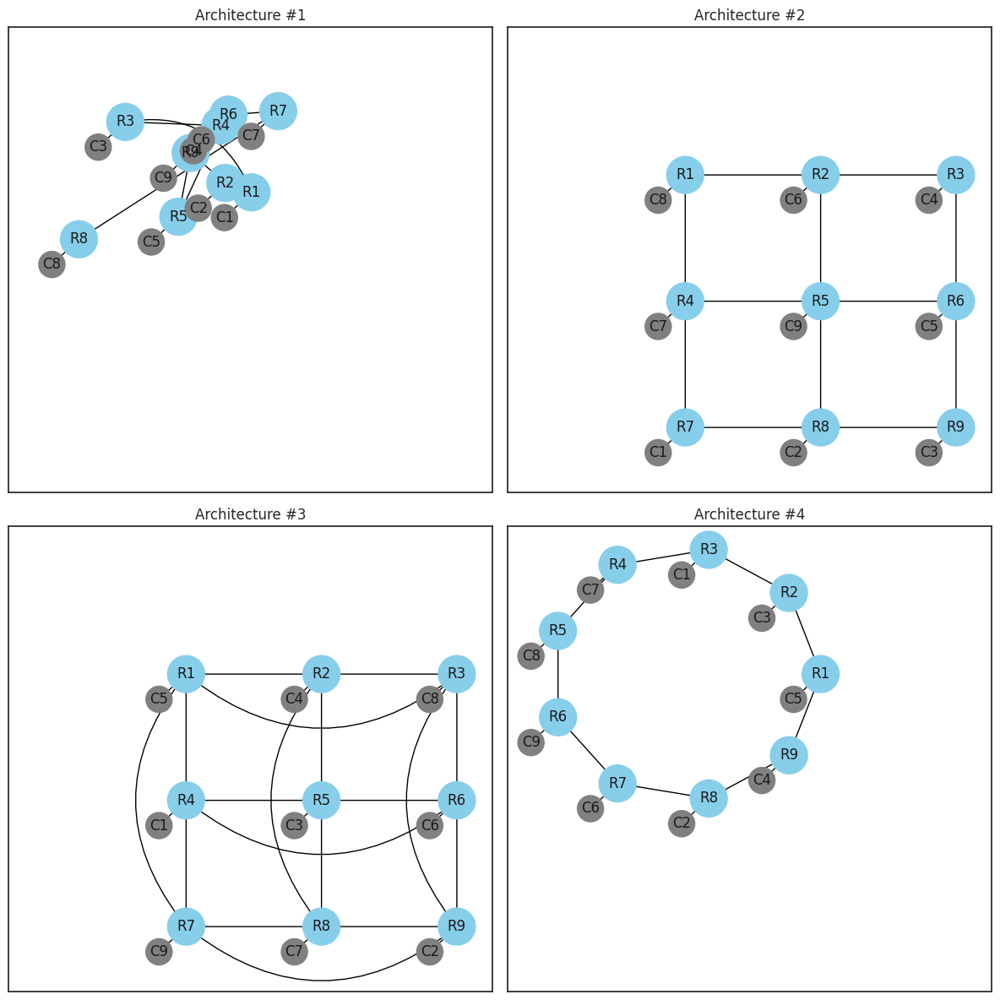

In [1502]:
population = []
population.append( architecture_custom )
population.append( architecture_mesh )
population.append( architecture_torus )
population.append( architecture_ring )
#population.append( architecture_polygon )
plot_population( population )


In [1503]:
architecture_mesh.link_number_total
architecture_mesh.port_number_per_router
architecture_mesh.port_number_type_per_router

['3-port',
 '4-port',
 '3-port',
 '4-port',
 '5-port',
 '4-port',
 '3-port',
 '4-port',
 '3-port']

# Generación de población

## Generación Aleatoria

### Arquitectura Custom

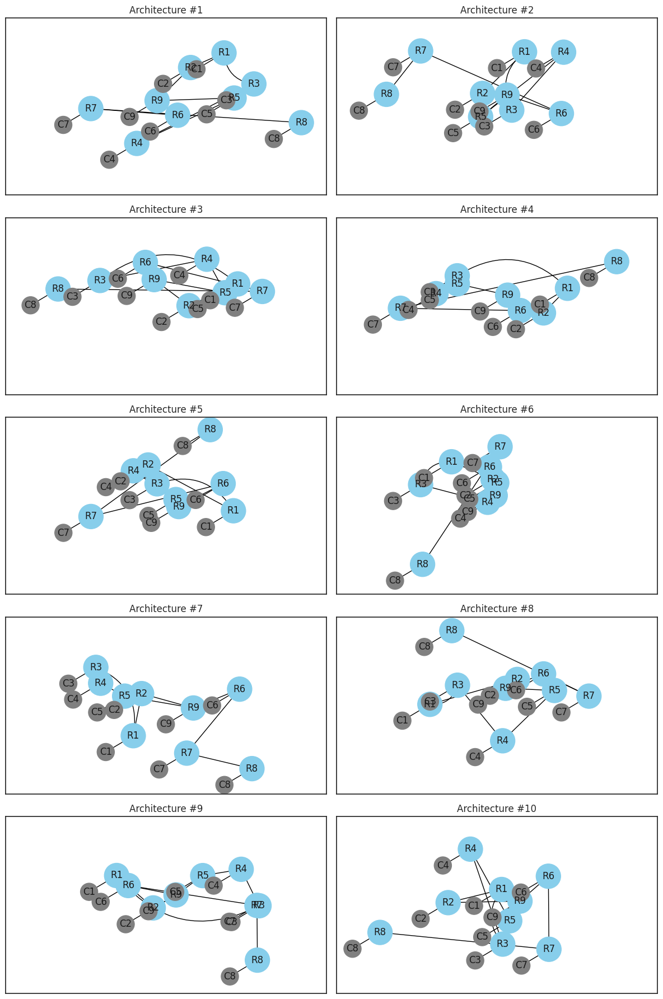

In [1504]:
def generate_population(  number_of_individues ):

  population = []

  for _ in range( number_of_individues ):
    population.append( Architecture( application_core, 'custom' )  )

  return population

population_custom = generate_population( 10 )

plot_population( population_custom )

### Arquitectura Mesh

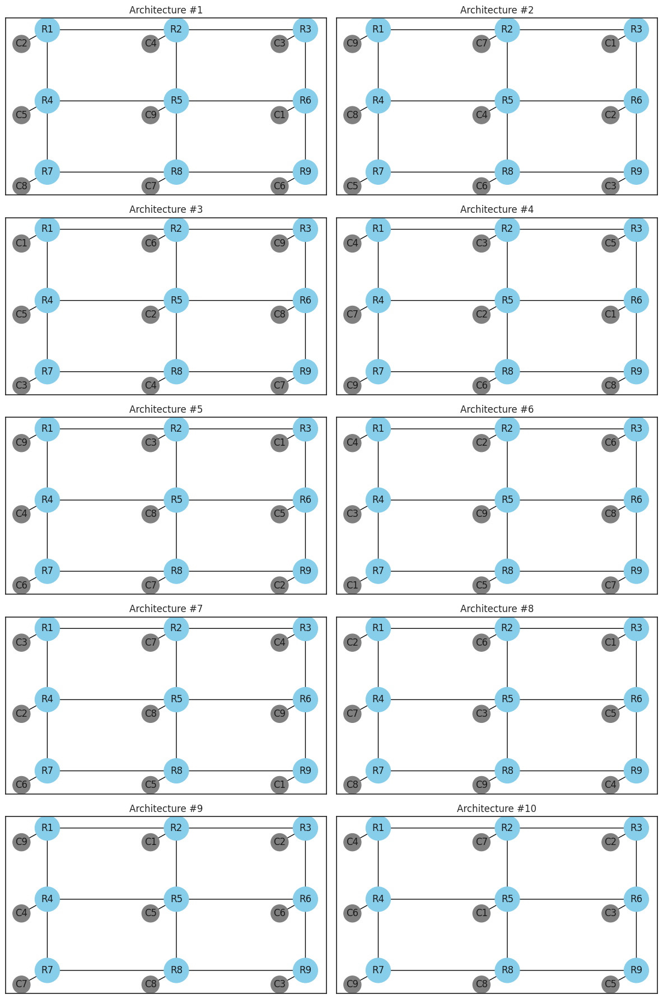

In [1505]:
def generate_population(  number_of_individues ):

  population = []

  for _ in range( number_of_individues ):
    population.append( Architecture( application_core, 'mesh' )  )

  return population

population_mesh =  generate_population( 10 )
plot_population( population_mesh )

### Arquitectura Torus

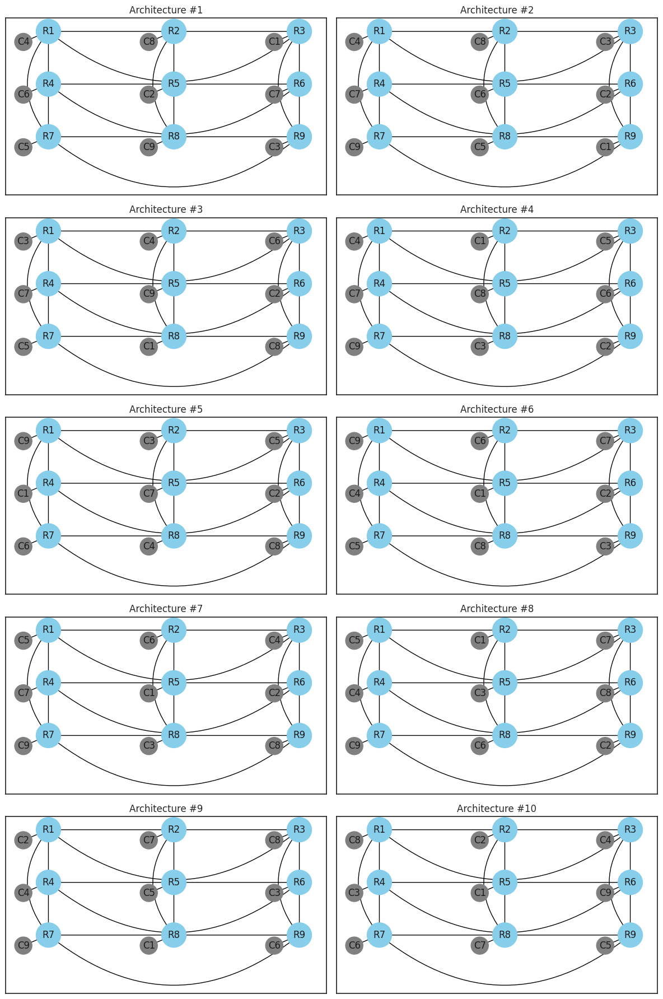

In [1506]:
def generate_population( number_of_individues ):

  population = []

  for _ in range( number_of_individues ):
    population.append( Architecture( application_core, 'torus' )  )

  return population

population_torus =  generate_population( 10 )
plot_population( population_torus )

### Arquitectura Ring

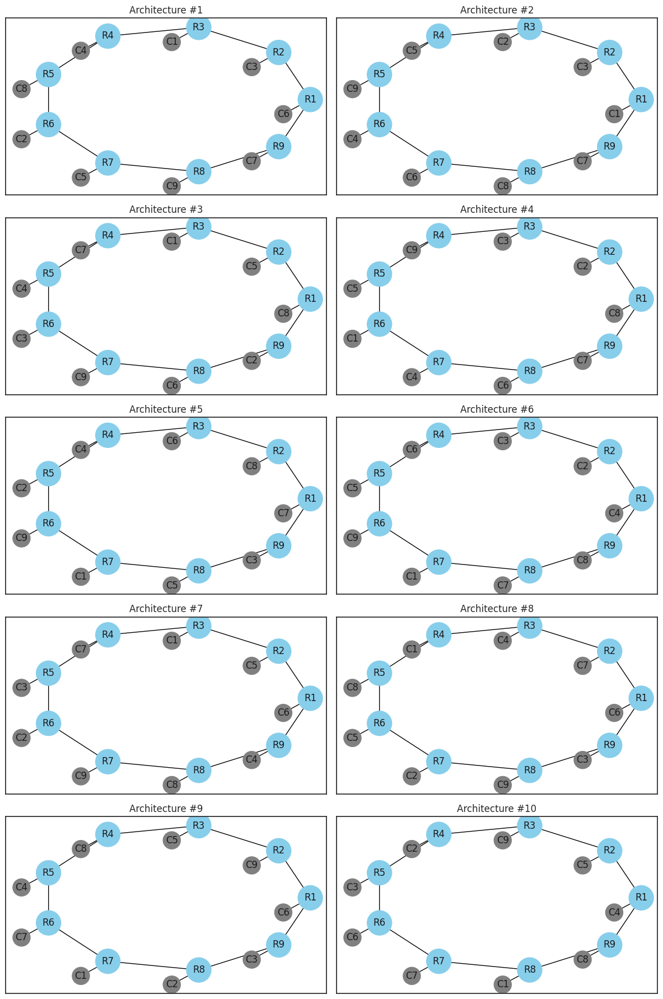

In [1507]:
def generate_population( number_of_individues ):

  population = []

  for _ in range( number_of_individues ):
    population.append( Architecture( application_core, 'ring' )  )

  return population

population_ring =  generate_population( 10 )
plot_population( population_ring )

## Generación Deterministica

### Arquitectura Custom

### Arquitectura Mesh

### Arquitectura Torus

### Arquitectura Ring

# Selección

In [1508]:
def selection( population, population_fitness ):
  best_individuals_indices = np.argsort( population_fitness )[:2]
  best_individuals = [population[index] for index in best_individuals_indices]
  return best_individuals

### Arquitectura Custom

### Arquitectura Mesh

### Arquitectura Torus

### Arquitectura Ring

# Mutación

In [1509]:
def mutation_custom( architecture, number_of_mutations ):

  application_core = architecture.application_core
  topology_type    = architecture.topology_type
  chromosome       = architecture.chromosome

  chromosome_mutate = chromosome.copy()

  population_mutants = []

  for _ in range ( number_of_mutations ):
    index = np.random.choice( len(chromosome), size=1, replace=False )
    chromosome_mutate[index] = 1 - chromosome_mutate[index]

  mutated_architecture = Architecture(application_core,topology_type,chromosome_mutate)
  population_mutants.append( mutated_architecture )

  return population_mutants

In [1510]:
def mutation_standard( architecture, number_of_mutations ):

  application_core = architecture.application_core
  topology_type    = architecture.topology_type
  chromosome       = architecture.chromosome

  chromosome_mutate = chromosome.copy()

  population_mutants = []

  for _ in range( number_of_mutations ):
    index_1, index_2 = np.random.choice( len(chromosome), size=2, replace=False )
    chromosome_mutate[index_1], chromosome_mutate[index_2] = (chromosome_mutate[index_2], chromosome_mutate[index_1])

  mutated_architecture = Architecture(application_core,topology_type,chromosome_mutate)
  population_mutants.append( mutated_architecture )

  return population_mutants

In [1511]:
def mutation_population( population, number_of_individuals_to_mutate, number_of_mutants_per_individual, number_of_mutations ):
  mutated_population = []

  indices_population_to_mutate = np.random.choice(len(population), size=number_of_individuals_to_mutate, replace=False)

  for index_to_mutate in indices_population_to_mutate:
    for number_of_mutate in range(number_of_mutants_per_individual):
      individual = population[index_to_mutate]

      if individual.topology_type == 'custom':
        mutated_individuals = mutation_standard(individual, number_of_mutations)

      else:
        mutated_individuals = mutation_standard(individual, number_of_mutations)

      mutated_population.extend(mutated_individuals)

  population.extend( mutated_population )

  return population

## Aquitectura Custom

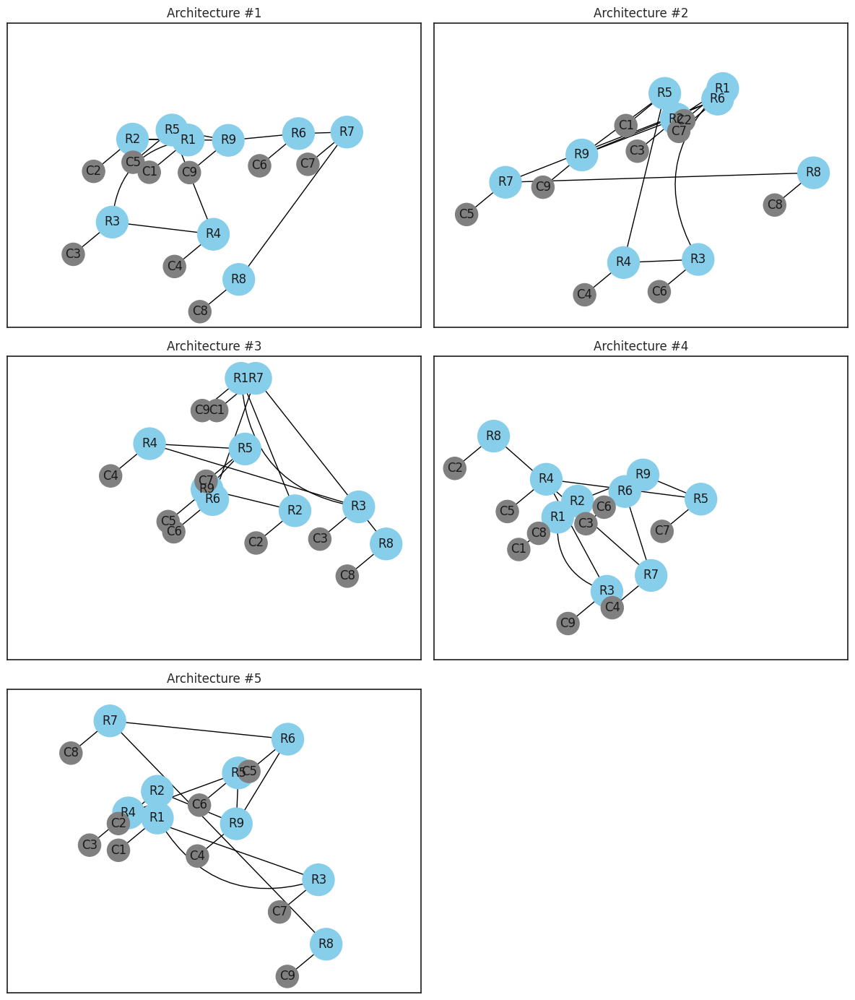

In [1512]:
population = []
population.append( architecture_custom )
population = mutation_population( population, 1, 4, 5 )

plot_population( population )

## Arquitectura Mesh

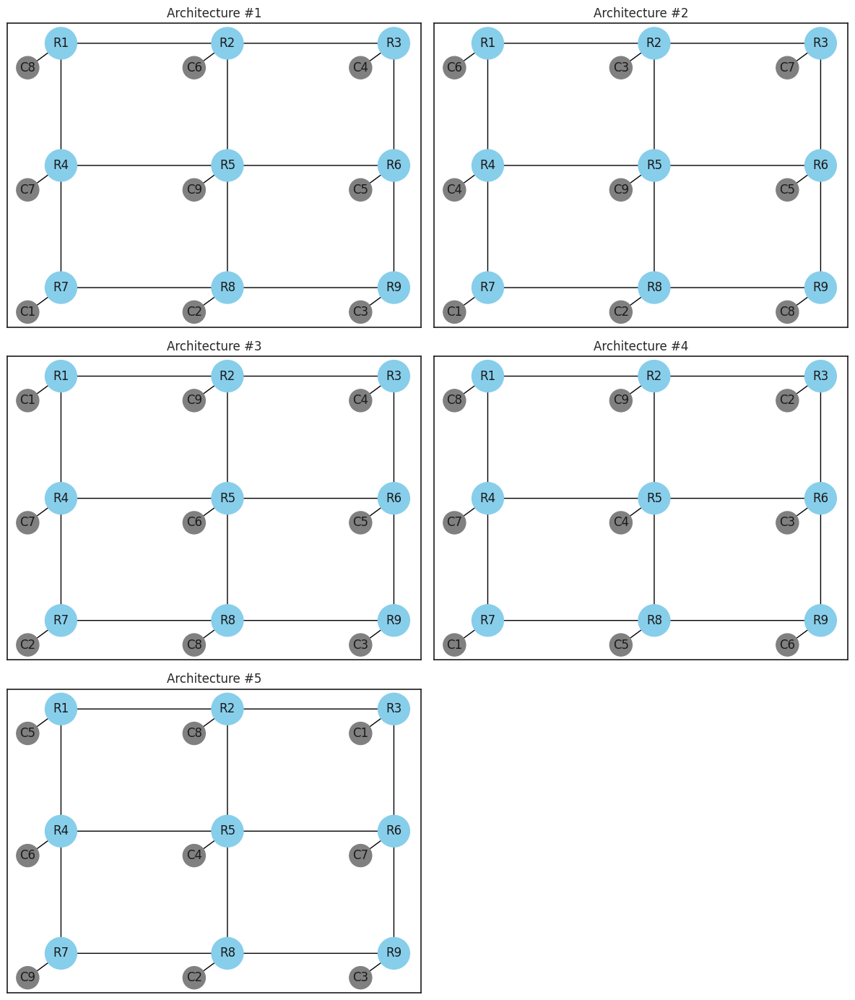

In [1513]:
population = []
population.append( architecture_mesh )
population = mutation_population( population, 1, 4, 5 )

plot_population( population )

## Arquitectura Torus

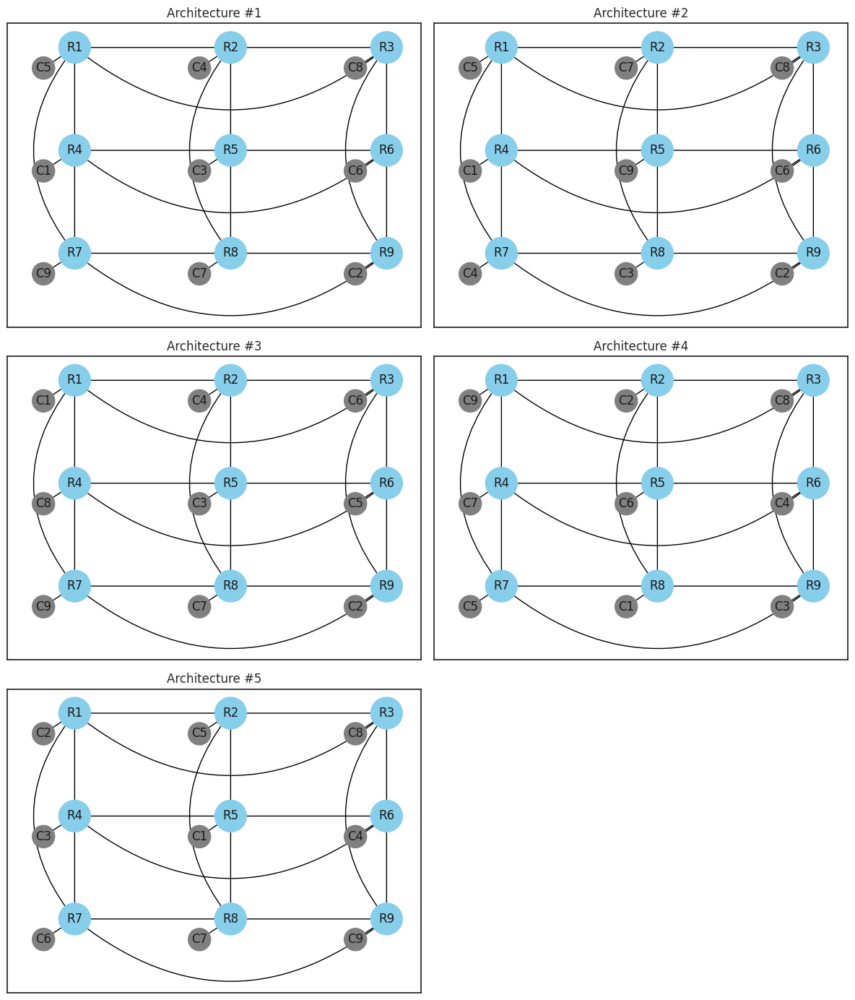

In [1514]:
population = []
population.append( architecture_torus )
population  = mutation_population( population, 1, 4, 5 )

plot_population( population )

## Arquitectura Ring

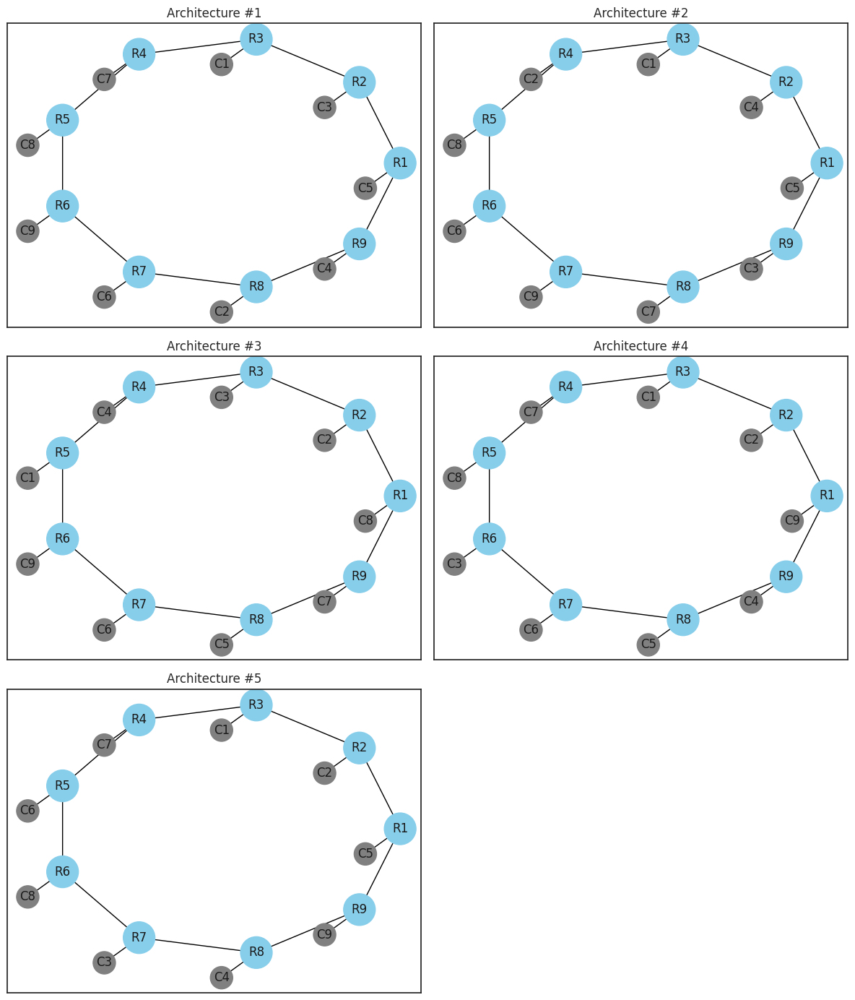

In [1515]:
population = []
population.append( architecture_ring )
population  = mutation_population( population, 1, 4, 5 )

plot_population( population )

# Cruzamiento

In [1516]:
def crossover_standard( architecture ):

  kid_chromosome = []
  kid_chromosome.append( architecture.chromosome )

  kid_architectures = []

  number_of_kids = 3

  for kid in range( 1, number_of_kids + 1 ):
      print( f'\nNumber of kid: {kid}'  )

      select_router = np.random.choice(range(len(architecture.routers)))
      select_core   = kid_chromosome[kid-1][select_router]

      print(f"Selected Router: [{select_router}], Selected Core: [{select_core}]")

      adjacent_routers = [i for i, adj_value in enumerate(architecture.adj_matrix_routers[select_router]) if adj_value != 0]

      print(f"Adjacent Routers to Router [{select_router}]: {adjacent_routers}")

      swap_router_1 = np.random.choice(adjacent_routers)
      swap_core_1   = kid_chromosome[kid-1][swap_router_1]

      print(f"Swap Router 1:[{swap_router_1}], Swap Core 1: [{swap_core_1}]")

      communicating_cores = [i for i, adj_value in enumerate(architecture.tdg_matrix[select_core]) if adj_value != 0]

      print(f"Cores with communication to [{select_core}] in Core Graph: {communicating_cores}")

      swap_core_2 = np.random.choice(communicating_cores)


      kid_chromosome.append( kid_chromosome[kid-1] )

      idx_1 = list(kid_chromosome[kid]).index(swap_core_1)
      idx_2 = list(kid_chromosome[kid]).index(swap_core_2)


      print( f'Cores [{swap_core_1}, {swap_core_2}] to swap Routers [{idx_1}, {idx_2}]')

      kid_chromosome[kid][idx_1], kid_chromosome[kid][idx_2] = kid_chromosome[kid-1][idx_2], kid_chromosome[kid-1][idx_1]

      kid_architectures.append( Architecture( architecture.application_core, architecture.topology_type, kid_chromosome[kid] ) )

  return kid_architectures


In [1517]:
def crossover_custom( ):
  pass

In [1518]:
def crossover_population():
  pass

## Arquitectura Custom

## Arquitectura Mesh


Number of kid: 1
Selected Router: [0], Selected Core: [7]
Adjacent Routers to Router [0]: [1, 3]
Swap Router 1:[3], Swap Core 1: [6]
Cores with communication to [7] in Core Graph: [6]
Cores [6, 6] to swap Routers [3, 3]

Number of kid: 2
Selected Router: [0], Selected Core: [7]
Adjacent Routers to Router [0]: [1, 3]
Swap Router 1:[3], Swap Core 1: [6]
Cores with communication to [7] in Core Graph: [6]
Cores [6, 6] to swap Routers [3, 3]

Number of kid: 3
Selected Router: [8], Selected Core: [2]
Adjacent Routers to Router [8]: [5, 7]
Swap Router 1:[7], Swap Core 1: [1]
Cores with communication to [2] in Core Graph: [0, 3]
Cores [1, 3] to swap Routers [7, 2]


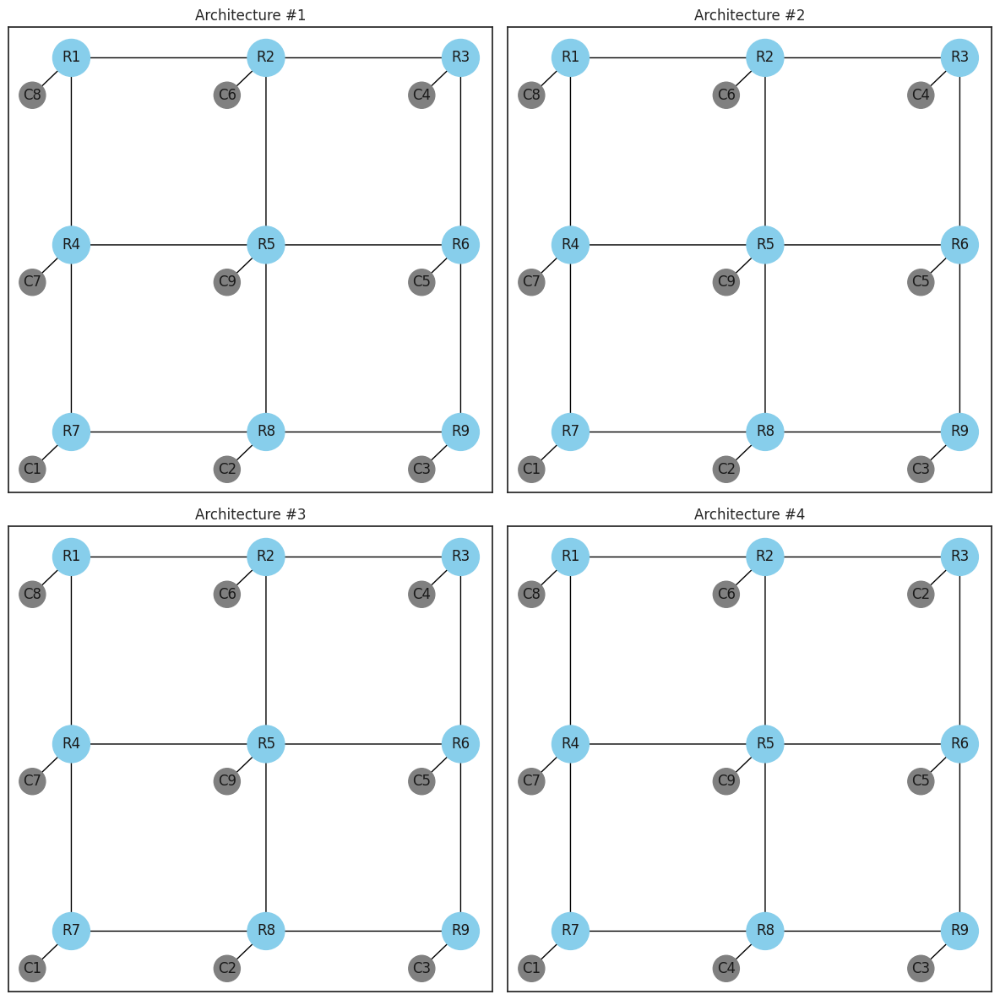

In [1519]:
population = []
population.append( architecture_mesh )
population_crossover = crossover_standard( architecture_mesh )
population.extend( population_crossover )

plot_population( population )

## Arquitectura Torus


Number of kid: 1
Selected Router: [1], Selected Core: [3]
Adjacent Routers to Router [1]: [0, 2, 4, 7]
Swap Router 1:[0], Swap Core 1: [4]
Cores with communication to [3] in Core Graph: [2, 4]
Cores [4, 4] to swap Routers [0, 0]

Number of kid: 2
Selected Router: [4], Selected Core: [2]
Adjacent Routers to Router [4]: [1, 3, 5, 7]
Swap Router 1:[1], Swap Core 1: [3]
Cores with communication to [2] in Core Graph: [0, 3]
Cores [3, 3] to swap Routers [1, 1]

Number of kid: 3
Selected Router: [0], Selected Core: [4]
Adjacent Routers to Router [0]: [1, 2, 3, 6]
Swap Router 1:[6], Swap Core 1: [8]
Cores with communication to [4] in Core Graph: [3, 8]
Cores [8, 3] to swap Routers [6, 1]


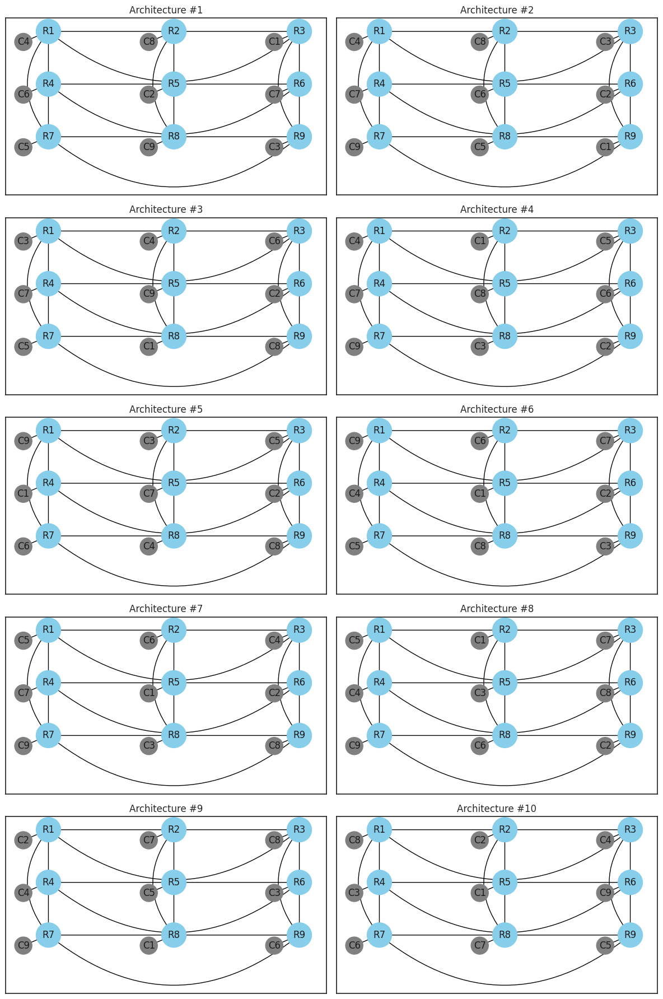

In [1520]:
population = []
population.append( architecture_torus )
population_crossover = crossover_standard( architecture_torus )
population.extend( population_crossover )

plot_population( population_torus )

## Arquitectura Ring


Number of kid: 1
Selected Router: [3], Selected Core: [6]
Adjacent Routers to Router [3]: [2, 4]
Swap Router 1:[4], Swap Core 1: [7]
Cores with communication to [6] in Core Graph: [5, 7]
Cores [7, 5] to swap Routers [4, 6]

Number of kid: 2
Selected Router: [2], Selected Core: [0]
Adjacent Routers to Router [2]: [1, 3]
Swap Router 1:[1], Swap Core 1: [2]
Cores with communication to [0] in Core Graph: [1, 2]
Cores [2, 1] to swap Routers [1, 7]

Number of kid: 3
Selected Router: [7], Selected Core: [2]
Adjacent Routers to Router [7]: [6, 8]
Swap Router 1:[8], Swap Core 1: [3]
Cores with communication to [2] in Core Graph: [0, 3]
Cores [3, 0] to swap Routers [8, 2]


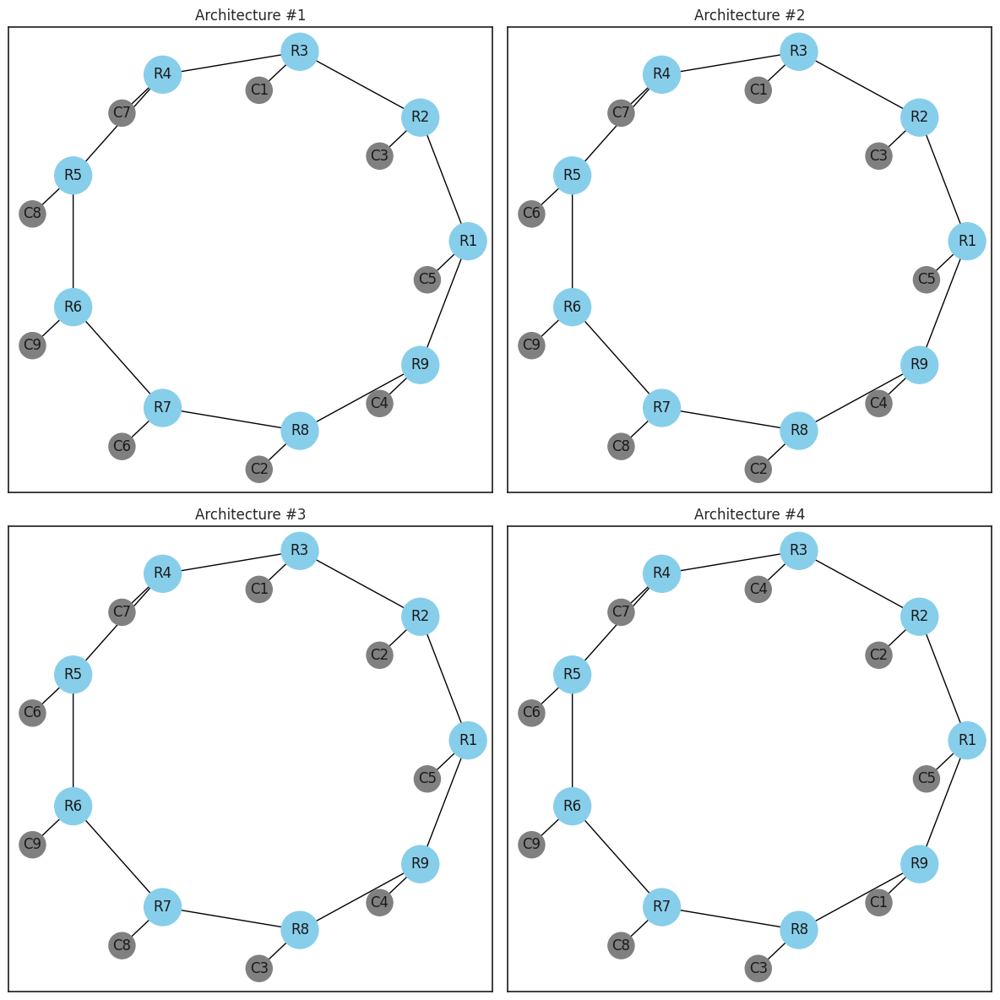

In [1521]:
population = []
population.append( architecture_ring )
population_crossover = crossover_standard( architecture_ring )
population.extend( population_crossover )

plot_population( population )

# Modelos

## Latencia

### Modelo


$$ D_{NoC} = \mu \cdot (t_{a} + t_{r}) + ( \mu + 1) \cdot t_{l} + \frac{N_{p}}{N_{C}} \cdot t_{l} $$

Donde:

 $ \mu = \frac{ \sum_{i=1}^{N} \sum_{j=1}^{N} \lambda_{ij} c_{ij} } { \sum_{i=1}^{N} \sum_{j=1}^{N} \lambda_{ij} } $

 $ t_{a} =  \left(\frac{21}{4} \cdot \log_{2} p + \frac{14}{12} + 9  \right) \cdot \tau$

 $t_{l(r)} = 0.377 \cdot r_{l(r)} + l^{2}_{l(r)} + 0.693 \cdot \left(R_{d0} \cdot C_{0} + R_{d0} \cdot c_{l(r)} \cdot l_{l(r)} + r_{l(r)} \cdot + r_{l(r)} \cdot C_{g0}  \right) $

 $ l_{r} = 2 \cdot \left( w_{r} + s_{r} \right) \cdot N_{C} \cdot p $

 $ R_{d0} = 0.98 \cdot \frac{V_{dd}}{I_{dn0}}$

### Tabla

In [1522]:
from tabulate import tabulate

data_table_parameters_technology = [
  ["Parameter"] + ["Value"],
  ["w_{w}"] + [500],
  ["w_{r}"] + [200],
  ["r_{l}"]  + [46],
  ["r_{r}"]  + [614],
  ["C_{g0}"] + [512],
  ["V_{dd}"] + [1.1],
  ["tau"]    + [17],
  ["s_{w}"]  + [250],
  ["s_{r}"]  + [200],
  ["c_{l}"]  + [332.6],
  ["c_{r}"]  + [157.6],
  ["C_{d0}"] + [487],
  ["I_{d0}"] + [11.15]
]

table_parameters_technology = tabulate( data_table_parameters_technology,  headers="firstrow", tablefmt="grid" )
print( table_parameters_technology )

+-------------+---------+
| Parameter   |   Value |
+=============+=========+
| w_{w}       |  500    |
+-------------+---------+
| w_{r}       |  200    |
+-------------+---------+
| r_{l}       |   46    |
+-------------+---------+
| r_{r}       |  614    |
+-------------+---------+
| C_{g0}      |  512    |
+-------------+---------+
| V_{dd}      |    1.1  |
+-------------+---------+
| tau         |   17    |
+-------------+---------+
| s_{w}       |  250    |
+-------------+---------+
| s_{r}       |  200    |
+-------------+---------+
| c_{l}       |  332.6  |
+-------------+---------+
| c_{r}       |  157.6  |
+-------------+---------+
| C_{d0}      |  487    |
+-------------+---------+
| I_{d0}      |   11.15 |
+-------------+---------+


### Arquitectura Custom

In [1523]:
architecture_custom.set_parameters_Noc_delay( data_table_parameters_technology )
print( architecture_custom.get_NoC_delay() )

266.08333333333337


### Arquitectura Mesh

In [1524]:
architecture_mesh.set_parameters_Noc_delay( data_table_parameters_technology )
print( architecture_mesh.get_NoC_delay() )

419.6901127803456


### Arquitectura Torus

In [1525]:
architecture_torus.set_parameters_Noc_delay( data_table_parameters_technology )
print( architecture_torus.get_NoC_delay() )

446.51612903225805


### Arquitectura Ring

In [1526]:
architecture_ring.set_parameters_Noc_delay( data_table_parameters_technology )
print( architecture_ring.get_NoC_delay() )

589.7983870967743


### Comparación Arquitectura

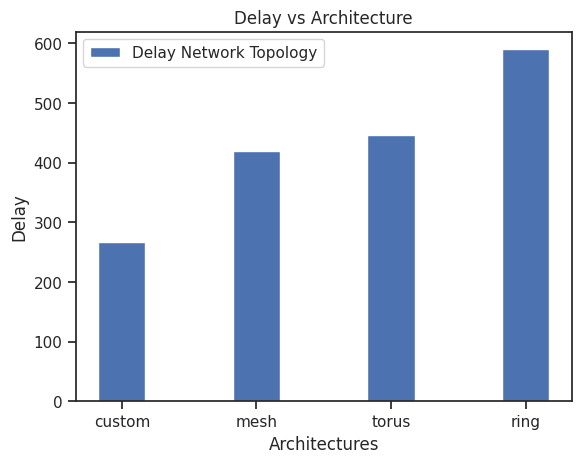

In [1527]:
population = []
population.append( architecture_custom )
population.append( architecture_mesh )
population.append( architecture_torus )
population.append( architecture_ring )

architectures = ['custom', 'mesh', 'torus', 'ring']

def plot_delay_graph( population ):
    import seaborn as sns
    sns.set()
    sns.set_style('ticks')

    delay_network_topology = []

    for architecture in population:
      delay_network_topology.append( architecture.metric_delay.total_delay )

    width = 0.35

    fig, ax = plt.subplots()
    ax.bar(np.arange(len(architectures)), delay_network_topology,     width, label='Delay Network Topology')

    ax.set_xlabel('Architectures')
    ax.set_ylabel('Delay')
    ax.set_title('Delay vs Architecture')
    ax.set_xticks(range(len(population)))
    ax.set_xticklabels(architectures)
    ax.legend()

    plt.show()

plot_delay_graph( population )

### Función Fitness

In [1528]:
def function_fitness_delay( architecture ):
  return architecture.get_NoC_delay()

## Area

### Modelo

$$A_{NoC}= A_{R} + A_{L}$$

Donde:

$A_{R}= \sum_{i=1}^{N_{R}} A_{R_{i} } $

$A_{L} = N_{L} \cdot \left(  N_{C} \cdot \left( w_{w} + s_{w} \right) + s_{w} \right) \cdot l_{l}$




---
$A_{R}$     : Routers Area the network.

$A_{R_{i}}$ : Area of Router $i$

$N_{R}$     : Number of routers in the network.

---


$A_{L}$ : Links area.

$N_{L}$ : Number of links within the network.

$N_{C}$ : Channel width.

$w_{w}$ : Wire width.

$s_{w}$ : Inter-wires spacing.

$l_{l}$ : Wire length for global interconnects.


### Tabla de Area

Consideraciones:


*   Cada puerto tiene un tamaño de buffer igual
*   Cada puerto consiste en dos canales para la recpeción y la transmisión de paquetes respectivamente.




\begin{array}{|c|c|c|c|c|}
\hline
  \\ \text{Area} & \text{2-port} & \text{3-port} & \text{4-port port} & \text{5-port}  \\
\hline
\mu m^2 & 50.200 & 66.800 & 83.400 &100.000 \\
\hline
\end{array}


Consideraciones:


*   Cada puerto tiene un tamaño de buffer igual
*   Cada puerto consiste en dos canales para la recpeción y la transmisión de paquetes respectivamente.




\begin{array}{|c|c|c|c|c|}
\hline
  \\ \text{Link Area} & \text{8-flit} & \text{16-flit} & \text{32-flit} & \text{64-flit}  \\
\hline
\mu m^2 & 0.064 & 0.128 & 0.256 &0.512 \\
\hline
\end{array}

In [1529]:
from tabulate import tabulate

data_table_area_routers = [
    ["Area", "2-port" , "3-port", "4-port", "5-port"],
    ["um2", 50.200 ,66.800, 83.400, 100.000]
]

data_table_area_links = [
    ["Area", "8-flit", "16-flit", "32-flit", "64-flit"],
    ["um2", 0.064, 0.128, 0.256, 0.512 ]
]

table_area_routers = tabulate( data_table_area_routers, headers="firstrow", tablefmt="grid")
table_area_links   = tabulate( data_table_area_links,   headers="firstrow", tablefmt='grid')

print( table_area_routers )
print( table_area_links )



+--------+----------+----------+----------+----------+
| Area   |   2-port |   3-port |   4-port |   5-port |
+========+==========+==========+==========+==========+
| um2    |     50.2 |     66.8 |     83.4 |      100 |
+--------+----------+----------+----------+----------+
+--------+----------+-----------+-----------+-----------+
| Area   |   8-flit |   16-flit |   32-flit |   64-flit |
+========+==========+===========+===========+===========+
| um2    |    0.064 |     0.128 |     0.256 |     0.512 |
+--------+----------+-----------+-----------+-----------+


### Arquitectura Custom

In [1530]:
architecture_custom.set_parameters_NoC_area( data_table_area_routers , data_table_area_links )
print( architecture_custom.get_NoC_area() )

619.632


### Arquitectura Mesh

In [1531]:
architecture_mesh.set_parameters_NoC_area( data_table_area_routers , data_table_area_links )
print( architecture_mesh.get_NoC_area() )

725.376


### Arquitectura Torus

In [1532]:
architecture_torus.set_parameters_NoC_area( data_table_area_routers , data_table_area_links )
print( architecture_torus.get_NoC_area() )

936.864


### Arquitectura Ring

In [1533]:
architecture_ring.set_parameters_NoC_area( data_table_area_routers , data_table_area_links )
print( architecture_ring.get_NoC_area() )

619.632


### Comparación Arquitecturas

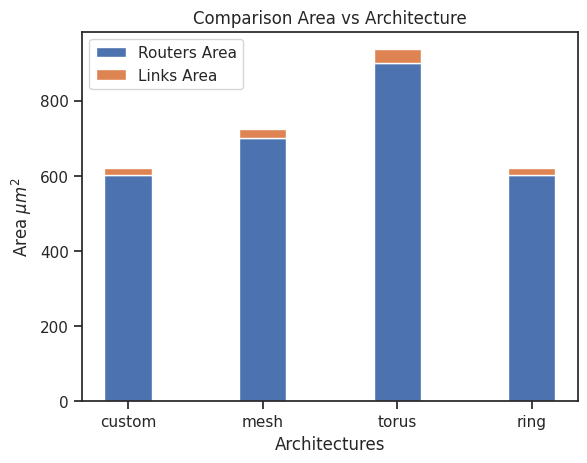

In [1534]:
population = []
population.append( architecture_custom )
population.append( architecture_mesh )
population.append( architecture_torus )
population.append( architecture_ring )

def plot_power_graph( population ):
    import seaborn as sns
    sns.set()
    sns.set_style('ticks')
    architectures = ['custom', 'mesh', 'torus', 'ring']
    routers_area = [architecture_custom.metric_area.area_all_routers, architecture_mesh.metric_area.area_all_routers,architecture_torus.metric_area.area_all_routers, architecture_ring.metric_area.area_all_routers]
    links_area   = [architecture_custom.metric_area.area_all_links, architecture_mesh.metric_area.area_all_links,architecture_torus.metric_area.area_all_links, architecture_ring.metric_area.area_all_links]

    width = 0.35  # Ancho de las barras

    fig, ax = plt.subplots()
    ax.bar(range(len(architectures)), routers_area, width, label='Routers Area')
    ax.bar(range(len(architectures)), links_area,   width, label='Links Area', bottom=routers_area)

    ax.set_xlabel('Architectures')
    ax.set_ylabel('Area $\mu m^{2}$')
    ax.set_title('Comparison Area vs Architecture')
    ax.set_xticks(range(len(architectures)))
    ax.set_xticklabels(architectures)
    ax.legend()

    plt.show()

plot_power_graph( population )


### Función Fitness

In [1535]:
def function_fitness_area( architecture ):
  return architecture.get_NoC_area()

## Potencia

### Modelo

$$P_{NoC} = P_{R} + P_{L}$$

Donde:

$P_{R} = \sum_{i=1}^{N} P_{R_{i}}$

$P_{L} = \sum_{i=1}^{N} \sum_{j=1}^{N} \lambda_{ij} \cdot P_{unit-link}$

---

Para:

$$P_{R} = \sum_{i=1}^{N} P_{R_{i}}$$

$P_{R_{i}} = P_{R_{i}Dynamic} + P_{R_{i} Leakage}$

$P_{R_{i}Dynamic} =\left( C_{DM} \cdot M_{i} + C_{D} \right) \cdot \alpha_{fi} $

$P_{R_{i}Leakage} = \left( C_{LM} \cdot M_{i} + C_{L}\right) \cdot \alpha_{fi}$

---

$N$ : Number of routers in the network.

$P_{R_{i}Dynamic}$ : Dynamic power of router $i$.

$P_{R_{i}Leakage}$ : Leakage power of router $i$.

$P_{R_{i}}$ : Power total of router $i$.

$M_{i}$ : Number of ports of router $i$.

$\alpha_{fi}$ : Flit injection rate for router $i$.

$C_{DM}$ : Dynamic port-dependent power constant.

$C_{D}$ : Dynamic port-independent power constant.

$C_{LM}$ : Leakage port-dependent power constant.

$C_{L}$ : Leakage port-independent constant.

---

Para:

$$P_{L} = \sum_{i=1}^{N} \sum_{j=1}^{N} \lambda_{ij} \cdot c_{ij} \cdot P_{unit-link}$$

$P_{unit-link} = P_{switching} + P_{short} + P_{Leakage}$

$P_{switching} = \frac{1}{2} N_{C} \cdot V_{dd}^{2} \cdot \left( C_{L} \cdot \alpha_{L} + C_{C} + \alpha_{C} \right) \cdot f$

$P_{short} = N_{C} \cdot \tau_{sc} \cdot \alpha_{L} \cdot V_{dd} \cdot I_{short} \cdot f$

$P_{Leakage} = N_{C} \cdot V_{dd} \cdot \left( I_{bias,wire} + I_{leak}\right)$


---

$N$ : Number of routers in the network.

$\lambda_{ij}$ : Traffic sent from core $v_{i}$ to core $v_{j}$ in MB/s.

$c_{ij}$ : Number of hops between from core $v_{i}$ to $v_{j}$

$P_{unit-link}$ : Power consumed in one unit link.

$P_{switching}$ : Link switching.

$P_{short}$ : Short circuit power.

$P_{Leakage}$ : Leakage power.

$N_{C}$ : Number of wires in a link (Channel width)

$V_{dd}$ : Supply voltage.

$C_{L}$ : Self capacitance of a wire.

$C_{C}$ : Coupling capacitance of a wire with neighboring wires.

$\alpha_{L}$ : Switching activity on a wire.

$\alpha_{C}$ : Switching activity from adjacent wire.

$f$ : Operating frecuency.

$\tau_{sc}$ : Short circuit period during which $I_{short}$ flows between source and ground.

$I_{bias,wire}$ : Current flowing from wire to its substrate.

$I_{leak}$ : Leakage current flowing from the source to ground regardless of the gate's state and switching activity.



### Tablas de Potencia


\begin{array}{|c|c|c|c|c|}
\hline
  \\ \text{Flit Injection rate (flit/cycle)} & \text{4 port} & \text{5 port} & \text{6 port} & \text{7 port} & \text{8 port} \\
\hline
1.000 & 64.104 & 96.885 & 136.044 & 137.379 & 234.287 \\
0.400 & 32.019 & 48.440 & 68.041 & 86.709 & 117.173 \\
0.200 & 12.793 & 19.380 & 27.229 & 34.706 & 46.901 \\
0.100 & 6.410 & 9.705 & 13.635 & 17.372 & 23.481 \\
0.050 & 3.211 & 4.862 & 6.832 & 8.705 & 11.762 \\
0.020 & 1.293 & 1.963 & 2.747 & 3.505 & 4.726 \\
0.002 & 0.135 & 0.203 & 0.285 & 0.380 & 0.487 \\
0.000 & 0.008 & 0.013 & 0.018 & 0.025 & 0.032 \\
\hline
\end{array}



In [1536]:
from tabulate import tabulate

data_table_power_routers = [
    [""]+["Router Power (mW)"]*7,
    ["Flit Injection rate\n(flit/cycle)","2-port" ,"3-port", "4-port", "5-port","6-port", "7-port", "8-port"],
    [1.000, 63.625, 64.083, 64.104, 96.885, 136.044, 173.583, 234.287],
    [0.400,  0.000,  0.000, 32.019, 48.440,  68.041,  86.709, 117.173],
    [0.200,  0.000,  0.000, 12.793, 19.380,  27.229,  34.706,  46.901],
    [0.100,  0.000,  0.000,  6.410,  9.705,  13.635,  17.372,  23.481],
    [0.050,  0.000,  0.000,  3.211,  4.862,  6.832,    8.705,  11.762],
    [0.020,  0.000,  0.000,  1.293,  1.963,  2.747,    3.505,   4.726],
    [0.002,  0.000,  0.000,  0.135,  0.203,  0.285,    0.380,   0.487],
    [0.000,  0.000,  0.000,  0.008,  0.013,  0.018,    0.025,   0.032]
]

table = tabulate(data_table_power_routers, headers= "firstrow", tablefmt="grid")

print( table )

data_table_power_links = data_table_power_routers



+---------------------+---------------------+---------------------+---------------------+---------------------+---------------------+---------------------+---------------------+
|                     | Router Power (mW)   | Router Power (mW)   | Router Power (mW)   | Router Power (mW)   | Router Power (mW)   | Router Power (mW)   | Router Power (mW)   |
+=====================+=====================+=====================+=====================+=====================+=====================+=====================+=====================+
| Flit Injection rate | 2-port              | 3-port              | 4-port              | 5-port              | 6-port              | 7-port              | 8-port              |
| (flit/cycle)        |                     |                     |                     |                     |                     |                     |                     |
+---------------------+---------------------+---------------------+---------------------+---------------------

### Arquitectura Custom

In [1537]:
architecture_custom.set_parameters_NoC_power( data_table_power_routers )
print( architecture_custom.get_NoC_power() )

675.5100000000001


### Arquitectura Mesh

In [1538]:
architecture_mesh.set_parameters_NoC_power( data_table_power_routers )
print( architecture_mesh.get_NoC_power() )

747.2330000000001


### Arquitectura Torus

In [1539]:
architecture_torus.set_parameters_NoC_power( data_table_power_routers )
print( architecture_torus.get_NoC_power() )

996.7650000000001


### Arquitectura Ring

In [1540]:
architecture_ring.set_parameters_NoC_power( data_table_power_routers )
print( architecture_ring.get_NoC_power() )

797.547


### Comparación Arquitecturas

[576.3100000000001, 609.633, 871.965, 576.747]


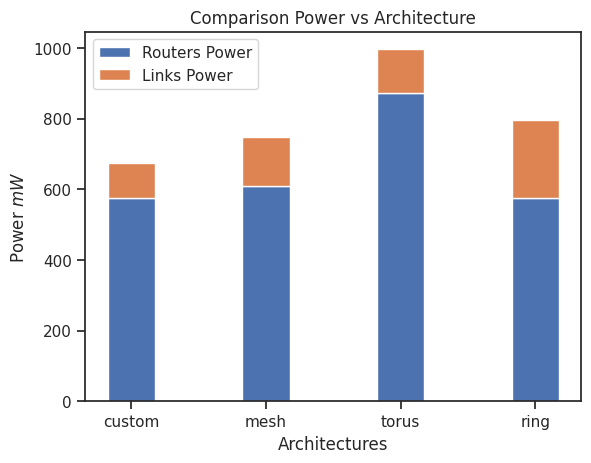

In [1541]:
population = []
population.append( architecture_custom )
population.append( architecture_mesh )
population.append( architecture_torus )
population.append( architecture_ring )

def plot_power_graph( population ):
    import seaborn as sns
    sns.set()
    sns.set_style('ticks')
    architectures = ['custom', 'mesh', 'torus', 'ring']
    routers_power = [architecture_custom.metric_power.power_all_routers, architecture_mesh.metric_power.power_all_routers,architecture_torus.metric_power.power_all_routers, architecture_ring.metric_power.power_all_routers]
    links_power   = [architecture_custom.metric_power.power_all_links, architecture_mesh.metric_power.power_all_links, architecture_torus.metric_power.power_all_links, architecture_ring.metric_power.power_all_links]

    print( routers_power )
    width = 0.35  # Ancho de las barras

    fig, ax = plt.subplots()
    ax.bar(range(len(architectures)), routers_power, width, label='Routers Power' )
    ax.bar(range(len(architectures)), links_power,   width, label='Links Power',  bottom=routers_power )

    ax.set_xlabel('Architectures')
    ax.set_ylabel('Power $mW$')
    ax.set_title('Comparison Power vs Architecture')
    ax.set_xticks(range(len(architectures)))
    ax.set_xticklabels(architectures)
    ax.legend()

    plt.show()

plot_power_graph( population )

### Función Fitness

In [1542]:
def function_fitness_power( architecture ):
  return architecture.get_NoC_power()

## Confiabilidad

### Modelo

$$ R_{NoC} = \prod_{i=1}^{N} \prod_{j=1}^{N} \rho_{ij}^{c_{ij}}  $$

$\rho_{ij} = \left( 1 - \frac{1}{\sqrt{2 \pi}} \int_{\frac{V_{sw}}{2 \sigma}}^{\infty} e^{-\frac{\mu^{2}}{2}} d\mu \right)^{\lambda_{ij}}$

---

$N$ : Number of cores within the application.

$\rho_{ij}$ : Probability of transmiting $\lambda_{ij}$ packets successfully over link $l_{ij}$ in the presence of noise.

$c_{ij}$ : Number of links a packet goes through during its transition form source core $c_{i}$ to destination core $c_{j}$.

$V_{sw}$ : Voltage swing.

$\sigma$ : Noise standard deviation.

$\frac{1}{\sqrt{2\pi}} \int_{\frac{V_{sw}}{2 \sigma}}^{\infty} e^{-\frac{\mu^{2}}{2}} d\mu $


\begin{align*}
\frac{1}{\sqrt{2\pi}} \int_{\frac{V_{sw}}{2 \sigma}}^{\infty} e^{-\frac{\mu^{2}}{2}} d\mu &= \frac{1}{\sqrt{2\pi}} \left[ -e^{-\frac{\mu^{2}}{2}} \right]{\frac{V{sw}}{2 \sigma}}^{\infty} \
&= \frac{1}{\sqrt{2\pi}} \left( -e^{-\frac{(0.4)^{2}}{2(0.08)^{2}}} + e^{0} \right) \
&= \frac{1}{\sqrt{2\pi}} \left( -e^{-0.01} + 1 \right) \
&\approx 0.675
\end{align*}

### Minimum Edge Cut-Set

$$ P_{failure} = \left( \frac{m}{s}\right) P_{e}^{s} \cdot \left( 1-P_{e}\right)^{m-s}$$

$$ \prod_{i=1}^{N} \prod_{j=1}^{N} \sum_{i=1}^{N} \sum_{j=1}^{N}$$

### Tabla

In [1543]:
data_table_reliability =[
    [""] + ["Probabilidad"]*3,
    ["V_swing / var"]  + [0.07, 0.08, 0.09],
    [0.3] + [0.0 , 0.0, 0.0],
    [0.4] + [0.0 , 0.9922, 0.0],
    [0.5] + [0.0 , 0.0, 0.0]
]


table = tabulate(data_table_reliability, headers= "firstrow", tablefmt="grid")
print( table )

+---------------+----------------+----------------+----------------+
|               |   Probabilidad |   Probabilidad |   Probabilidad |
+===============+================+================+================+
| V_swing / var |           0.07 |         0.08   |           0.09 |
+---------------+----------------+----------------+----------------+
| 0.3           |           0    |         0      |           0    |
+---------------+----------------+----------------+----------------+
| 0.4           |           0    |         0.9922 |           0    |
+---------------+----------------+----------------+----------------+
| 0.5           |           0    |         0      |           0    |
+---------------+----------------+----------------+----------------+


In [1544]:
architecture_custom.set_parameters_NoC_reliability( data_table_reliability )
print( architecture_custom.get_NoC_reliability()  )

1.7900198092726757e-07


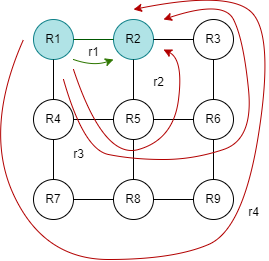

$\lambda_{12}$

$P_{ij}$

$C_{ij}^{r}$ :

$R_{12}$ : Reliability


$r_{1}: 1 $ salto

$r_{2}: 2 $ saltos

$r_{3}: 3 $ saltos

$r_{4}: 4 $ saltos


$r_{1-reliability} = P_{12}^{1}$

$r_{2-reliability} = P_{12}^{2}$

$r_{3-reliability} = P_{12}^{3}$

$r_{4-reliability} = P_{12}^{4}$

$R_{12} = \sum_{r=1}^{4} P_{12}^{C_{12}^{r}}$

$R_{ij} = \sum_{r=1}^{r_{n}} P_{ij}^{C_{ij}^{r}}$

---

$R_{j} = \prod_{j=1}^{N} \sum_{r=1}^{r_{n}} P_{ij}^{C_{ij}^{r}} $

---

$R = \prod_{i=1}^{N} \prod_{j=1}^{N} \sum_{r=1}^{r_{n}} P_{ij}^{C_{ij}^{r}} $

---

$R = \prod_{i=1}^{N} \prod_{j=1}^{N} P_{ij}^{C_{ij}^{mean}}$












### Arquitectura Custom

In [1545]:
architecture_custom.set_parameters_NoC_reliability( data_table_reliability )
print( architecture_custom.get_NoC_reliability()  )

1.7900198092726757e-07


### Arquitectura Mesh

In [1546]:
architecture_mesh.set_parameters_NoC_reliability( data_table_reliability )
print( architecture_mesh.get_NoC_reliability()  )

4.375834326996632e-10


### Arquitectura Torus

In [1547]:
architecture_torus.set_parameters_NoC_reliability( data_table_reliability )
print( architecture_torus.get_NoC_reliability()  )

3.2483278798551104e-09


### Arquitectura Ring

In [1548]:
architecture_ring.set_parameters_NoC_reliability( data_table_reliability )
print( architecture_ring.get_NoC_reliability() )

9.597706034999631e-16


### Comparación Arquitecturas

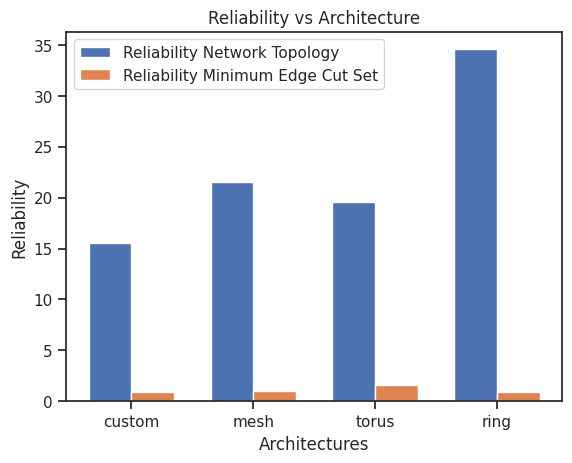

In [1549]:
population = []
population.append( architecture_custom )
population.append( architecture_mesh )
population.append( architecture_torus )
population.append( architecture_ring )

architectures = ['custom', 'mesh', 'torus', 'ring']


def plot_reliability_graph( population ):
    import seaborn as sns
    sns.set()
    sns.set_style('ticks')

    reliability_network_topology = []
    reliability_minimum_edge_cut_set = []

    for architecture in population:
      reliability_network_topology.append( np.abs( np.log( architecture.metric_reliability.reliability_all_routers/(1-architecture.metric_reliability.reliability_all_routers)  ) ) )
      reliability_minimum_edge_cut_set.append( np.log( (1-architecture.metric_reliability.probability_system_fail)/architecture.metric_reliability.probability_system_fail )  )

    width = 0.35  # Ancho de las barras
    offset = width / 2  # Espacio entre las barras

    fig, ax = plt.subplots()
    ax.bar(np.arange(len(architectures)) - offset, reliability_network_topology,     width, label='Reliability Network Topology')
    ax.bar(np.arange(len(architectures)) + offset, reliability_minimum_edge_cut_set, width, label='Reliability Minimum Edge Cut Set')

    ax.set_xlabel('Architectures')
    ax.set_ylabel('Reliability')
    ax.set_title('Reliability vs Architecture')
    ax.set_xticks(range(len(population)))
    ax.set_xticklabels(architectures)
    ax.legend()

    plt.show()

plot_reliability_graph( population )

### Función

In [1550]:
def function_fitness_reliability( architecture ):
  return architecture.get_NoC_reliability()

# Calculo Fitness

In [1551]:
def calculate_fitness( population, *metrics ):

  fitness = []

  for individual in population:

    fitness_value = 1.0

    if not metrics or 'delay' in metrics:
      fitness_value *= function_fitness_delay(individual)
    if not metrics or 'area' in metrics:
      fitness_value *= function_fitness_area(individual)
    if not metrics or 'power' in metrics:
      fitness_value *= function_fitness_power(individual)
    if not metrics or 'reliability' in metrics:
      fitness_value /= function_fitness_reliability(individual)

    fitness.append(fitness_value)

  return fitness

In [1552]:
def set_parameters_architectures_population( population ):

  for architecture in population:
    architecture.set_parameters_NoC_area( data_table_area_routers, data_table_area_links )
    architecture.set_parameters_Noc_delay( data_table_parameters_technology  )
    architecture.set_parameters_NoC_power( data_table_power_routers )
    architecture.set_parameters_NoC_reliability( data_table_reliability )

In [1553]:
def calculate_full_fitness( population ):

  for individual in population:
    individual.fitness_delay       = function_fitness_delay( individual )
    individual.fitness_area        = function_fitness_area( individual )
    individual.fitness_power       = function_fitness_power( individual )
    individual.fitness_reliability = function_fitness_reliability( individual )

## Mono-Objetivo

### Graficar

In [1554]:
def bar_graph( population, population_fitness, metric):
  architectures = range(1, len(population)+1)
  fitness       =  population_fitness
  mean_fitness  = np.mean(fitness)  # Calcular la media de fitness_delay

  fig, ax = plt.subplots()
  ax.bar( architectures, fitness )

# Establecer los valores del eje x manualmente
  x_ticks = range(1, len(population) + 1)
  ax.set_xticks(x_ticks)
  ax.axhline(mean_fitness, color='red', linestyle='--', label='Mean')  # Agregar la línea de la media

  labels = ax.get_xticklabels()

  plt.xlabel( f'Architecture Custom' )
  plt.ylabel( 'Fitness Delay' )
  plt.title( 'Function Fitness Delay vs Architecture Custom' )
  plt.show()

### Latencia

$$ f = D_{NoC}$$

#### Arquitectura Custom

##### Población

[266.08333333333337, 266.08333333333337, 266.08333333333337, 266.08333333333337, 266.08333333333337, 266.08333333333337, 266.08333333333337, 266.08333333333337, 266.08333333333337, 266.08333333333337]


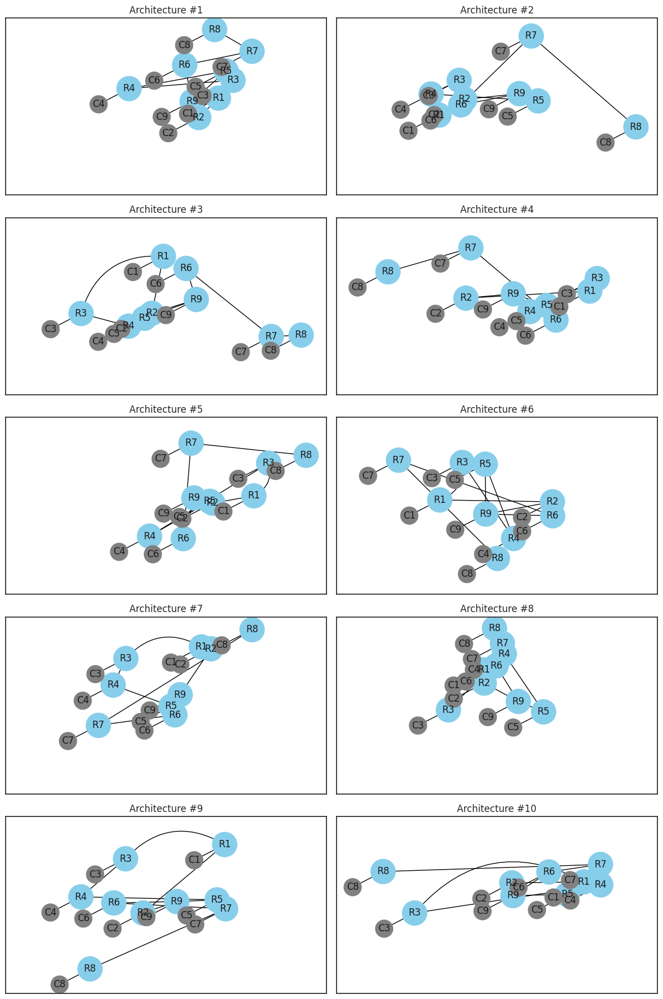

In [1555]:
set_parameters_architectures_population( population_custom )
population_custom_fitness_delay = calculate_fitness( population_custom, 'delay' )
print( population_custom_fitness_delay )
plot_population( population_custom )

##### Comparación de la población

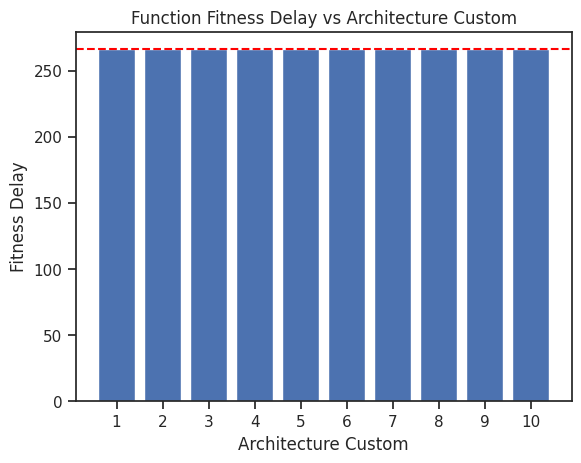

In [1556]:
bar_graph( population_custom, population_custom_fitness_delay , 'delay' )

#### Arquitectura Mesh

##### Población

[429.4038363333769, 643.1057545000654, 584.8234131818776, 643.1057545000654, 662.5332016061279, 439.11755988640823, 749.9567135834096, 594.5371367349089, 672.2469251591593, 740.2429900303783]


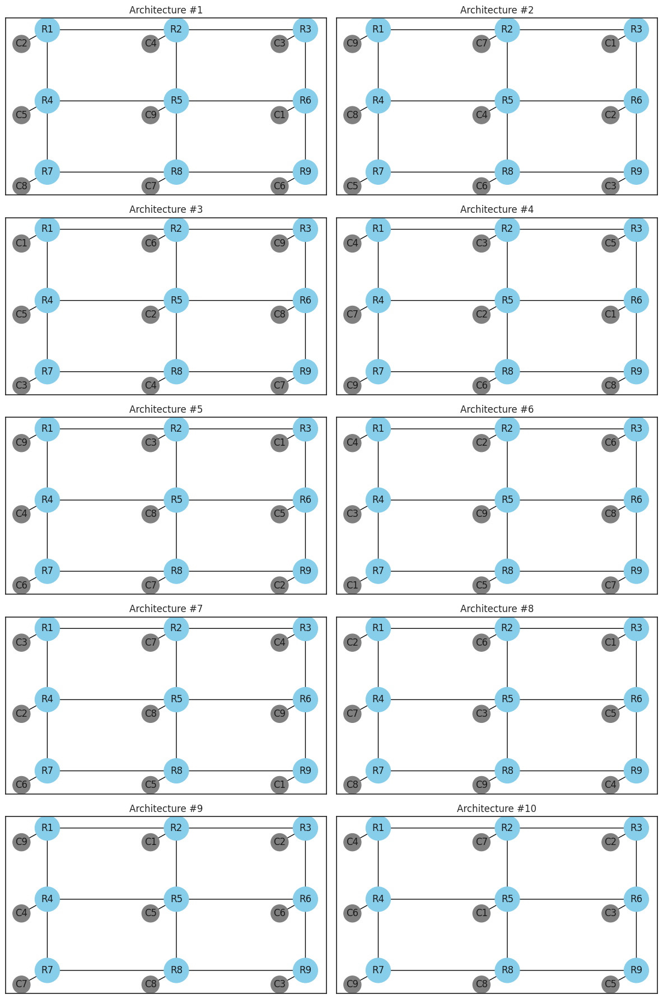

In [1557]:
set_parameters_architectures_population( population_mesh )
population_mesh_fitness_delay = calculate_fitness( population_mesh, 'delay' )
print( population_mesh_fitness_delay )
plot_population( population_mesh )

##### Comparación de la población

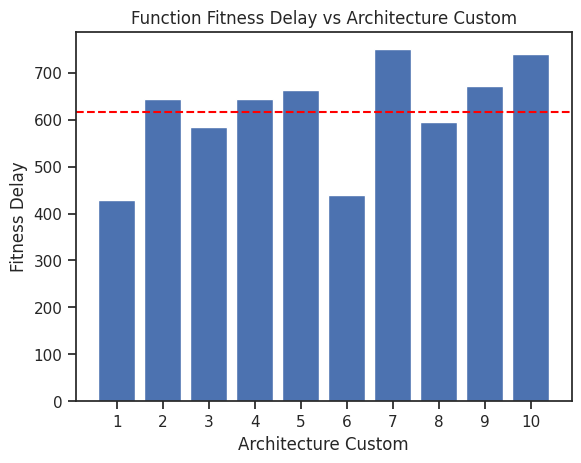

In [1558]:
bar_graph( population_mesh, population_mesh_fitness_delay , 'delay' )

#### Arquitectura Torus

[492.10752688172033, 480.7096774193548, 594.6881720430106, 537.6989247311827, 526.3010752688172, 537.6989247311826, 537.6989247311827, 400.92473118279565, 514.9032258064516, 514.9032258064516]


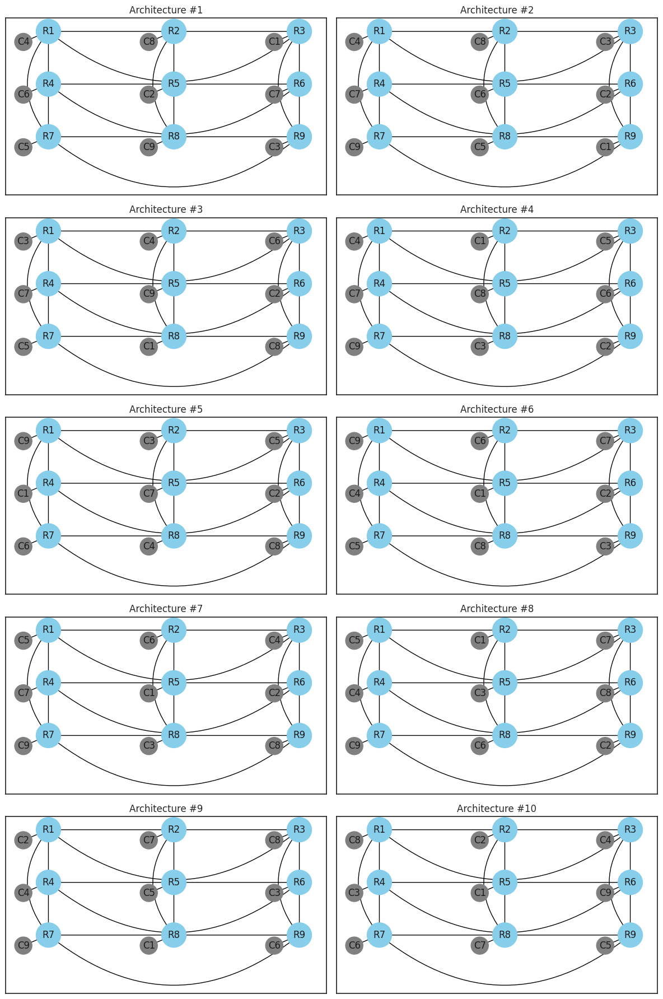

In [1559]:
set_parameters_architectures_population( population_torus )
population_torus_fitness_delay = calculate_fitness( population_torus, 'delay' )
print( population_torus_fitness_delay )
plot_population( population_torus )

###### Comparación de la población

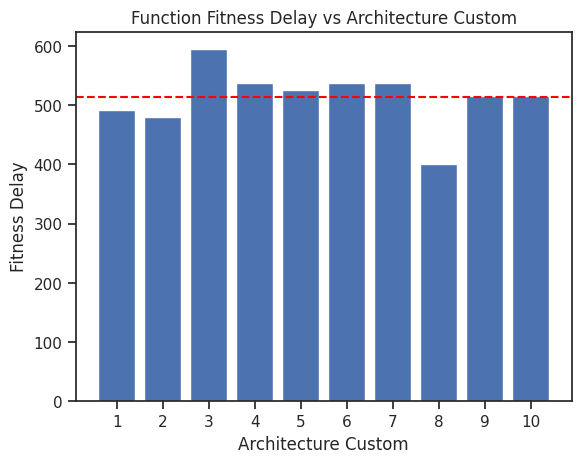

In [1560]:
bar_graph( population_torus, population_torus_fitness_delay , 'delay' )

#### Arquitectura Ring

[504.61021505376345, 530.1666666666667, 692.0241935483872, 649.4301075268819, 649.4301075268819, 717.5806451612904, 785.731182795699, 657.948924731183, 615.3548387096774, 589.7983870967743]


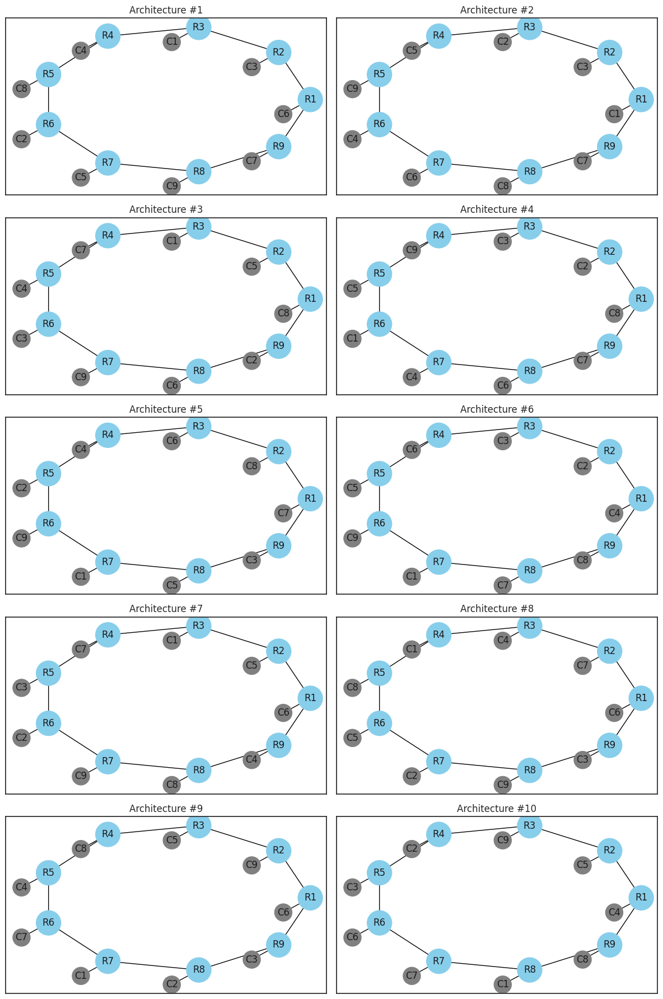

In [1561]:
set_parameters_architectures_population( population_ring )
population_ring_fitness_delay = calculate_fitness( population_ring, 'delay' )
print( population_ring_fitness_delay )
plot_population( population_ring )

###### Comparación de la población

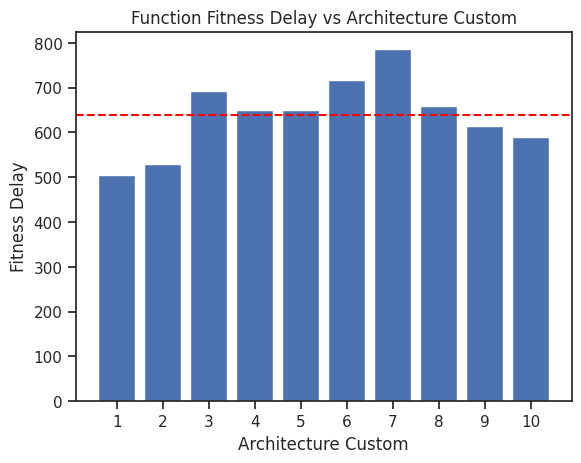

In [1562]:
bar_graph( population_ring, population_ring_fitness_delay , 'delay' )

#### Comparación Arquitecturas

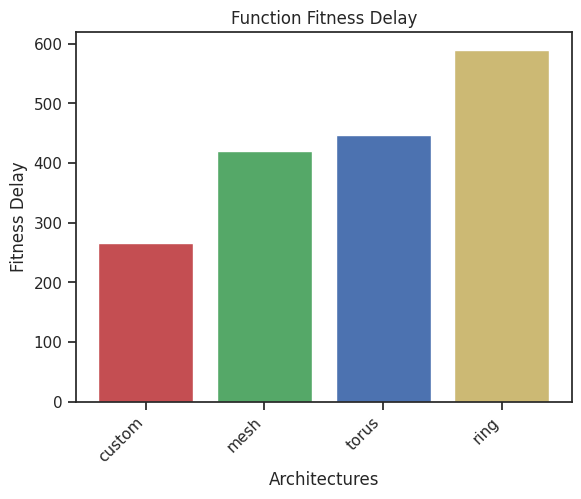

In [1563]:
def bar_graph_architectures( architectures ):
  import seaborn as sns
  sns.set()
  sns.set_style('ticks')

  delay_network_topology = [architecture.metric_delay.total_delay for architecture in architectures]
  type_network_topology = [architecture.topology_type for architecture in architectures]

  fig, ax = plt.subplots()
  ax.bar( type_network_topology, delay_network_topology, color = ['r','g','b','y','m','c','k'] )
  labels = ax.get_xticklabels()
  plt.setp(labels, rotation = 45, horizontalalignment = 'right')

  plt.xlabel( 'Architectures' )
  plt.ylabel( 'Fitness Delay' )
  plt.title( 'Function Fitness Delay' )

  plt.show()

architectures = []
architectures.append( architecture_custom )
architectures.append( architecture_mesh )
architectures.append( architecture_torus )
architectures.append( architecture_ring )

bar_graph_architectures( architectures )

### Area

#### Arquitectura Custom

###### Población

[619.632, 619.632, 619.632, 619.632, 619.632, 619.632, 619.632, 619.632, 619.632, 619.632]


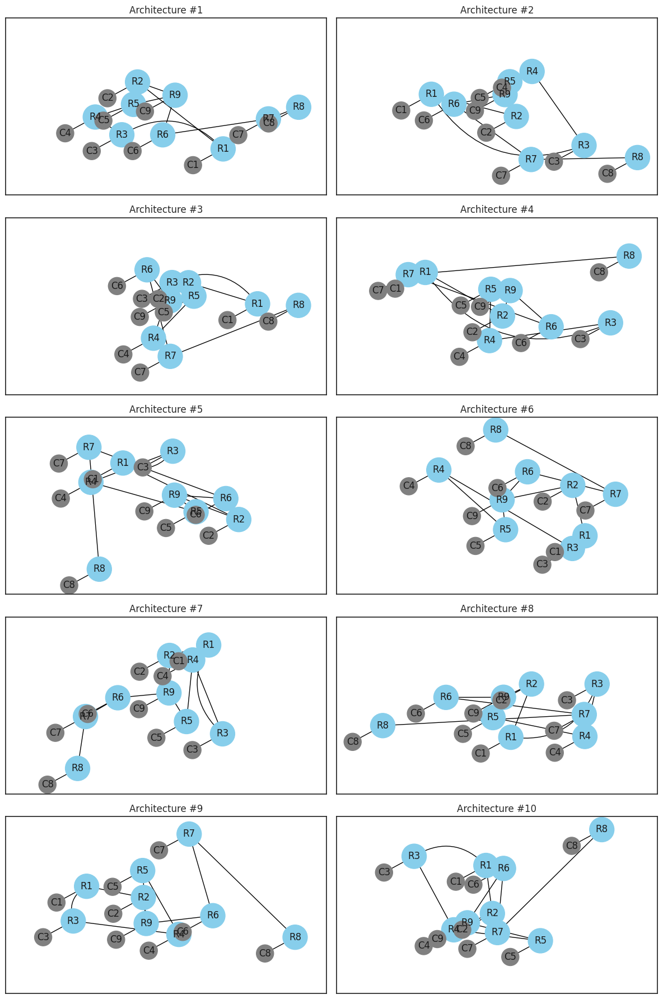

In [1564]:
population_custom_fitness_area = calculate_fitness( population_custom, 'area' )
print( population_custom_fitness_area )
plot_population( population_custom )

###### Comparación de la población

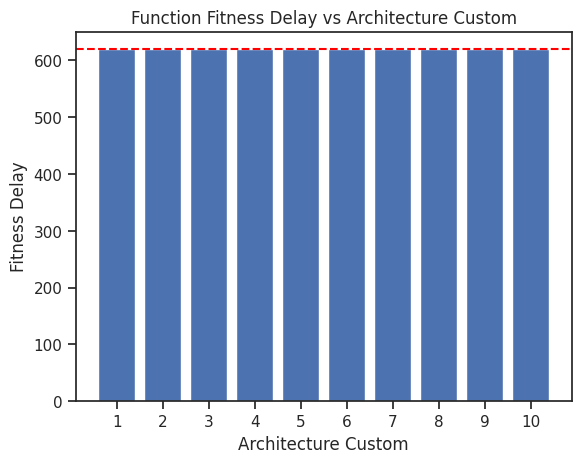

In [1565]:
bar_graph( population_custom, population_custom_fitness_area , 'area' )

#### Arquitectura Mesh

##### Población

[725.376, 725.376, 725.376, 725.376, 725.376, 725.376, 725.376, 725.376, 725.376, 725.376]


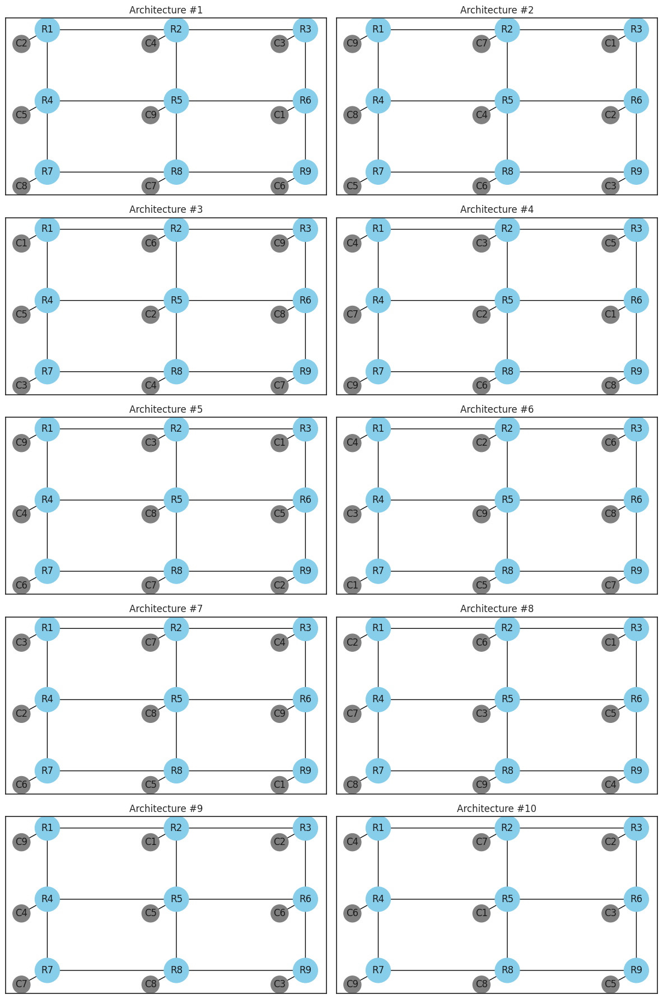

In [1566]:
population_mesh_fitness_area = calculate_fitness( population_mesh, 'area' )
print( population_mesh_fitness_area )
plot_population( population_mesh )

##### Comparación de la población

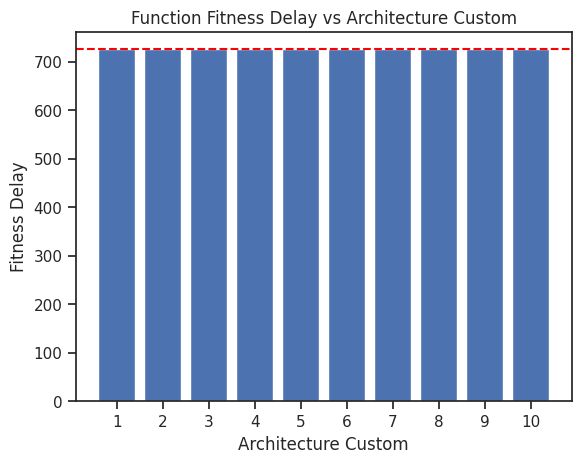

In [1567]:
bar_graph( population_mesh, population_mesh_fitness_area , 'area' )

#### Arquitectura Torus

##### Población

[936.864, 936.864, 936.864, 936.864, 936.864, 936.864, 936.864, 936.864, 936.864, 936.864]


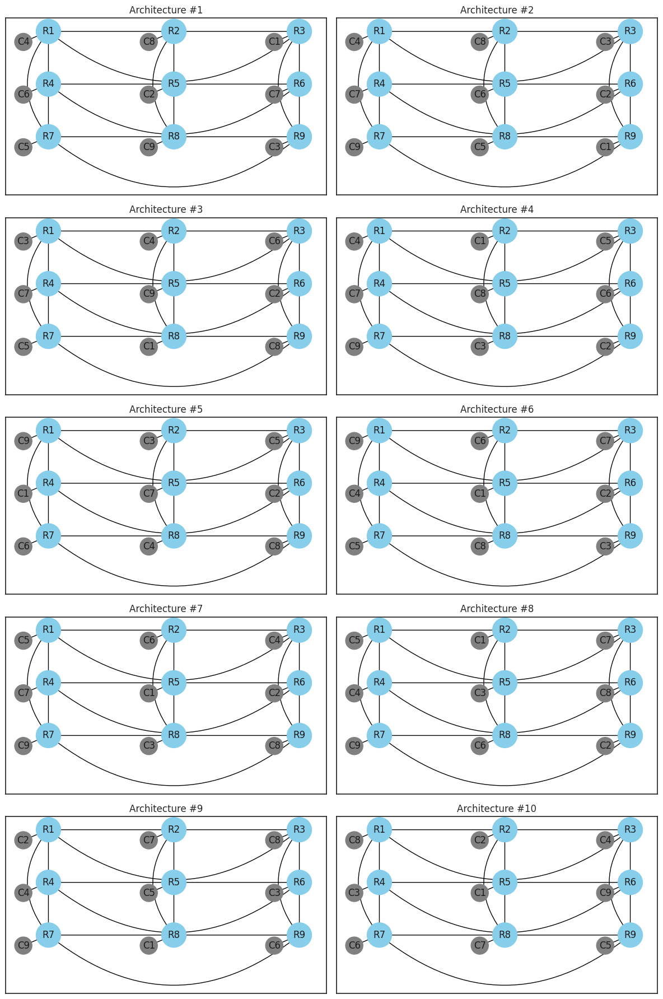

In [1568]:
population_torus_fitness_area = calculate_fitness( population_torus, 'area' )
print( population_torus_fitness_area )
plot_population( population_torus )

##### Comparación de la población

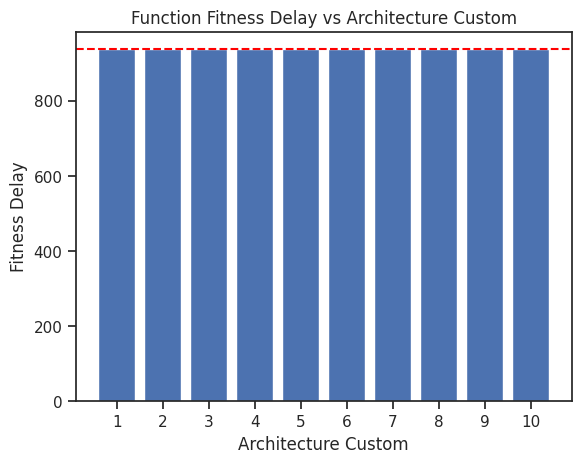

In [1569]:
bar_graph( population_torus, population_torus_fitness_area , 'area' )

#### Arquitectura Ring

###### Población

[619.632, 619.632, 619.632, 619.632, 619.632, 619.632, 619.632, 619.632, 619.632, 619.632]


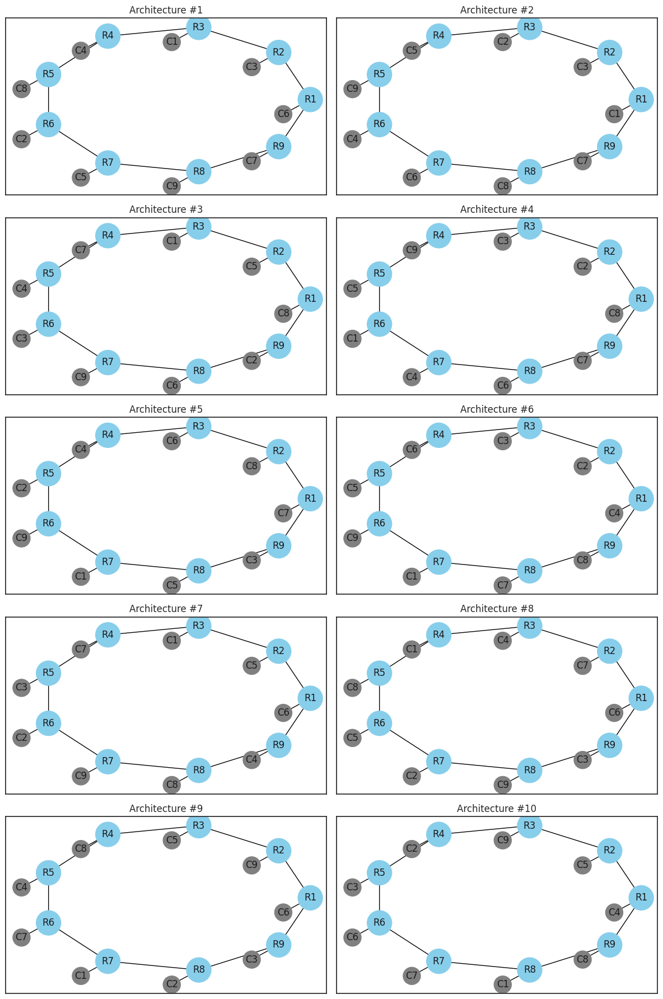

In [1570]:
population_ring_fitness_area = calculate_fitness( population_ring, 'area' )
print( population_ring_fitness_area )
plot_population( population_ring )

###### Comparación de la población

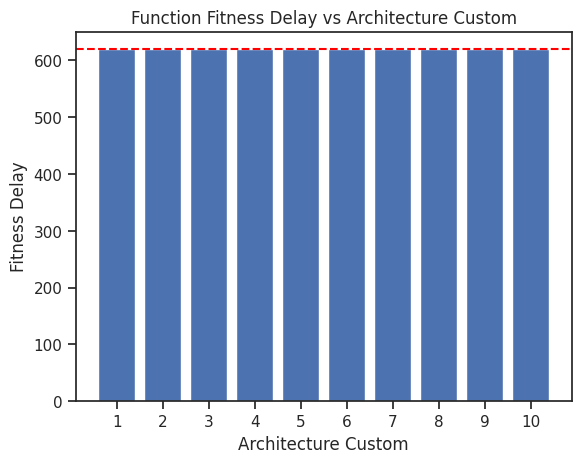

In [1571]:
bar_graph( population_ring, population_ring_fitness_area , 'area' )

#### Comparación Arquitecturas

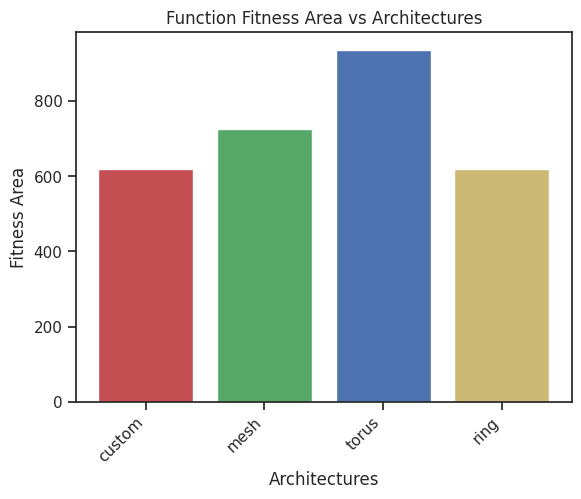

In [1572]:
def bar_graph_architectures( architectures ):
  import seaborn as sns
  sns.set()
  sns.set_style('ticks')

  area_network_topology =  [architecture.metric_area.area_total for architecture in architectures]
  type_network_topology  = [architecture.topology_type for architecture in architectures]

  fig, ax = plt.subplots()
  ax.bar( type_network_topology, area_network_topology, color = ['r','g','b','y','m','c','k'] )
  labels = ax.get_xticklabels()
  plt.setp(labels, rotation = 45, horizontalalignment = 'right')

  plt.xlabel( 'Architectures' )
  plt.ylabel( 'Fitness Area' )
  plt.title( 'Function Fitness Area vs Architectures' )

  plt.show()

architectures = []
architectures.append( architecture_custom )
architectures.append( architecture_mesh )
architectures.append( architecture_torus )
architectures.append( architecture_ring )

bar_graph_architectures( architectures )

### Consumo

#### Arquitectura Custom

#### Arquitectura Mesh

#### Arquitectura Torus

#### Arquitectura Ring

##### Población

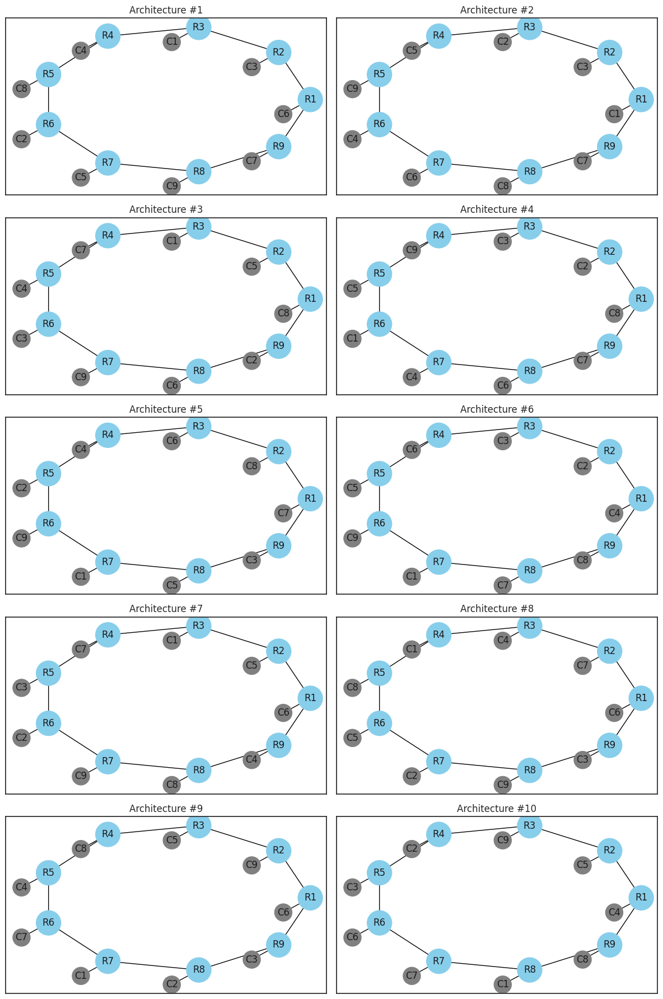

In [1573]:
population_ring_fitness_power = calculate_fitness( population_ring, 'power' )
plot_population( population_ring )

##### Comparación de la población

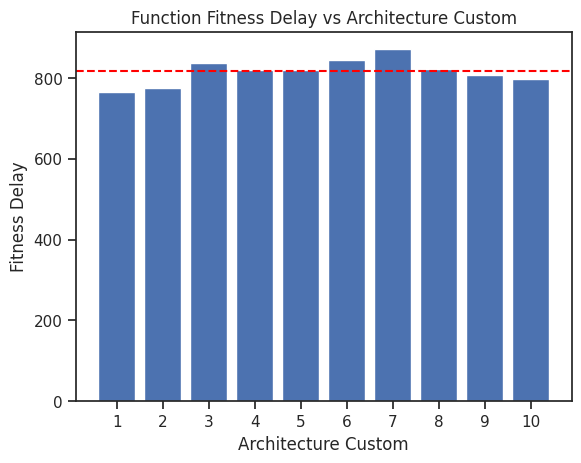

In [1574]:
bar_graph( population_ring, population_ring_fitness_power , 'power' )

#### Comparación Arquitecturas

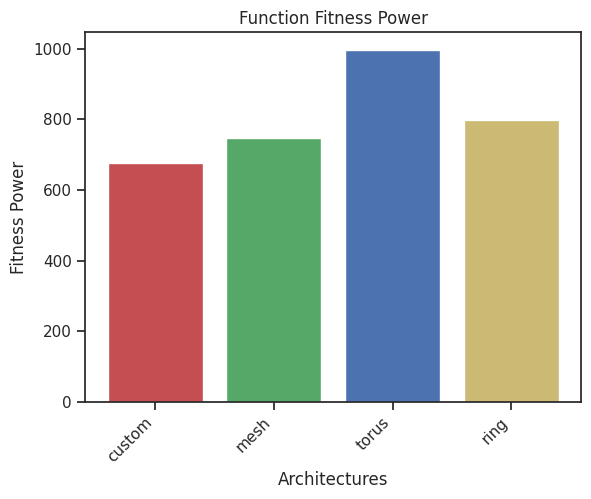

In [1575]:
def bar_graph_architectures( architectures ):
  import seaborn as sns
  sns.set()
  sns.set_style('ticks')

  power_network_topology = [architecture.metric_power.power_total for architecture in architectures]
  type_network_topology  = [architecture.topology_type for architecture in architectures]

  fig, ax = plt.subplots()
  ax.bar( type_network_topology, power_network_topology, color = ['r','g','b','y','m','c','k'] )
  labels = ax.get_xticklabels()
  plt.setp(labels, rotation = 45, horizontalalignment = 'right')

  plt.xlabel( 'Architectures' )
  plt.ylabel( 'Fitness Power' )
  plt.title( 'Function Fitness Power' )

  plt.show()

architectures = []
architectures.append( architecture_custom )
architectures.append( architecture_mesh )
architectures.append( architecture_torus )
architectures.append( architecture_ring )

bar_graph_architectures( architectures )

### Confiabilidad

#### Arquitectura Custom

#### Arquitectura Mesh

#### Arquitectura Torus

#### Arquitectura Ring

##### Población

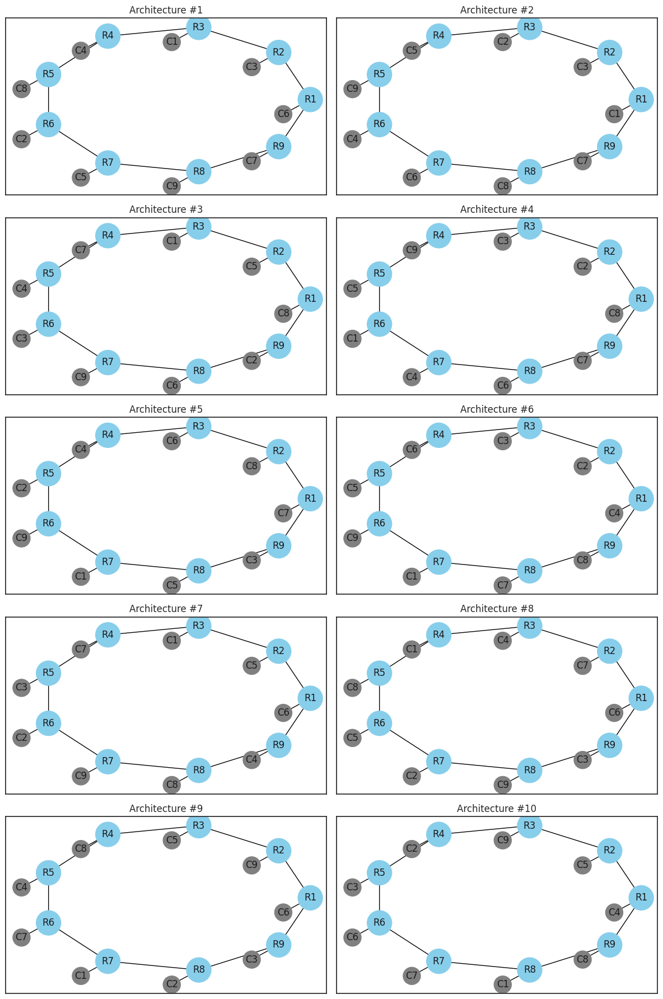

In [1576]:
population_ring_fitness_reliability = calculate_fitness( population_ring, 'reliability' )
plot_population( population_ring )

##### Comparación de la población

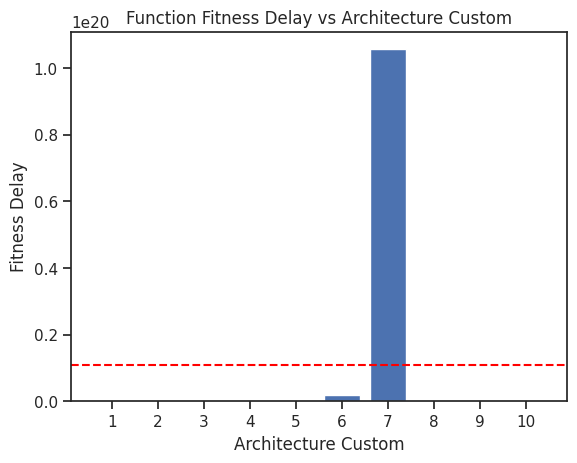

In [1577]:
bar_graph( population_ring, population_ring_fitness_reliability, 'reliability'  )

#### Comparación de aquitecturas

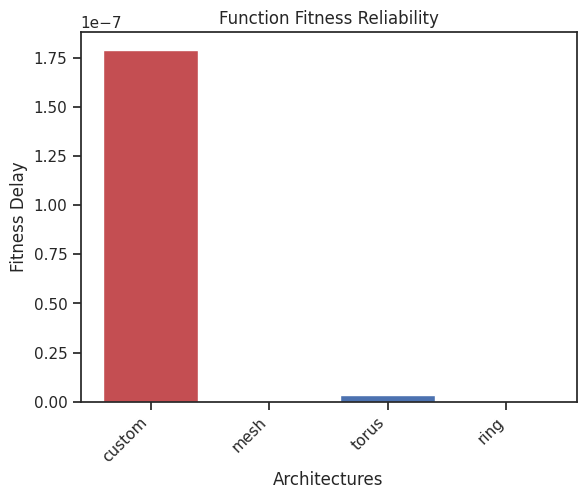

In [1578]:
def bar_graph_architectures( architectures ):
  import seaborn as sns
  sns.set()
  sns.set_style('ticks')

  delay_network_topology = [architecture.metric_reliability.reliability_NoC for architecture in architectures]
  type_network_topology = [architecture.topology_type for architecture in architectures]

  fig, ax = plt.subplots()
  ax.bar( type_network_topology, delay_network_topology, color = ['r','g','b','y','m','c','k'] )
  labels = ax.get_xticklabels()
  plt.setp(labels, rotation = 45, horizontalalignment = 'right')

  plt.xlabel( 'Architectures' )
  plt.ylabel( 'Fitness Delay' )
  plt.title( 'Function Fitness Reliability' )

  plt.show()

architectures = []
architectures.append( architecture_custom )
architectures.append( architecture_mesh )
architectures.append( architecture_torus )
architectures.append( architecture_ring )

bar_graph_architectures( architectures )

### Resultados

## Multi-Objetivo

### Latencia/Area

#### Architecture Custom

[164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002]


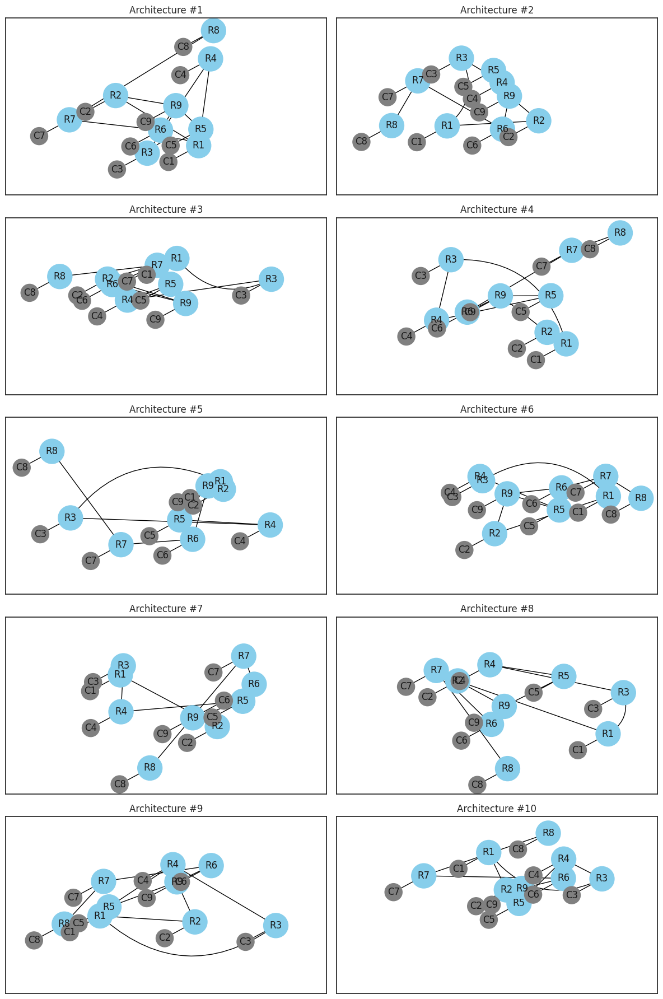

In [1579]:
population_custom_fitness = calculate_fitness( population_custom, 'delay', 'area' )
print( population_custom_fitness )
plot_population( population_custom )

#### Arquitectura Mesh

[311479.2371841596, 466493.4797762394, 424216.86816021765, 466493.4797762394, 480585.68364824663, 318525.33912016323, 544000.6010722793, 431262.9700962213, 487631.78558425035, 536954.4991362757]


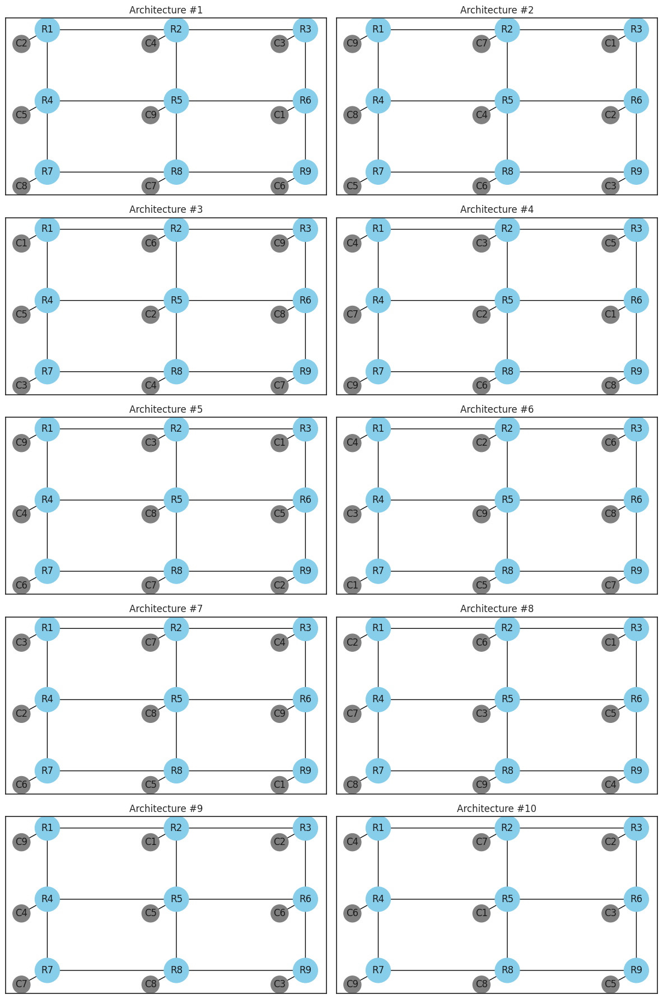

In [1580]:
population_mesh_fitness = calculate_fitness( population_mesh, 'delay', 'area' )
print( population_mesh_fitness )
plot_population( population_mesh )

#### Arquitectura Torus

[461037.82606451603, 450359.59122580645, 557141.939612903, 503750.7654193548, 493072.53058064514, 503750.76541935466, 503750.7654193548, 375611.94735483866, 482394.2957419355, 482394.2957419355]


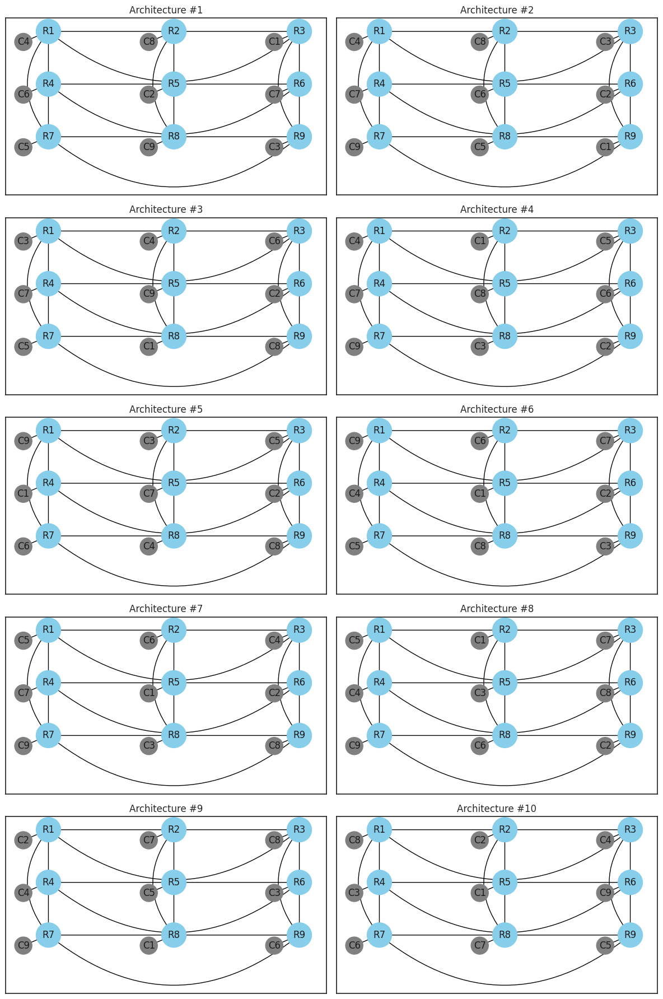

In [1581]:
population_torus_fitness = calculate_fitness( population_torus, 'delay', 'area' )
print( population_torus_fitness )
plot_population( population_torus )

#### Arquitectura Ring

[312672.63677419355, 328508.232, 428800.3350967742, 402407.6763870969, 402407.6763870969, 444635.9303225806, 486864.18425806455, 407686.20812903234, 381293.5494193548, 365457.9541935484]


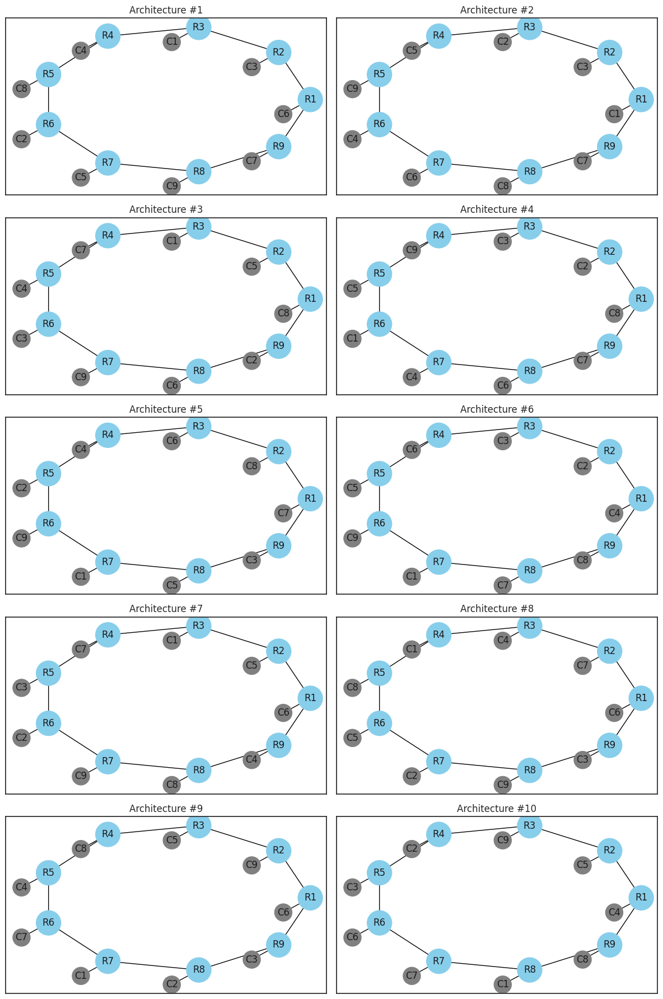

In [1582]:
population_ring_fitness = calculate_fitness( population_ring, 'delay', 'area' )
print( population_ring_fitness )
plot_population( population_ring )

#### Comparación

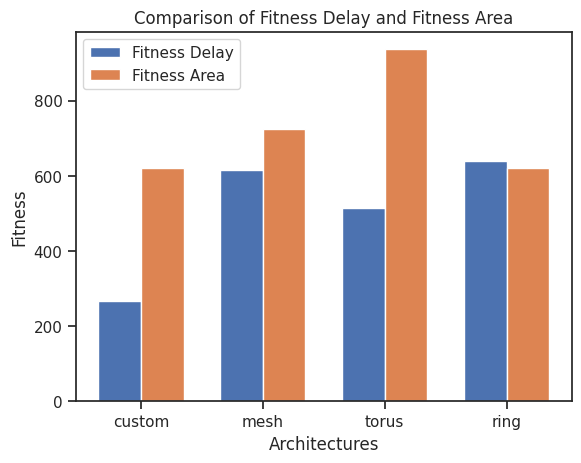

In [1583]:
def bar_graph():
    import seaborn as sns
    sns.set()
    sns.set_style('ticks')
    architectures = ['custom', 'mesh', 'torus', 'ring']
    fitness_delay = [np.mean(population_custom_fitness_delay), np.mean(population_mesh_fitness_delay), np.mean(population_torus_fitness_delay), np.mean(population_ring_fitness_delay)]
    fitness_area  = [np.mean(population_custom_fitness_area),  np.mean(population_mesh_fitness_area),  np.mean(population_torus_fitness_area),  np.mean(population_ring_fitness_area)]

    width = 0.35  # Ancho de las barras

    fig, ax = plt.subplots()
    ax.bar([x - width/2 for x in range(len(architectures))], fitness_delay, width, label='Fitness Delay')
    ax.bar([x + width/2 for x in range(len(architectures))], fitness_area, width, label='Fitness Area')

    ax.set_xlabel('Architectures')
    ax.set_ylabel('Fitness')
    ax.set_title('Comparison of Fitness Delay and Fitness Area')
    ax.set_xticks(range(len(architectures)))
    ax.set_xticklabels(architectures)
    ax.legend()

    plt.show()

bar_graph()

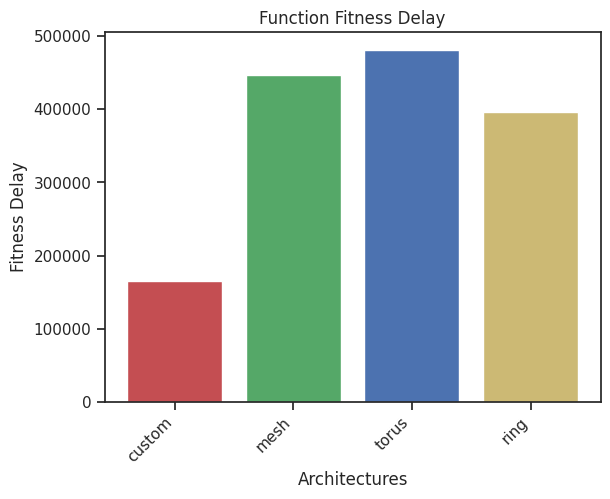

In [1584]:
def bar_graph( population_custom_fitness, population_mesh_fitness, population_torus_fitness, population_ring_fitness ):
  import seaborn as sns
  #sns.set()

  architectures = [ 'custom', 'mesh', 'torus', 'ring' ]

  fitness = [ np.mean(population_custom_fitness),np.mean(population_mesh_fitness),np.mean(population_torus_fitness),np.mean(population_ring_fitness) ]

  fig, ax = plt.subplots()
  ax.bar( architectures, fitness, color = ['r','g','b','y','m','c','k'] )
  labels = ax.get_xticklabels()
  plt.setp(labels, rotation = 45, horizontalalignment = 'right')
  plt.xlabel( 'Architectures' )
  plt.ylabel( 'Fitness Delay' )
  plt.title( 'Function Fitness Delay' )
  plt.show()

bar_graph( population_custom_fitness, population_mesh_fitness, population_torus_fitness, population_ring_fitness )

### Latencia/Area/Consumo

#### Architecture Custom

[164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002]


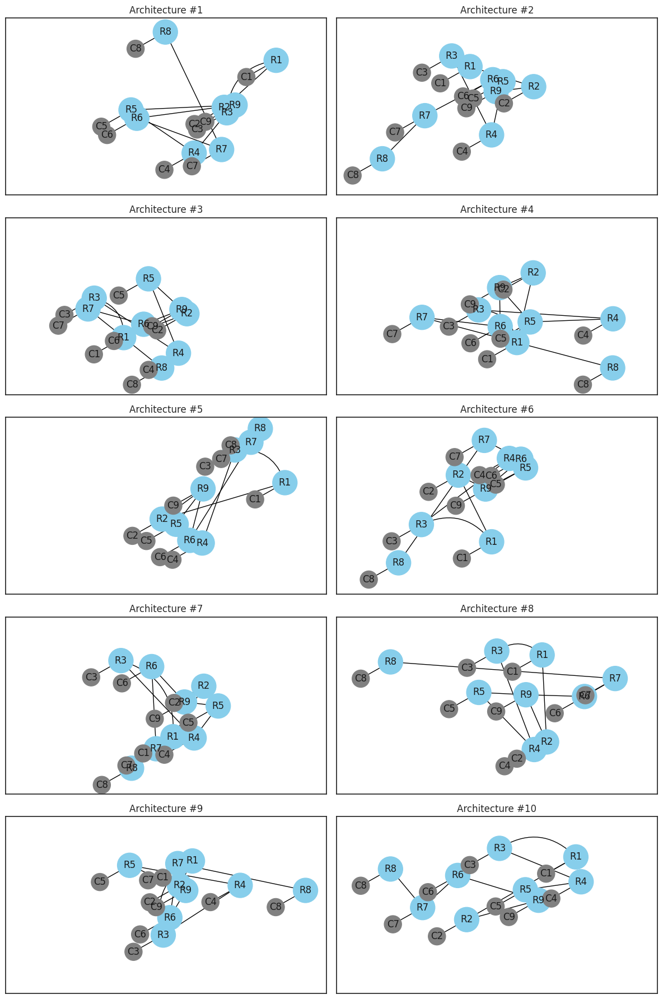

In [1585]:
population_custom_fitness = calculate_fitness( population_custom, 'delay', 'area' )
print( population_custom_fitness )
plot_population( population_custom )

#### Arquitectura Mesh

[311479.2371841596, 466493.4797762394, 424216.86816021765, 466493.4797762394, 480585.68364824663, 318525.33912016323, 544000.6010722793, 431262.9700962213, 487631.78558425035, 536954.4991362757]


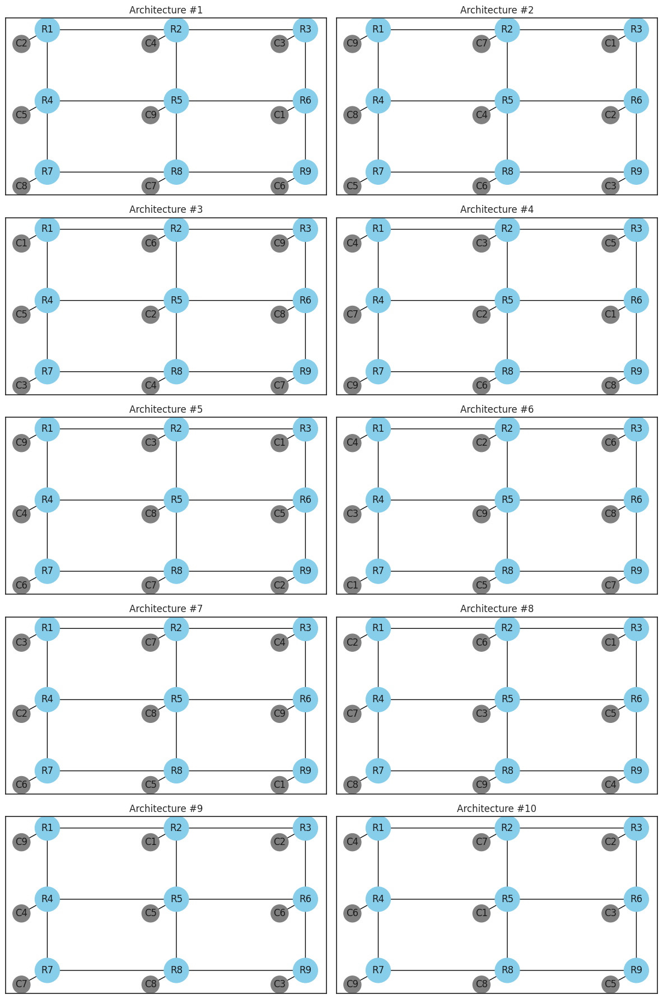

In [1586]:
population_mesh_fitness = calculate_fitness( population_mesh, 'delay', 'area' )
print( population_mesh_fitness )
plot_population( population_mesh )

#### Arquitectura Torus

[461037.82606451603, 450359.59122580645, 557141.939612903, 503750.7654193548, 493072.53058064514, 503750.76541935466, 503750.7654193548, 375611.94735483866, 482394.2957419355, 482394.2957419355]


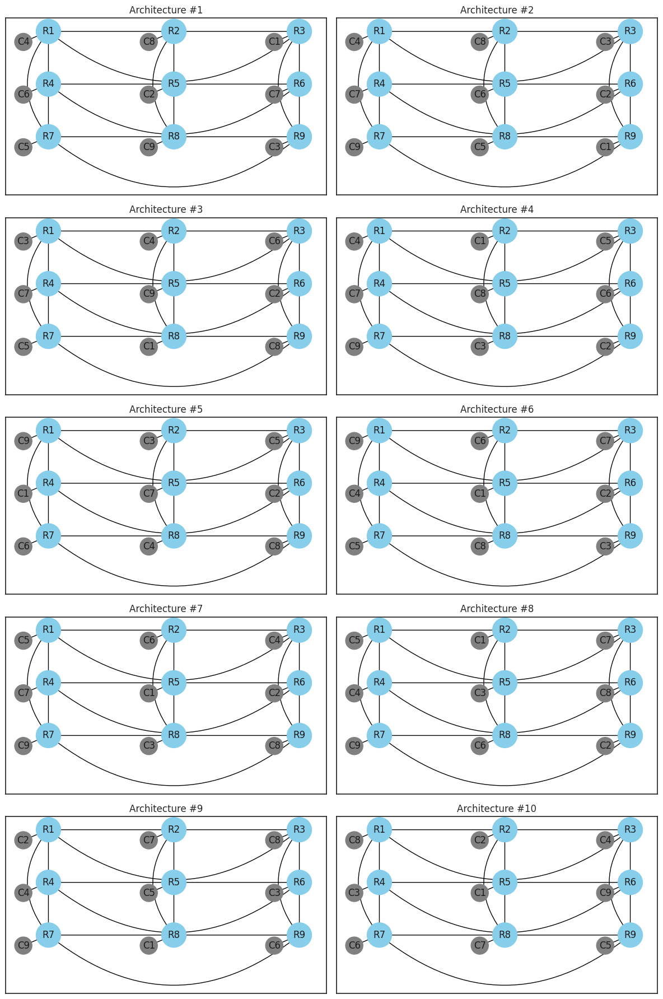

In [1587]:
population_torus_fitness = calculate_fitness( population_torus, 'delay', 'area' )
print( population_torus_fitness )
plot_population( population_torus )

#### Arquitectura Ring

[312672.63677419355, 328508.232, 428800.3350967742, 402407.6763870969, 402407.6763870969, 444635.9303225806, 486864.18425806455, 407686.20812903234, 381293.5494193548, 365457.9541935484]


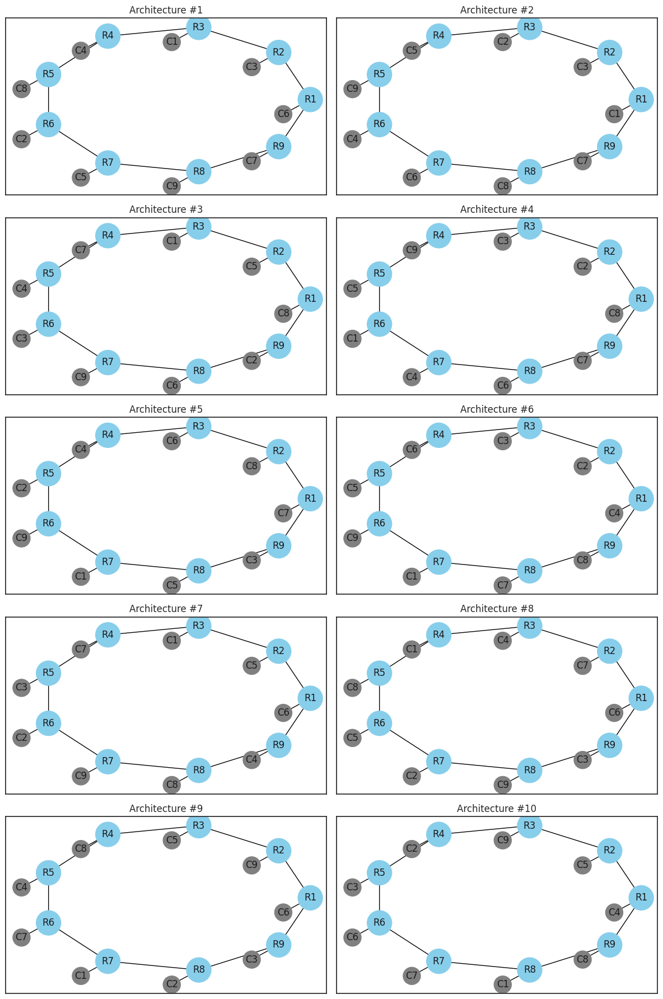

In [1588]:
population_ring_fitness = calculate_fitness( population_ring, 'delay', 'area' )
print( population_ring_fitness )
plot_population( population_ring )

#### Comparación

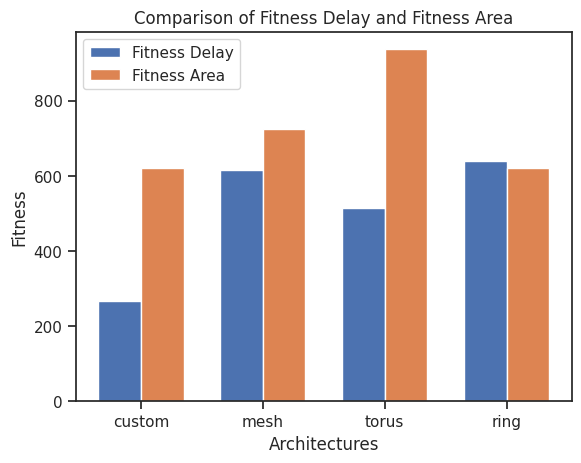

In [1589]:
def bar_graph():
    import seaborn as sns
    sns.set()
    sns.set_style('ticks')
    architectures = ['custom', 'mesh', 'torus', 'ring']
    fitness_delay = [np.mean(population_custom_fitness_delay), np.mean(population_mesh_fitness_delay), np.mean(population_torus_fitness_delay), np.mean(population_ring_fitness_delay)]
    fitness_area  = [np.mean(population_custom_fitness_area),  np.mean(population_mesh_fitness_area),  np.mean(population_torus_fitness_area),  np.mean(population_ring_fitness_area)]

    width = 0.35  # Ancho de las barras

    fig, ax = plt.subplots()
    ax.bar([x - width/2 for x in range(len(architectures))], fitness_delay, width, label='Fitness Delay')
    ax.bar([x + width/2 for x in range(len(architectures))], fitness_area, width, label='Fitness Area')

    ax.set_xlabel('Architectures')
    ax.set_ylabel('Fitness')
    ax.set_title('Comparison of Fitness Delay and Fitness Area')
    ax.set_xticks(range(len(architectures)))
    ax.set_xticklabels(architectures)
    ax.legend()

    plt.show()

bar_graph()

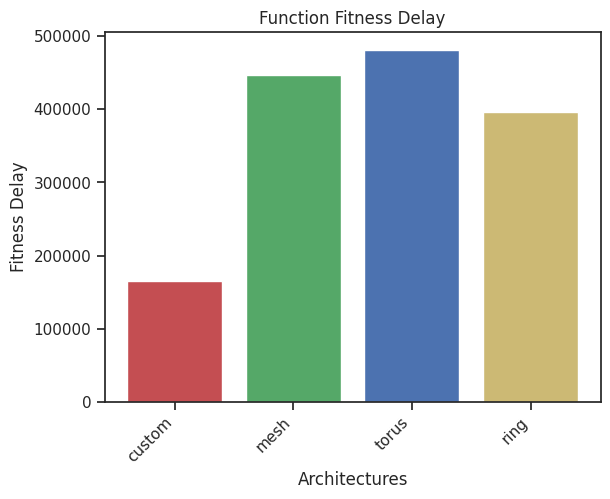

In [1590]:
def bar_graph( population_custom_fitness, population_mesh_fitness, population_torus_fitness, population_ring_fitness ):
  import seaborn as sns
  #sns.set()

  architectures = [ 'custom', 'mesh', 'torus', 'ring' ]

  fitness = [ np.mean(population_custom_fitness),np.mean(population_mesh_fitness),np.mean(population_torus_fitness),np.mean(population_ring_fitness) ]

  fig, ax = plt.subplots()
  ax.bar( architectures, fitness, color = ['r','g','b','y','m','c','k'] )
  labels = ax.get_xticklabels()
  plt.setp(labels, rotation = 45, horizontalalignment = 'right')
  plt.xlabel( 'Architectures' )
  plt.ylabel( 'Fitness Delay' )
  plt.title( 'Function Fitness Delay' )
  plt.show()

bar_graph( population_custom_fitness, population_mesh_fitness, population_torus_fitness, population_ring_fitness )

### Latencia/Area/Consumo/Confiabilidad

$$f = \frac{P_{NoC} \cdot A_{NoC} \cdot D_{NoC}}{R_{NoC}}$$

#### Architecture Custom

[164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002, 164873.74800000002]


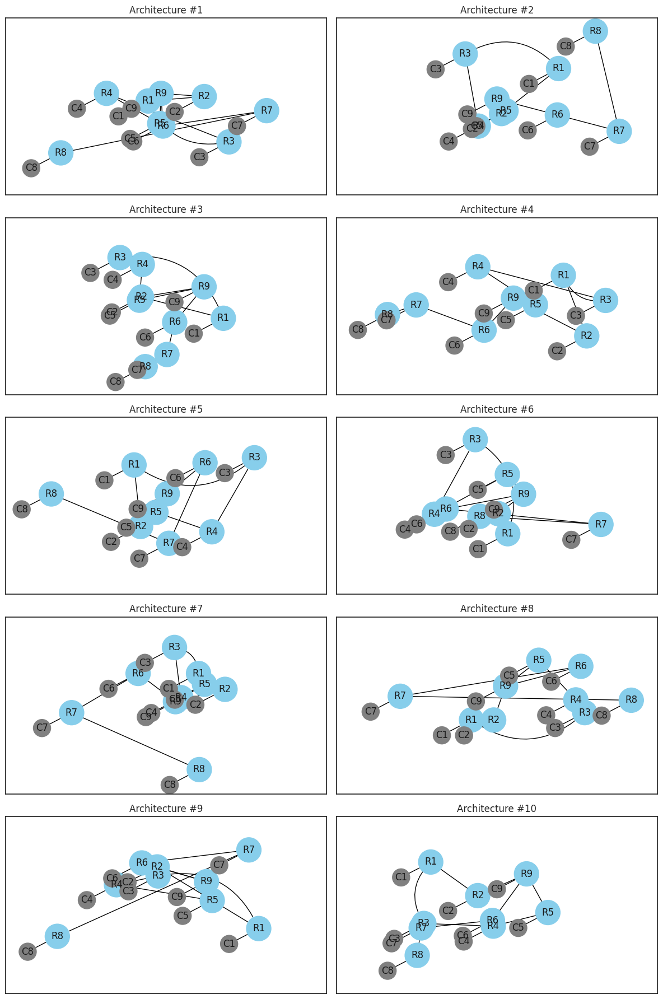

In [1591]:
population_custom_fitness = calculate_fitness( population_custom, 'delay', 'area' )
print( population_custom_fitness )
plot_population( population_custom )

#### Arquitectura Mesh

[311479.2371841596, 466493.4797762394, 424216.86816021765, 466493.4797762394, 480585.68364824663, 318525.33912016323, 544000.6010722793, 431262.9700962213, 487631.78558425035, 536954.4991362757]


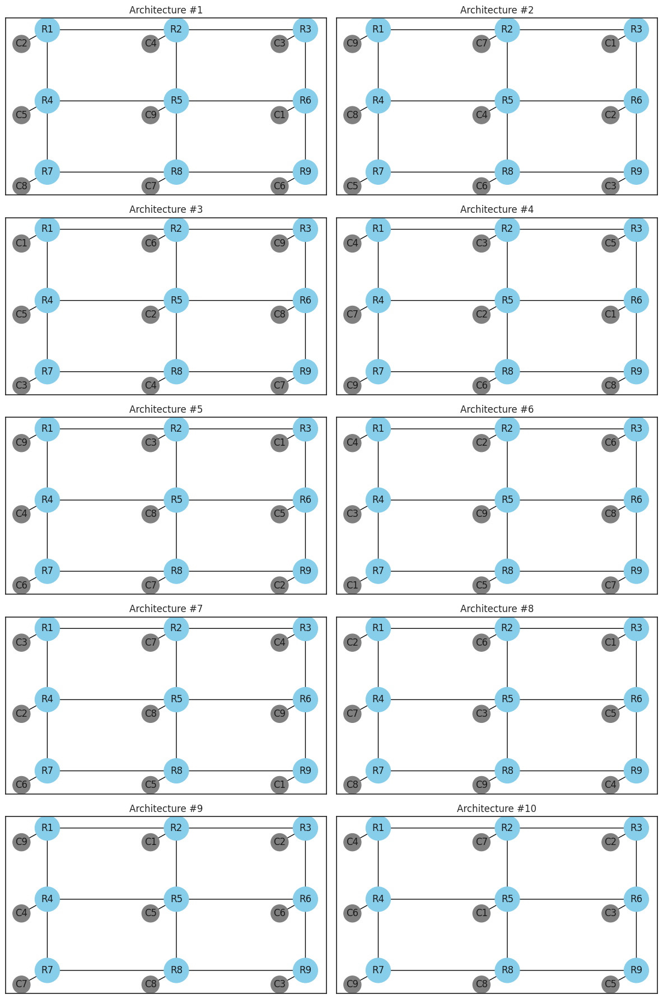

In [1592]:
population_mesh_fitness = calculate_fitness( population_mesh, 'delay', 'area' )
print( population_mesh_fitness )
plot_population( population_mesh )

#### Arquitectura Torus

[461037.82606451603, 450359.59122580645, 557141.939612903, 503750.7654193548, 493072.53058064514, 503750.76541935466, 503750.7654193548, 375611.94735483866, 482394.2957419355, 482394.2957419355]


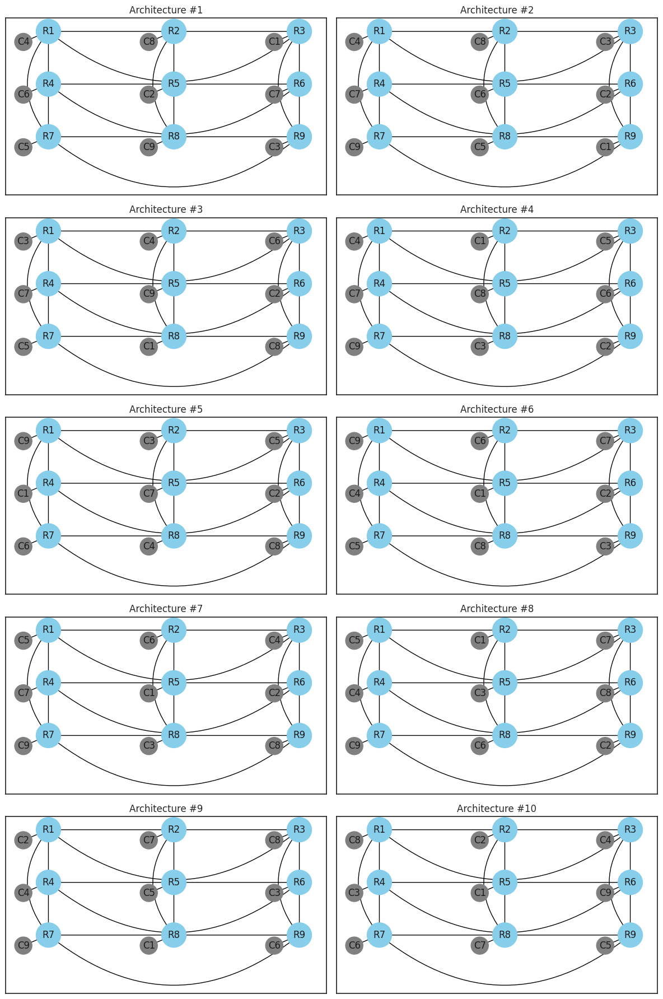

In [1593]:
population_torus_fitness = calculate_fitness( population_torus, 'delay', 'area' )
print( population_torus_fitness )
plot_population( population_torus )

#### Arquitectura Ring

[312672.63677419355, 328508.232, 428800.3350967742, 402407.6763870969, 402407.6763870969, 444635.9303225806, 486864.18425806455, 407686.20812903234, 381293.5494193548, 365457.9541935484]


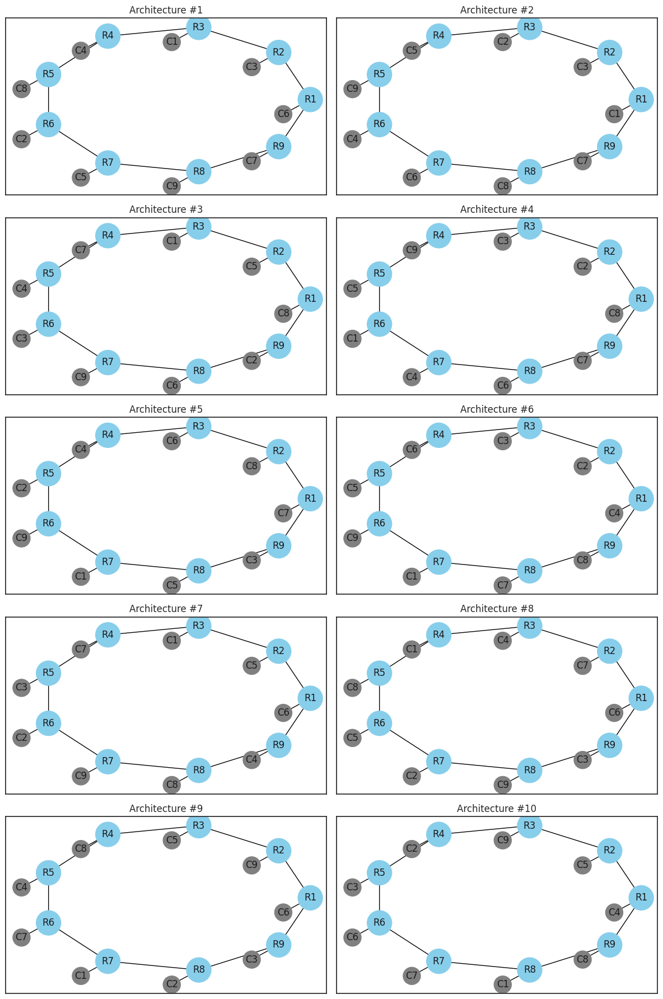

In [1594]:
population_ring_fitness = calculate_fitness( population_ring, 'delay', 'area' )
print( population_ring_fitness )
plot_population( population_ring )

#### Comparación

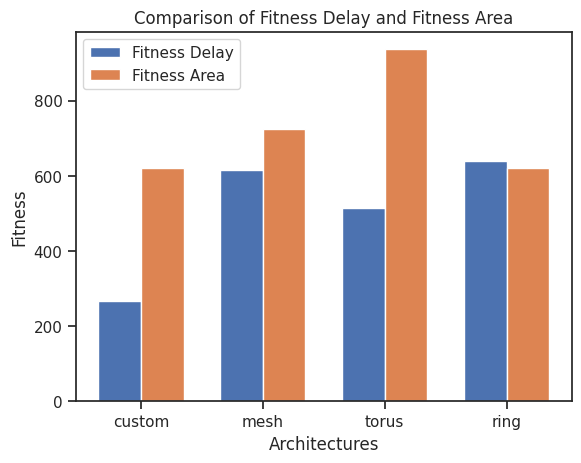

In [1595]:
def bar_graph():
    import seaborn as sns
    sns.set()
    sns.set_style('ticks')
    architectures = ['custom', 'mesh', 'torus', 'ring']
    fitness_delay = [np.mean(population_custom_fitness_delay), np.mean(population_mesh_fitness_delay), np.mean(population_torus_fitness_delay), np.mean(population_ring_fitness_delay)]
    fitness_area  = [np.mean(population_custom_fitness_area),  np.mean(population_mesh_fitness_area),  np.mean(population_torus_fitness_area),  np.mean(population_ring_fitness_area)]

    width = 0.35  # Ancho de las barras

    fig, ax = plt.subplots()
    ax.bar([x - width/2 for x in range(len(architectures))], fitness_delay, width, label='Fitness Delay')
    ax.bar([x + width/2 for x in range(len(architectures))], fitness_area, width, label='Fitness Area')

    ax.set_xlabel('Architectures')
    ax.set_ylabel('Fitness')
    ax.set_title('Comparison of Fitness Delay and Fitness Area')
    ax.set_xticks(range(len(architectures)))
    ax.set_xticklabels(architectures)
    ax.legend()

    plt.show()




bar_graph()

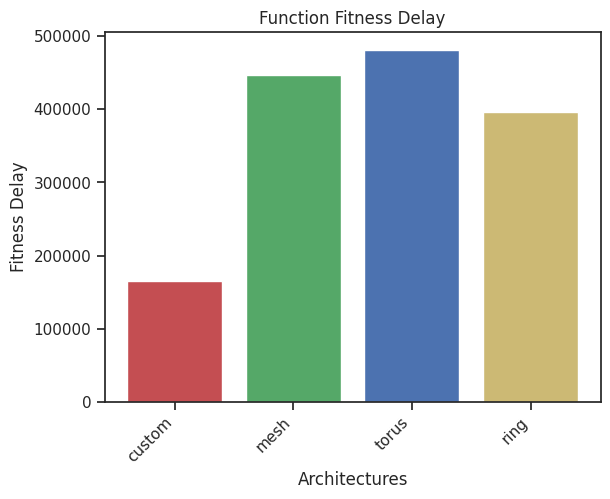

In [1596]:
def bar_graph( population_custom_fitness, population_mesh_fitness, population_torus_fitness, population_ring_fitness ):
  import seaborn as sns
  #sns.set()

  architectures = [ 'custom', 'mesh', 'torus', 'ring' ]

  fitness = [ np.mean(population_custom_fitness),np.mean(population_mesh_fitness),np.mean(population_torus_fitness),np.mean(population_ring_fitness) ]

  fig, ax = plt.subplots()
  ax.bar( architectures, fitness, color = ['r','g','b','y','m','c','k'] )
  labels = ax.get_xticklabels()
  plt.setp(labels, rotation = 45, horizontalalignment = 'right')
  plt.xlabel( 'Architectures' )
  plt.ylabel( 'Fitness Delay' )
  plt.title( 'Function Fitness Delay' )
  plt.show()

bar_graph( population_custom_fitness, population_mesh_fitness, population_torus_fitness, population_ring_fitness )

# Algoritmos Genéticos

## Clase Algoritmos Geneticos

In [1597]:
class GeneticAlgorithm():
  def __init__( self, initial_population = None , metrics=None):

    self.population = []
    self.metrics    = metrics
    self.population         = initial_population
    self.initial_population = initial_population

    self.calculate_fitness  = calculate_fitness
    self.selection          = selection
    self.mutation           = mutation_population

    self.best_individuals = []
    self.best_individuals_fitness = []

  def generate_population( self, initial_population ):
    population = []
    if initial_population is not None:
      return initial_population
    else:
      return None

  def initialize( self, initial_population ):
    self.population         = self.generate_population( initial_population )
    self.population_fitness = self.calculate_fitness( self.population, self.metrics )
    self.initial_population_fitness = self.population_fitness

    calculate_full_fitness( self.population )



  def solve( self ):
    self.initialize( self.initial_population )

    number_of_iteration = 0
    while number_of_iteration < 100:
      print( f'Iteration: {number_of_iteration}' )

      set_parameters_architectures_population( self.population )

      self.population = self.selection( self.population, self.population_fitness )
      self.best_individuals.append( self.population[0] )
      self.best_individuals_fitness = self.calculate_fitness( self.best_individuals, self.metrics )

      set_parameters_architectures_population( self.population )

      #self.population = self.crossover( self.population )
      self.population = self.mutation( self.population, 2, 4, 5 )
      set_parameters_architectures_population( self.population )
      self.population_fitness = self.calculate_fitness( self.population, self.metrics )

      set_parameters_architectures_population( self.population )

      calculate_full_fitness( self.best_individuals )
      calculate_full_fitness( self.population )

      #self.best_individual = self.get_best_individual( self.population )

      #self.best_individuals.append( self.best_indiviudal )

      number_of_iteration += 1



# Optimización Mono-Objetivo

## Graficas de barras

In [1598]:
def plot_mean_line(ax, data, color, linestyle, label):
    mean_value = np.mean(data)
    ax.axhline(mean_value, color=color, linestyle=linestyle, label=label)

def bar_graph_population( initial_population_fitness, population_fitness, metric, show_comparison=True):
    architectures = range(1, len(population_fitness) + 1)
    fitness_population = population_fitness
    fitness_initial_population = initial_population_fitness
    mean_initial_population = np.mean(initial_population_fitness)
    mean_population = np.mean(population_fitness)

    width = 0.35
    fig, ax = plt.subplots(figsize=(8, 6))

    if show_comparison:
        ax.bar([x - width/2 for x in architectures], initial_population_fitness, width, color='blue',  label='Initial population')
        ax.bar([x + width/2 for x in architectures], population_fitness,         width, color='green', label='Optimal population')
        plot_mean_line(ax, initial_population_fitness, 'blue', '--', 'Mean Initial Population')
        plot_mean_line(ax, population_fitness, 'green', '--', 'Mean Population')
    else:
        ax.bar(architectures, population_fitness, width, color='green', label='Population')
        plot_mean_line(ax, population_fitness, 'green', '--', 'Mean Population')

    ax.set_xticks(architectures)
    ax.set_xlabel('Architecture')
    ax.set_ylabel('Fitness')
    ax.set_title(f'Function Fitness {metric} vs Architecture')
    ax.legend()


    plt.show()


## Latencia

### Arquitectura Custom

#### Población Inicial




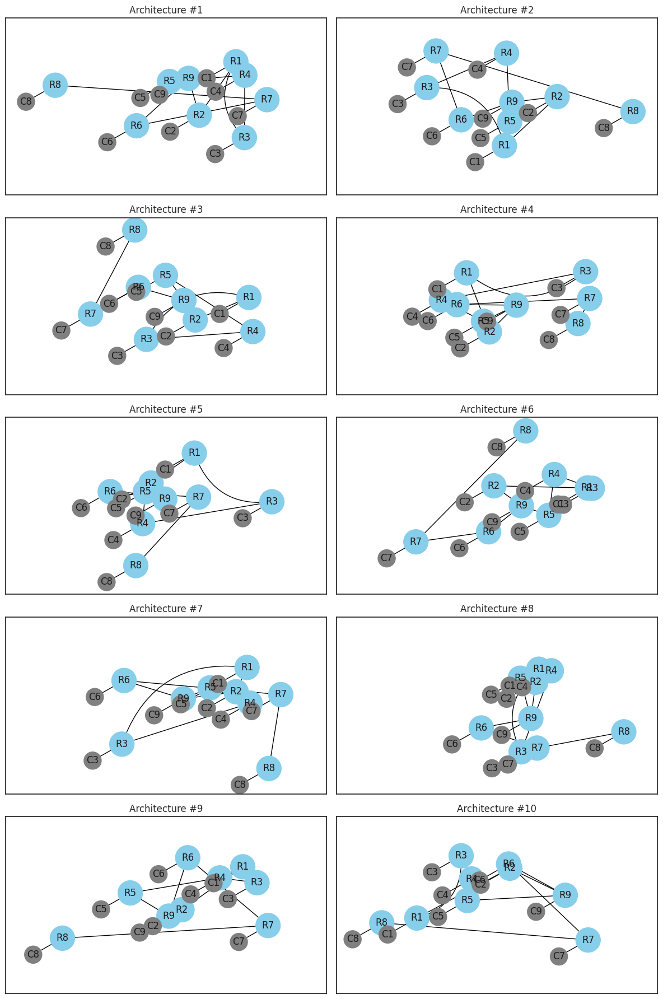

In [1599]:
plot_population( population_custom )

#### Optimización

In [1600]:
GA_custom = GeneticAlgorithm( population_custom, 'delay' )
GA_custom.solve()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
Iteration: 9
Iteration: 10
Iteration: 11
Iteration: 12
Iteration: 13
Iteration: 14
Iteration: 15
Iteration: 16
Iteration: 17
Iteration: 18
Iteration: 19
Iteration: 20
Iteration: 21
Iteration: 22
Iteration: 23
Iteration: 24
Iteration: 25
Iteration: 26
Iteration: 27
Iteration: 28
Iteration: 29
Iteration: 30
Iteration: 31
Iteration: 32
Iteration: 33
Iteration: 34
Iteration: 35
Iteration: 36
Iteration: 37
Iteration: 38
Iteration: 39
Iteration: 40
Iteration: 41
Iteration: 42
Iteration: 43
Iteration: 44
Iteration: 45
Iteration: 46
Iteration: 47
Iteration: 48
Iteration: 49
Iteration: 50
Iteration: 51
Iteration: 52
Iteration: 53
Iteration: 54
Iteration: 55
Iteration: 56
Iteration: 57
Iteration: 58
Iteration: 59
Iteration: 60
Iteration: 61
Iteration: 62
Iteration: 63
Iteration: 64
Iteration: 65
Iteration: 66
Iteration: 67
Iteration: 68
Iteration: 69
Iteration: 70
Iteration: 71
It

#### Evolución Generaciones

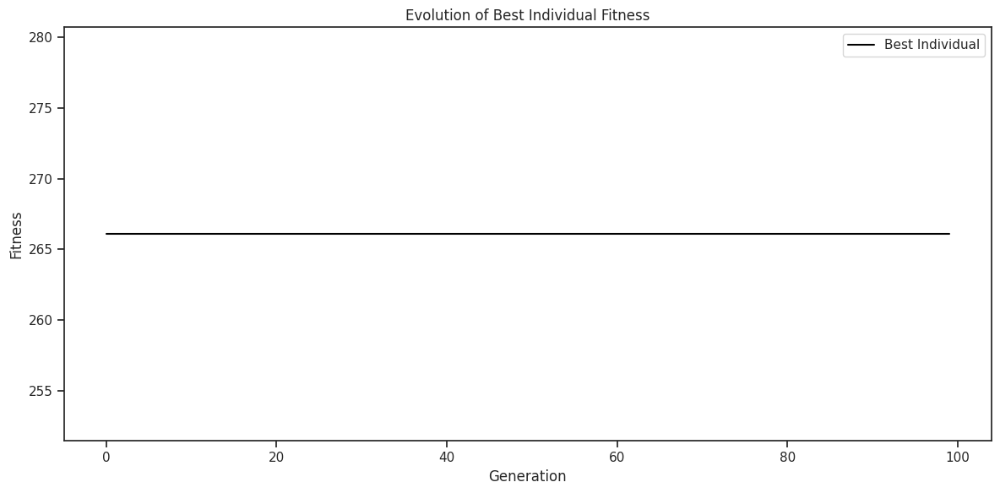

In [1601]:
def plot_best_individual_evolution_generations(best_individual_per_generation):
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals = best_individual_per_generation

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals, color='black', label='Best Individual')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_custom.best_individuals_fitness )

#### Población Inicial vs Optimizada

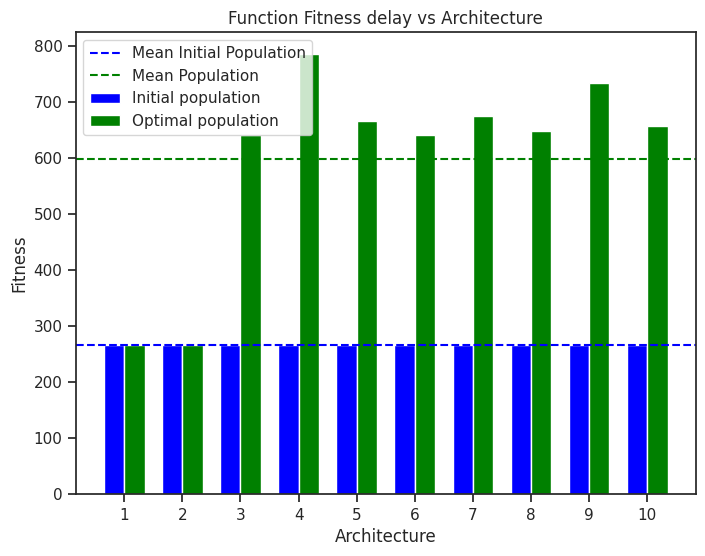

In [1602]:
bar_graph_population( GA_custom.initial_population_fitness, GA_custom.population_fitness, 'delay' , True )

### Arquitectura Mesh

#### Población Inicial




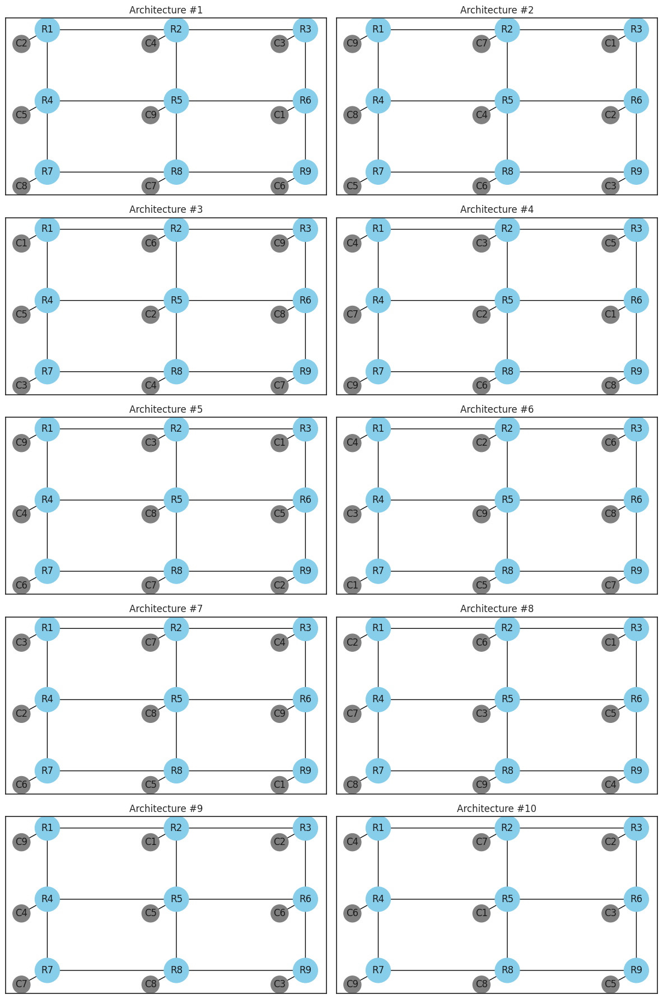

In [1603]:
plot_population( population_mesh )

#### Optimización

In [1604]:
GA_mesh = GeneticAlgorithm( population_mesh, 'delay' )
GA_mesh.solve()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
Iteration: 9
Iteration: 10
Iteration: 11
Iteration: 12
Iteration: 13
Iteration: 14
Iteration: 15
Iteration: 16
Iteration: 17
Iteration: 18
Iteration: 19
Iteration: 20
Iteration: 21
Iteration: 22
Iteration: 23
Iteration: 24
Iteration: 25
Iteration: 26
Iteration: 27
Iteration: 28
Iteration: 29
Iteration: 30
Iteration: 31
Iteration: 32
Iteration: 33
Iteration: 34
Iteration: 35
Iteration: 36
Iteration: 37
Iteration: 38
Iteration: 39
Iteration: 40
Iteration: 41
Iteration: 42
Iteration: 43
Iteration: 44
Iteration: 45
Iteration: 46
Iteration: 47
Iteration: 48
Iteration: 49
Iteration: 50
Iteration: 51
Iteration: 52
Iteration: 53
Iteration: 54
Iteration: 55
Iteration: 56
Iteration: 57
Iteration: 58
Iteration: 59
Iteration: 60
Iteration: 61
Iteration: 62
Iteration: 63
Iteration: 64
Iteration: 65
Iteration: 66
Iteration: 67
Iteration: 68
Iteration: 69
Iteration: 70
Iteration: 71
It

#### Evolución Generaciones

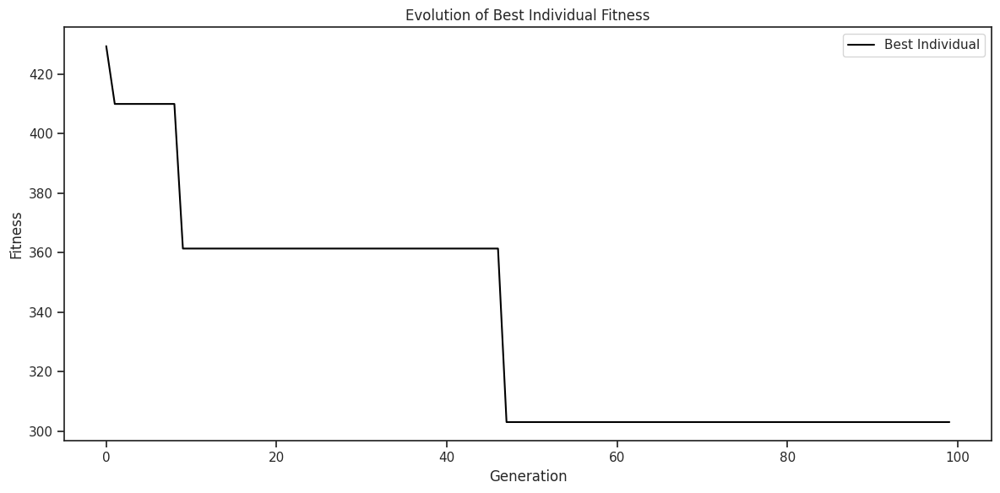

In [1605]:
def plot_best_individual_evolution_generations(best_individual_per_generation):
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals = best_individual_per_generation

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals, color='black', label='Best Individual')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_mesh.best_individuals_fitness )

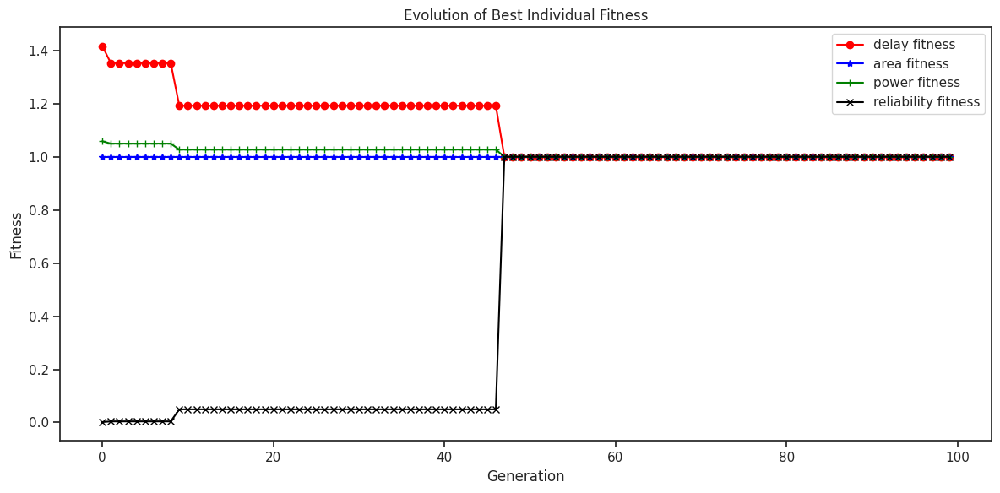

In [1606]:
def plot_best_individual_evolution_generations(  best_individual_per_generation ):
    from sklearn.preprocessing import MinMaxScaler
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals_delay       = []
    y_vals_area        = []
    y_vals_power       = []
    y_vals_reliability = []


    for individual in best_individual_per_generation:
      y_vals_delay.append( individual.fitness_delay )
      y_vals_area.append( individual.fitness_area )
      y_vals_power.append(individual.fitness_power )
      y_vals_reliability.append( individual.fitness_reliability )

    plt.figure(figsize=(12, 6))


    y_vals_delay       = y_vals_delay/np.min(y_vals_delay)
    y_vals_area        = y_vals_area/np.min(y_vals_area)
    y_vals_power       = y_vals_power/np.min(y_vals_power)
    y_vals_reliability = y_vals_reliability/np.max(y_vals_reliability)

    plt.plot(x_vals, y_vals_delay,       color='red', marker='o', label='delay fitness')
    plt.plot(x_vals, y_vals_area,        color='blue', marker='*', label='area fitness')
    plt.plot(x_vals, y_vals_power,       color='green', marker='+', label='power fitness')
    plt.plot(x_vals, y_vals_reliability, color='black', marker='x', label='reliability fitness')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_mesh.best_individuals )

#### Población Inicial vs Optimizada

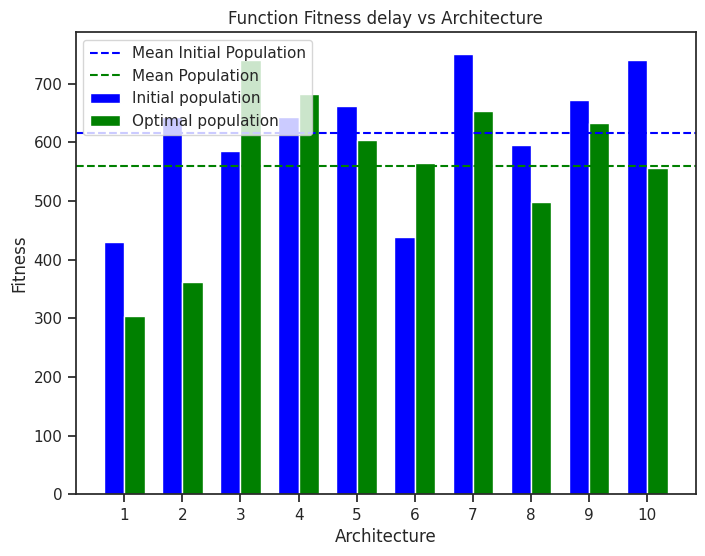

In [1607]:
bar_graph_population( GA_mesh.initial_population_fitness, GA_mesh.population_fitness, 'delay' , True )

### Arquitectura Torus

#### Población Inicial

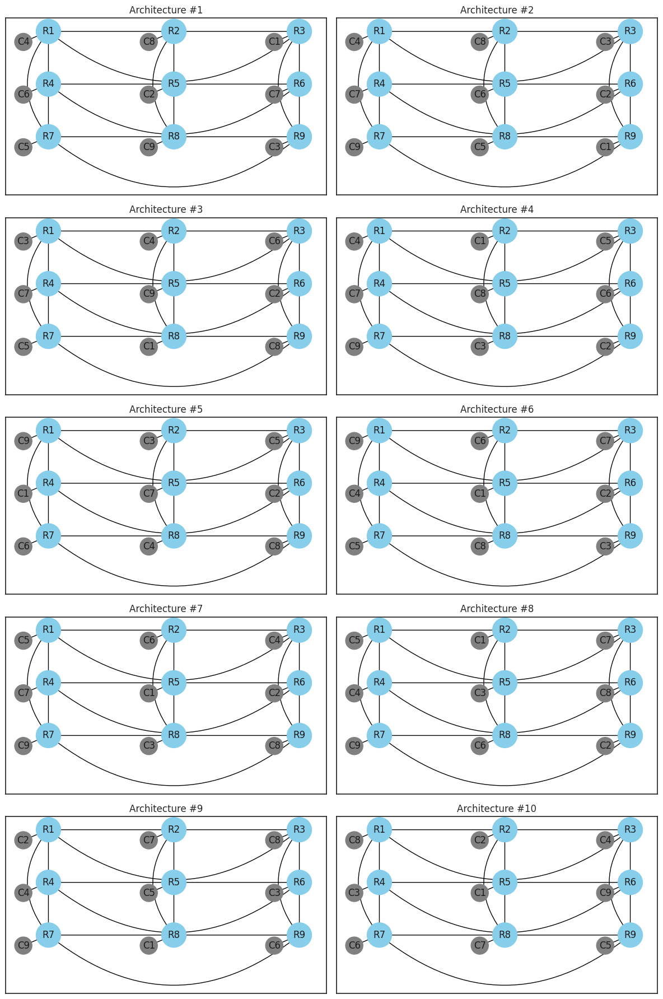

In [1608]:
plot_population( population_torus )

#### Optimización

In [1609]:
GA_torus = GeneticAlgorithm( population_torus, 'delay' )
GA_torus.solve()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
Iteration: 9
Iteration: 10
Iteration: 11
Iteration: 12
Iteration: 13
Iteration: 14
Iteration: 15
Iteration: 16
Iteration: 17
Iteration: 18
Iteration: 19
Iteration: 20
Iteration: 21
Iteration: 22
Iteration: 23
Iteration: 24
Iteration: 25
Iteration: 26
Iteration: 27
Iteration: 28
Iteration: 29
Iteration: 30
Iteration: 31
Iteration: 32
Iteration: 33
Iteration: 34
Iteration: 35
Iteration: 36
Iteration: 37
Iteration: 38
Iteration: 39
Iteration: 40
Iteration: 41
Iteration: 42
Iteration: 43
Iteration: 44
Iteration: 45
Iteration: 46
Iteration: 47
Iteration: 48
Iteration: 49
Iteration: 50
Iteration: 51
Iteration: 52
Iteration: 53
Iteration: 54
Iteration: 55
Iteration: 56
Iteration: 57
Iteration: 58
Iteration: 59
Iteration: 60
Iteration: 61
Iteration: 62
Iteration: 63
Iteration: 64
Iteration: 65
Iteration: 66
Iteration: 67
Iteration: 68
Iteration: 69
Iteration: 70
Iteration: 71
It

#### Evolución Generaciones

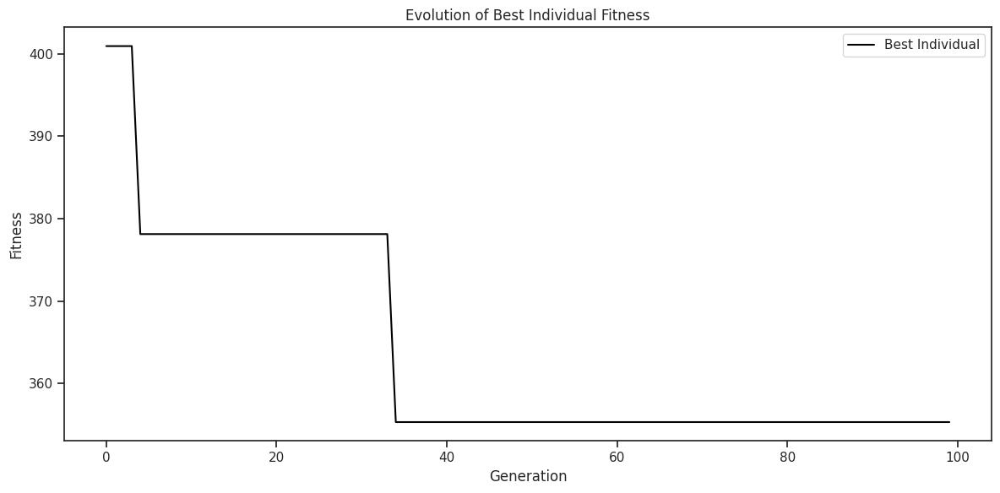

In [1610]:
def plot_best_individual_evolution_generations(best_individual_per_generation):
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals = best_individual_per_generation

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals, color='black', label='Best Individual')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_torus.best_individuals_fitness )

#### Población Inicial vs Optimizada

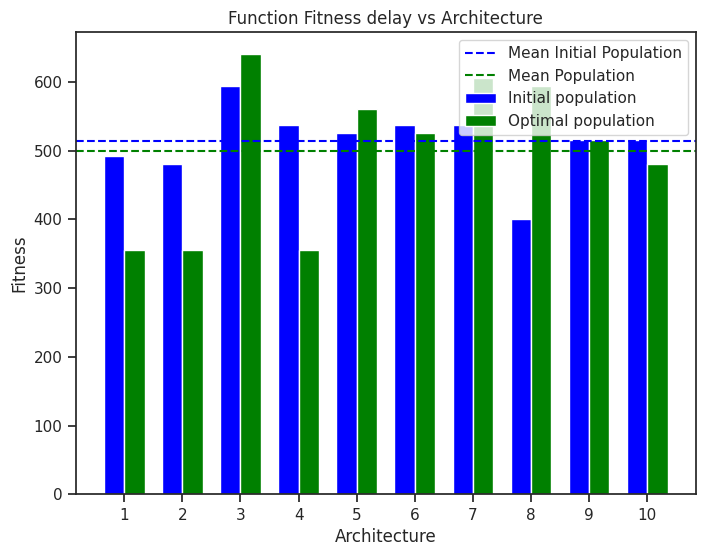

In [1611]:
bar_graph_population( GA_torus.initial_population_fitness, GA_torus.population_fitness, 'delay' , True )

### Arquitectura Ring

#### Población Inicial

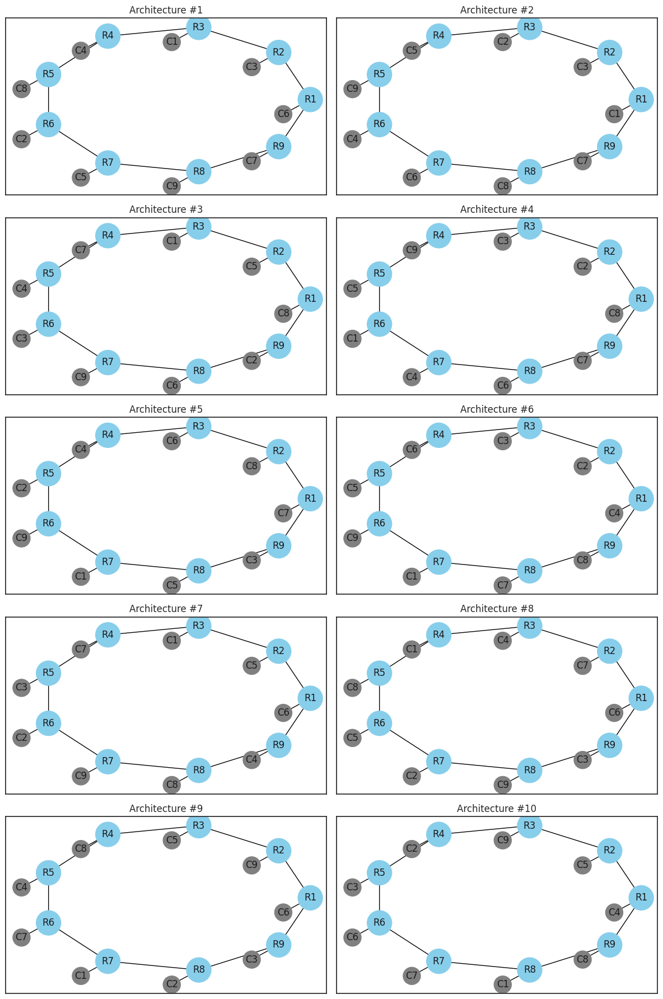

In [1612]:
plot_population( population_ring )

#### Optimización

In [1613]:
GA_ring = GeneticAlgorithm( population_ring, 'delay' )
GA_ring.solve()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
Iteration: 9
Iteration: 10
Iteration: 11
Iteration: 12
Iteration: 13
Iteration: 14
Iteration: 15
Iteration: 16
Iteration: 17
Iteration: 18
Iteration: 19
Iteration: 20
Iteration: 21
Iteration: 22
Iteration: 23
Iteration: 24
Iteration: 25
Iteration: 26
Iteration: 27
Iteration: 28
Iteration: 29
Iteration: 30
Iteration: 31
Iteration: 32
Iteration: 33
Iteration: 34
Iteration: 35
Iteration: 36
Iteration: 37
Iteration: 38
Iteration: 39
Iteration: 40
Iteration: 41
Iteration: 42
Iteration: 43
Iteration: 44
Iteration: 45
Iteration: 46
Iteration: 47
Iteration: 48
Iteration: 49
Iteration: 50
Iteration: 51
Iteration: 52
Iteration: 53
Iteration: 54
Iteration: 55
Iteration: 56
Iteration: 57
Iteration: 58
Iteration: 59
Iteration: 60
Iteration: 61
Iteration: 62
Iteration: 63
Iteration: 64
Iteration: 65
Iteration: 66
Iteration: 67
Iteration: 68
Iteration: 69
Iteration: 70
Iteration: 71
It

#### Evolución Generaciones

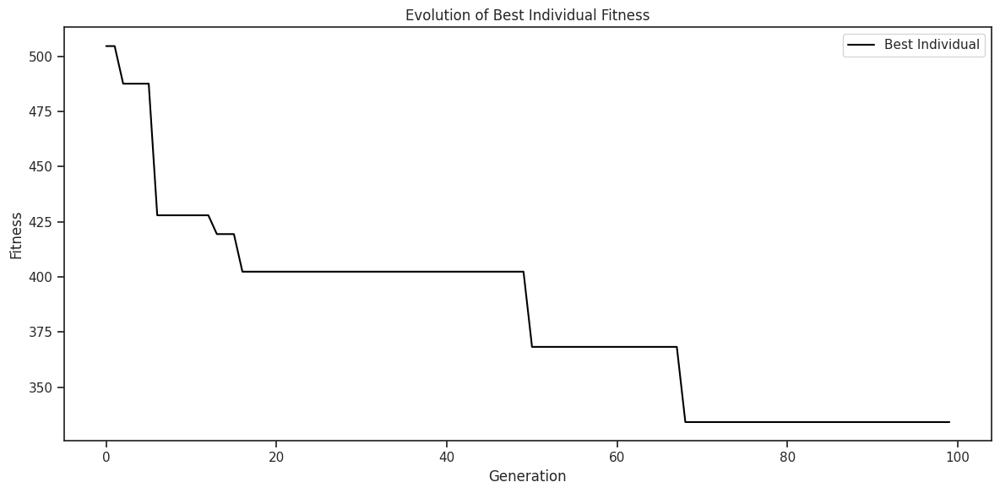

In [1614]:
def plot_best_individual_evolution_generations(best_individual_per_generation):
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals = best_individual_per_generation

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals, color='black', label='Best Individual')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_ring.best_individuals_fitness )

#### Población Inicial vs Optimizada

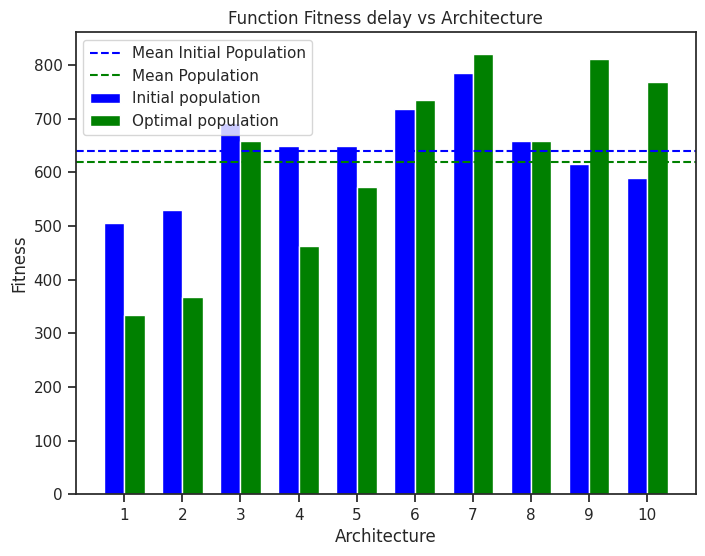

In [1615]:
bar_graph_population( GA_ring.initial_population_fitness, GA_ring.population_fitness, 'delay' , True )

### Comparación Arquitecturas

##### Evolución Generaciones

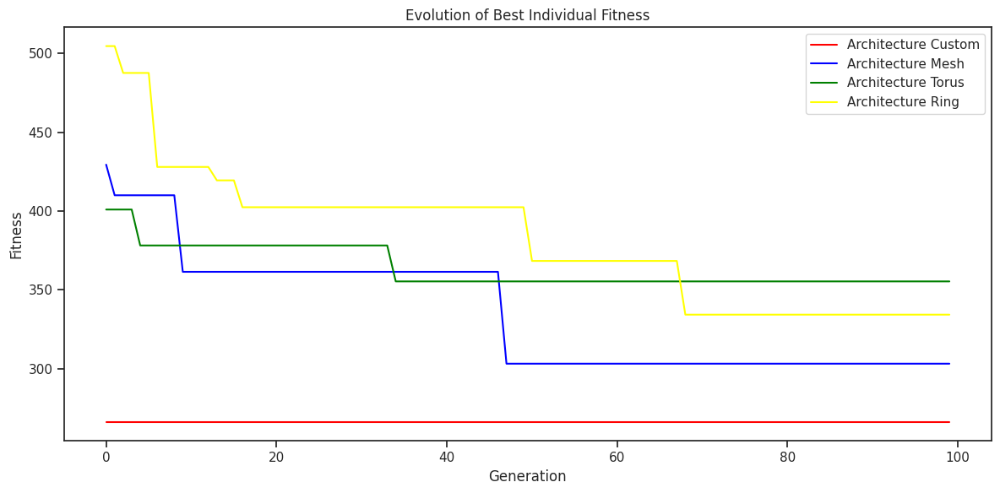

In [1616]:
def plot_best_individual_evolution_generations(best_individuals_custom, best_individuals_mesh, best_individuals_torus, best_individuals_ring):
    import seaborn as sns

    x_vals = np.arange(len(best_individuals_mesh))
    y_vals_custom = best_individuals_custom
    y_vals_mesh   = best_individuals_mesh
    y_vals_torus  = best_individuals_torus
    y_vals_ring   = best_individuals_ring

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals_custom, color='red',     label='Architecture Custom')
    plt.plot(x_vals, y_vals_mesh,   color='blue',    label='Architecture Mesh')
    plt.plot(x_vals, y_vals_torus,  color='green' ,  label='Architecture Torus' )
    plt.plot(x_vals, y_vals_ring,   color ='yellow', label='Architecture Ring' )


    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_custom.best_individuals_fitness, GA_mesh.best_individuals_fitness, GA_torus.best_individuals_fitness, GA_ring.best_individuals_fitness )

#### Comparación

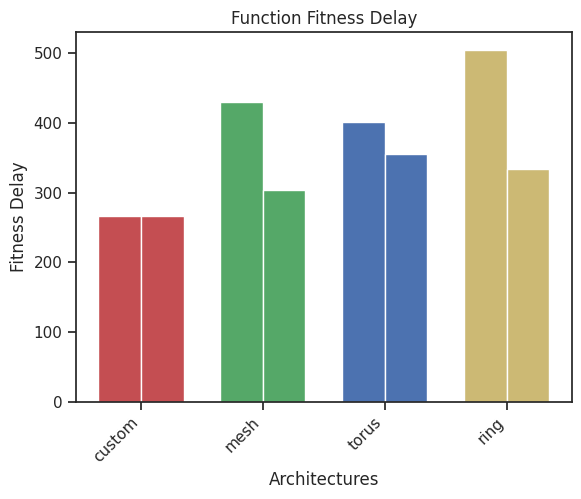

In [1617]:
def bar_graph_delay_architectures( initial_architectures, optimized_architectures  ):
  import seaborn as sns
  sns.set()
  sns.set_style('ticks')

  architectures = ['custom', 'mesh', 'torus', 'ring']

  initial_architectures_delay_network_topology = [architecture.metric_delay.total_delay for architecture in initial_architectures]
  initial_architectures_type_network_topology  = [architecture.topology_type for architecture in initial_architectures]

  optimized_architectures_delay_network_topology = [architecture.metric_delay.total_delay for architecture in optimized_architectures]
  optimized_architectures_type_network_topology  = [architecture.topology_type for architecture in optimized_architectures]


  fig, ax = plt.subplots()

  width = 0.35  # Ancho de las barras
  offset = width / 2  # Espacio entre las barras

  ax.bar(np.arange(len(architectures)) - offset, initial_architectures_delay_network_topology, width, color=['r','g','b','y','m','c','k'], label='Reliability Network Topology')
  ax.bar(np.arange(len(architectures)) + offset, optimized_architectures_delay_network_topology, width, color=['r','g','b','y','m','c','k'], label='Reliability Minimum Edge Cut Set')


  labels = ax.get_xticklabels()
  plt.setp(labels, rotation = 45, horizontalalignment = 'right')

  plt.xlabel( 'Architectures' )
  plt.ylabel( 'Fitness Delay' )
  plt.title( 'Function Fitness Delay' )
  ax.set_xticks(range(len(population)))
  ax.set_xticklabels(architectures)
  #ax.legend()

  plt.show()

architectures = []
architectures.append( architecture_custom )
architectures.append( architecture_mesh )
architectures.append( architecture_torus )
architectures.append( architecture_ring )

initial_architectures = []
initial_architectures.append( GA_custom.best_individuals[0] )
initial_architectures.append( GA_mesh.best_individuals[0]  )
initial_architectures.append( GA_torus.best_individuals[0]  )
initial_architectures.append( GA_ring.best_individuals[0]  )

optimized_architectures = []
optimized_architectures.append( GA_custom.best_individuals[-1] )
optimized_architectures .append( GA_mesh.best_individuals[-1]  )
optimized_architectures .append( GA_torus.best_individuals[-1]  )
optimized_architectures .append( GA_ring.best_individuals[-1] )

bar_graph_delay_architectures( initial_architectures, optimized_architectures  )


## Area

### Arquitectura Custom

#### Población Inicial




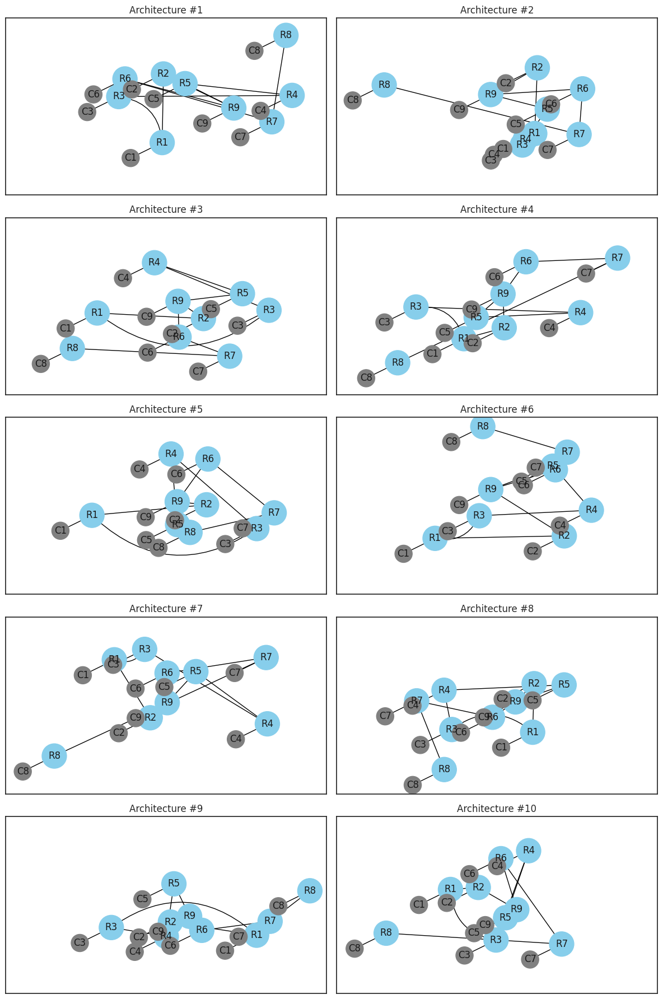

In [1618]:
plot_population( population_custom )

#### Optimización

In [1619]:
GA_custom = GeneticAlgorithm( population_custom, 'area' )
GA_custom.solve()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
Iteration: 9
Iteration: 10
Iteration: 11
Iteration: 12
Iteration: 13
Iteration: 14
Iteration: 15
Iteration: 16
Iteration: 17
Iteration: 18
Iteration: 19
Iteration: 20
Iteration: 21
Iteration: 22
Iteration: 23
Iteration: 24
Iteration: 25
Iteration: 26
Iteration: 27
Iteration: 28
Iteration: 29
Iteration: 30
Iteration: 31
Iteration: 32
Iteration: 33
Iteration: 34
Iteration: 35
Iteration: 36
Iteration: 37
Iteration: 38
Iteration: 39
Iteration: 40
Iteration: 41
Iteration: 42
Iteration: 43
Iteration: 44
Iteration: 45
Iteration: 46
Iteration: 47
Iteration: 48
Iteration: 49
Iteration: 50
Iteration: 51
Iteration: 52
Iteration: 53
Iteration: 54
Iteration: 55
Iteration: 56
Iteration: 57
Iteration: 58
Iteration: 59
Iteration: 60
Iteration: 61
Iteration: 62
Iteration: 63
Iteration: 64
Iteration: 65
Iteration: 66
Iteration: 67
Iteration: 68
Iteration: 69
Iteration: 70
Iteration: 71
It

#### Evolución Generaciones

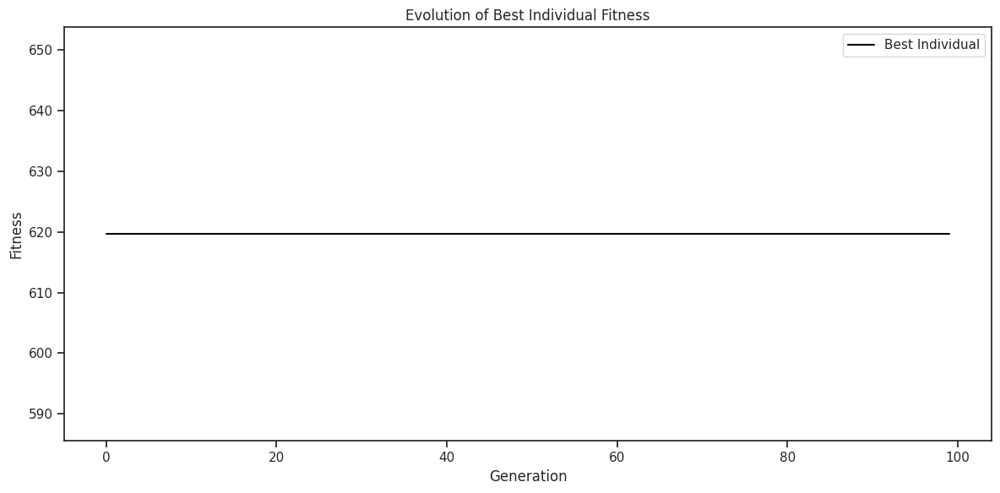

In [1620]:
def plot_best_individual_evolution_generations(best_individual_per_generation):
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals = best_individual_per_generation

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals, color='black', label='Best Individual')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_custom.best_individuals_fitness )

#### Población Inicial vs Optimizada

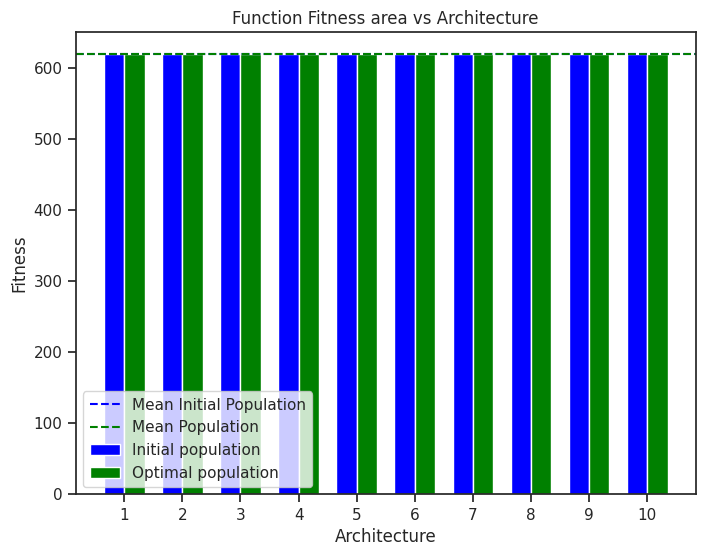

In [1621]:
bar_graph_population( GA_custom.initial_population_fitness, GA_custom.population_fitness, 'area' , True )

### Arquitectura Mesh

#### Población Inicial




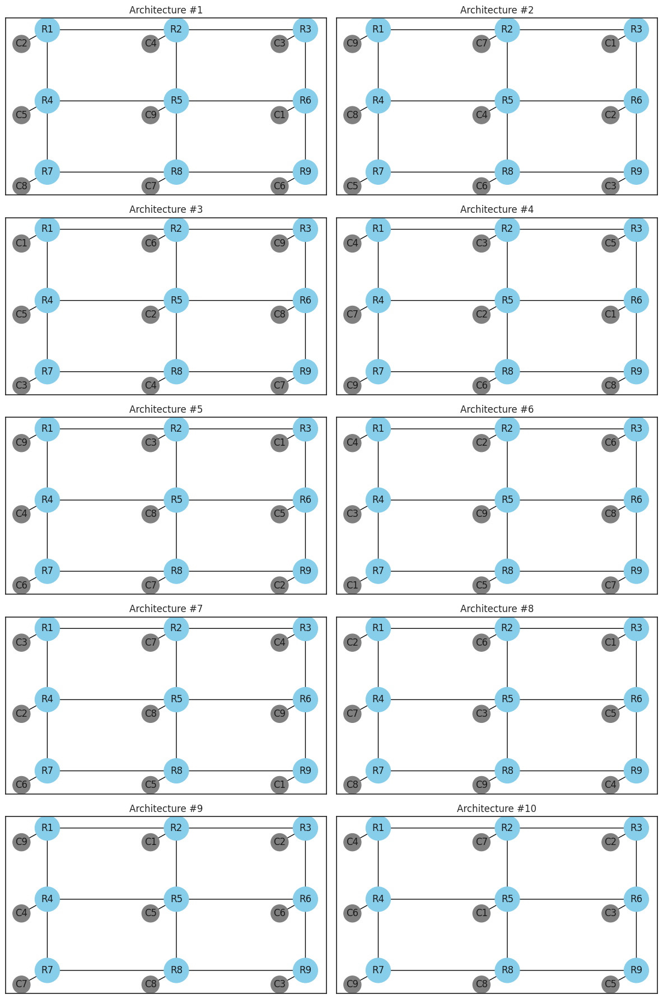

In [1622]:
plot_population( population_mesh )

#### Optimización

In [1623]:
GA_mesh = GeneticAlgorithm( population_mesh, 'area' )
GA_mesh.solve()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
Iteration: 9
Iteration: 10
Iteration: 11
Iteration: 12
Iteration: 13
Iteration: 14
Iteration: 15
Iteration: 16
Iteration: 17
Iteration: 18
Iteration: 19
Iteration: 20
Iteration: 21
Iteration: 22
Iteration: 23
Iteration: 24
Iteration: 25
Iteration: 26
Iteration: 27
Iteration: 28
Iteration: 29
Iteration: 30
Iteration: 31
Iteration: 32
Iteration: 33
Iteration: 34
Iteration: 35
Iteration: 36
Iteration: 37
Iteration: 38
Iteration: 39
Iteration: 40
Iteration: 41
Iteration: 42
Iteration: 43
Iteration: 44
Iteration: 45
Iteration: 46
Iteration: 47
Iteration: 48
Iteration: 49
Iteration: 50
Iteration: 51
Iteration: 52
Iteration: 53
Iteration: 54
Iteration: 55
Iteration: 56
Iteration: 57
Iteration: 58
Iteration: 59
Iteration: 60
Iteration: 61
Iteration: 62
Iteration: 63
Iteration: 64
Iteration: 65
Iteration: 66
Iteration: 67
Iteration: 68
Iteration: 69
Iteration: 70
Iteration: 71
It

#### Evolución Generaciones

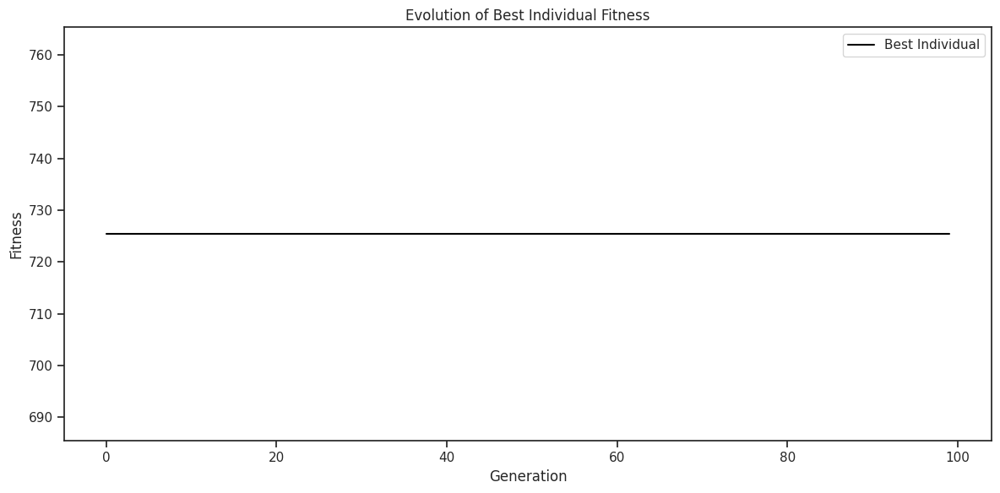

In [1624]:
def plot_best_individual_evolution_generations(best_individual_per_generation):
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals = best_individual_per_generation

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals, color='black', label='Best Individual')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_mesh.best_individuals_fitness )

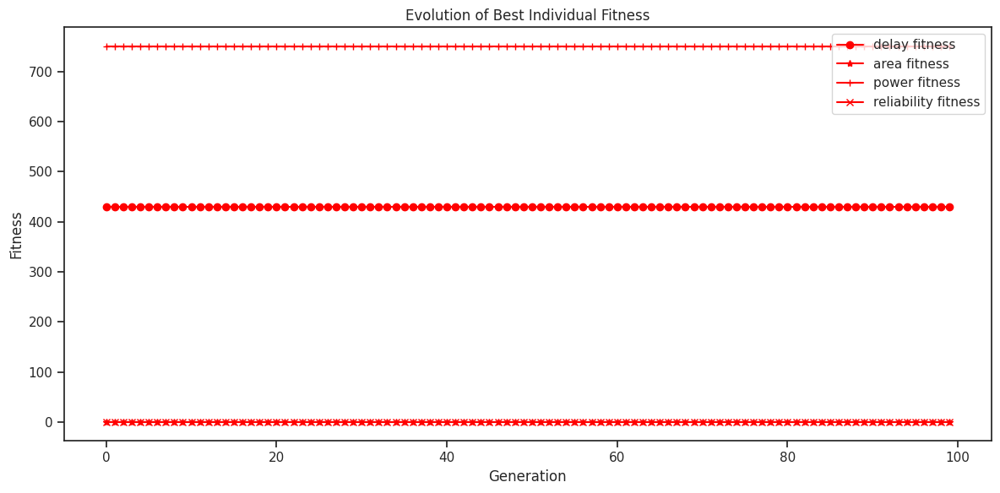

In [1625]:
def plot_best_individual_evolution_generations(  best_individual_per_generation ):
    from sklearn.preprocessing import MinMaxScaler
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals_delay       = []
    y_vals_area        = []
    y_vals_power       = []
    y_vals_reliability = []


    for individual in best_individual_per_generation:
      y_vals_delay.append( individual.fitness_delay )
      y_vals_area.append( individual.fitness_area )
      y_vals_power.append(individual.fitness_power )
      y_vals_reliability.append( individual.fitness_reliability )

    plt.figure(figsize=(12, 6))

    scaler = MinMaxScaler( feature_range=(0,1) )
    #y_vals_delay = scaler.fit_transform( np.array(y_vals_delay).reshape(-1,1) )
    y_vals_area = scaler.fit_transform( np.array(y_vals_area).reshape(-1,1) )
    #y_vals_power = scaler.fit_transform( np.array(y_vals_power).reshape(-1,1) )
    #y_vals_reliability = scaler.fit_transform( np.array(y_vals_reliability).reshape(-1,1) )

    plt.plot(x_vals, y_vals_delay,       color='red', marker='o', label='delay fitness')
    plt.plot(x_vals, y_vals_area,        color='red', marker='*', label='area fitness')
    plt.plot(x_vals, y_vals_power,       color='red', marker='+', label='power fitness')
    plt.plot(x_vals, y_vals_reliability, color='red', marker='x', label='reliability fitness')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_mesh.best_individuals )

#### Población Inicial vs Optimizada

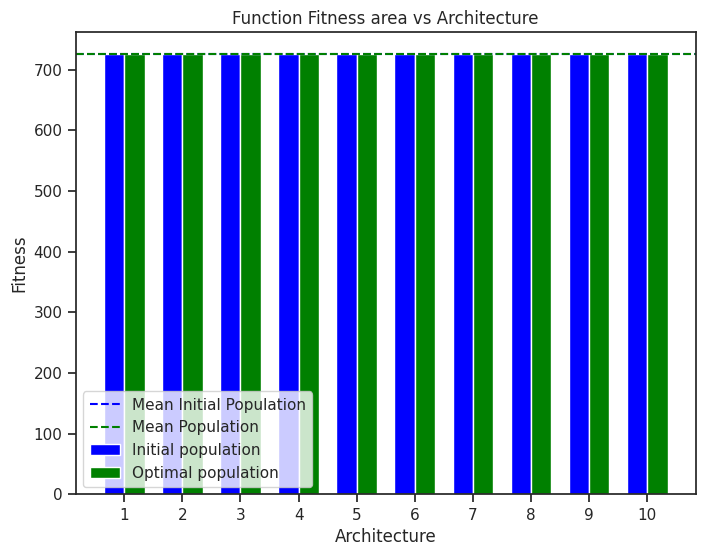

In [1626]:
bar_graph_population( GA_mesh.initial_population_fitness, GA_mesh.population_fitness, 'area' , True )

### Arquitectura Torus

#### Población Inicial

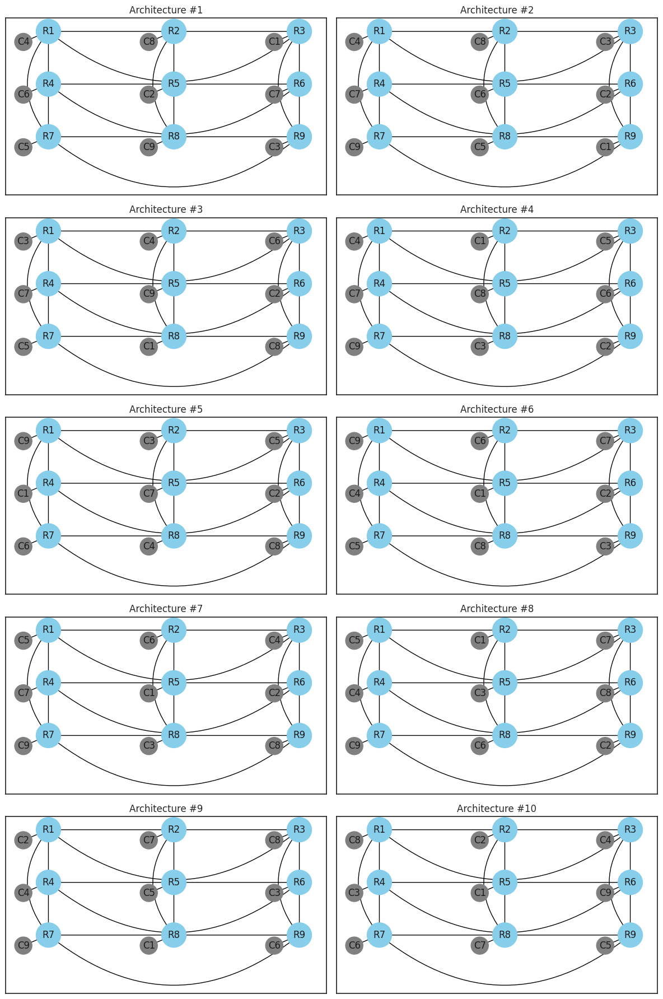

In [1627]:
plot_population( population_torus )

#### Optimización

In [1628]:
GA_torus = GeneticAlgorithm( population_torus, 'area' )
GA_torus.solve()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
Iteration: 9
Iteration: 10
Iteration: 11
Iteration: 12
Iteration: 13
Iteration: 14
Iteration: 15
Iteration: 16
Iteration: 17
Iteration: 18
Iteration: 19
Iteration: 20
Iteration: 21
Iteration: 22
Iteration: 23
Iteration: 24
Iteration: 25
Iteration: 26
Iteration: 27
Iteration: 28
Iteration: 29
Iteration: 30
Iteration: 31
Iteration: 32
Iteration: 33
Iteration: 34
Iteration: 35
Iteration: 36
Iteration: 37
Iteration: 38
Iteration: 39
Iteration: 40
Iteration: 41
Iteration: 42
Iteration: 43
Iteration: 44
Iteration: 45
Iteration: 46
Iteration: 47
Iteration: 48
Iteration: 49
Iteration: 50
Iteration: 51
Iteration: 52
Iteration: 53
Iteration: 54
Iteration: 55
Iteration: 56
Iteration: 57
Iteration: 58
Iteration: 59
Iteration: 60
Iteration: 61
Iteration: 62
Iteration: 63
Iteration: 64
Iteration: 65
Iteration: 66
Iteration: 67
Iteration: 68
Iteration: 69
Iteration: 70
Iteration: 71
It

#### Evolución Generaciones

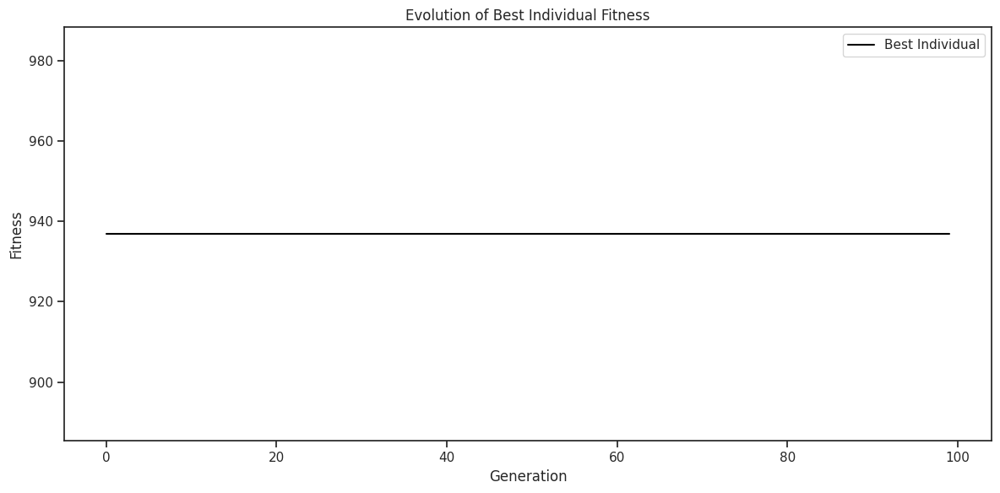

In [1629]:
def plot_best_individual_evolution_generations(best_individual_per_generation):
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals = best_individual_per_generation

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals, color='black', label='Best Individual')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_torus.best_individuals_fitness )

#### Población Inicial vs Optimizada

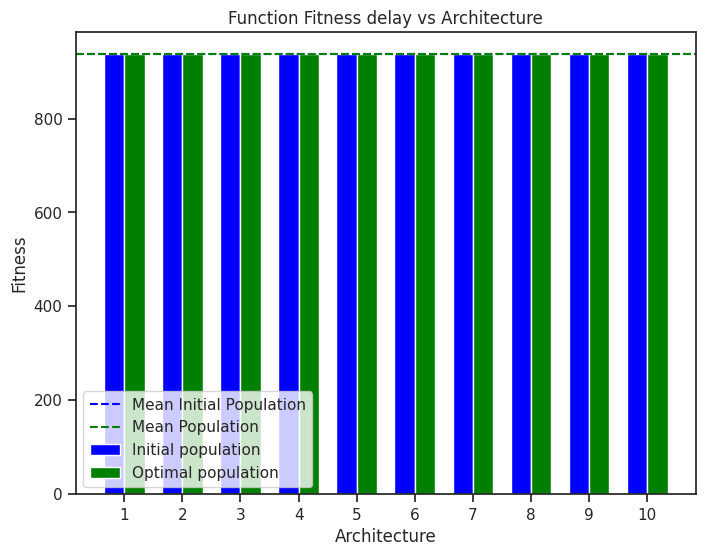

In [1630]:
bar_graph_population( GA_torus.initial_population_fitness, GA_torus.population_fitness, 'delay' , True )

### Arquitectura Ring

#### Población Inicial

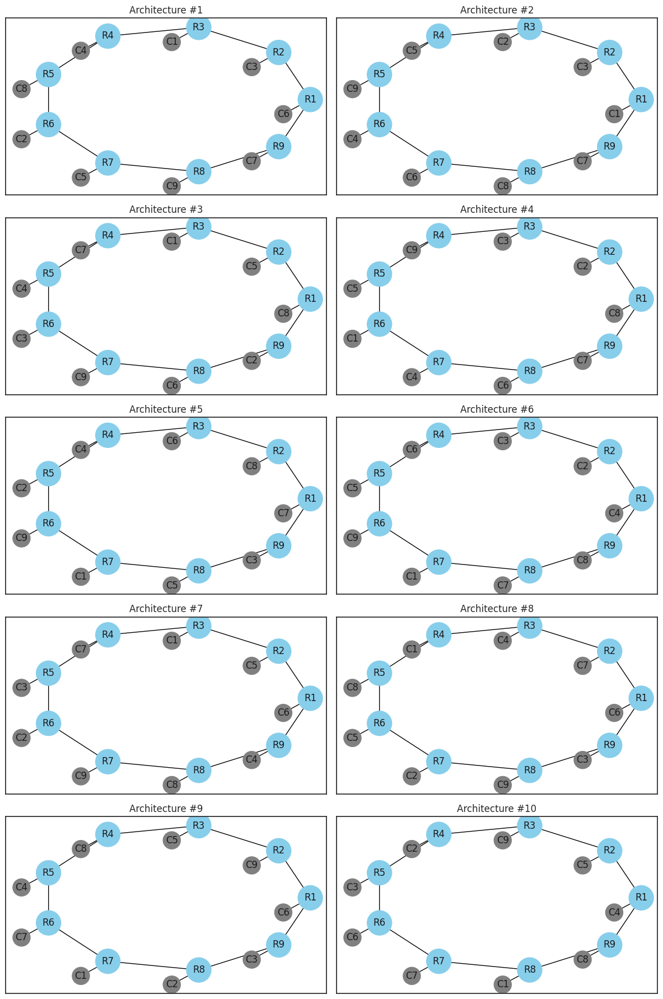

In [1631]:
plot_population( population_ring )

#### Optimización

In [1632]:
GA_ring = GeneticAlgorithm( population_ring, 'area' )
GA_ring.solve()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
Iteration: 9
Iteration: 10
Iteration: 11
Iteration: 12
Iteration: 13
Iteration: 14
Iteration: 15
Iteration: 16
Iteration: 17
Iteration: 18
Iteration: 19
Iteration: 20
Iteration: 21
Iteration: 22
Iteration: 23
Iteration: 24
Iteration: 25
Iteration: 26
Iteration: 27
Iteration: 28
Iteration: 29
Iteration: 30
Iteration: 31
Iteration: 32
Iteration: 33
Iteration: 34
Iteration: 35
Iteration: 36
Iteration: 37
Iteration: 38
Iteration: 39
Iteration: 40
Iteration: 41
Iteration: 42
Iteration: 43
Iteration: 44
Iteration: 45
Iteration: 46
Iteration: 47
Iteration: 48
Iteration: 49
Iteration: 50
Iteration: 51
Iteration: 52
Iteration: 53
Iteration: 54
Iteration: 55
Iteration: 56
Iteration: 57
Iteration: 58
Iteration: 59
Iteration: 60
Iteration: 61
Iteration: 62
Iteration: 63
Iteration: 64
Iteration: 65
Iteration: 66
Iteration: 67
Iteration: 68
Iteration: 69
Iteration: 70
Iteration: 71
It

#### Evolución Generaciones

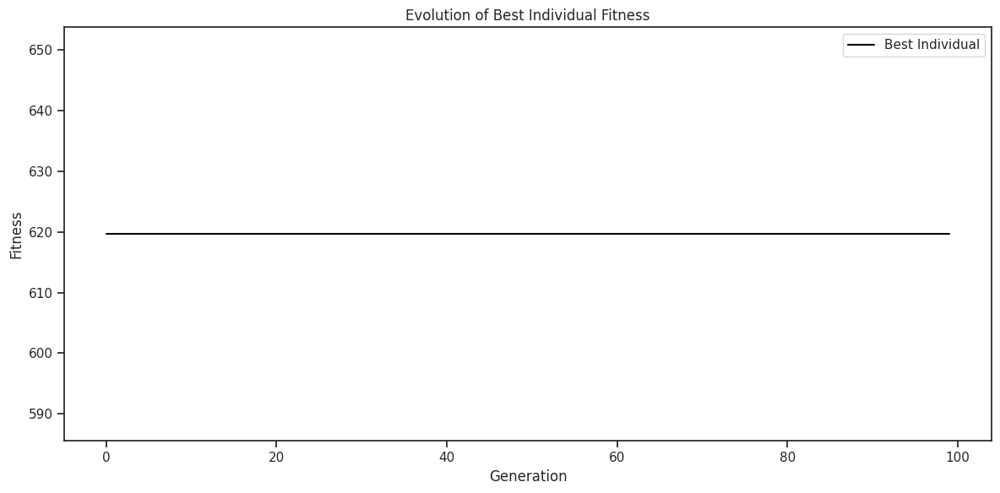

In [1633]:
def plot_best_individual_evolution_generations(best_individual_per_generation):
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals = best_individual_per_generation

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals, color='black', label='Best Individual')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_ring.best_individuals_fitness )

#### Población Inicial vs Optimizada

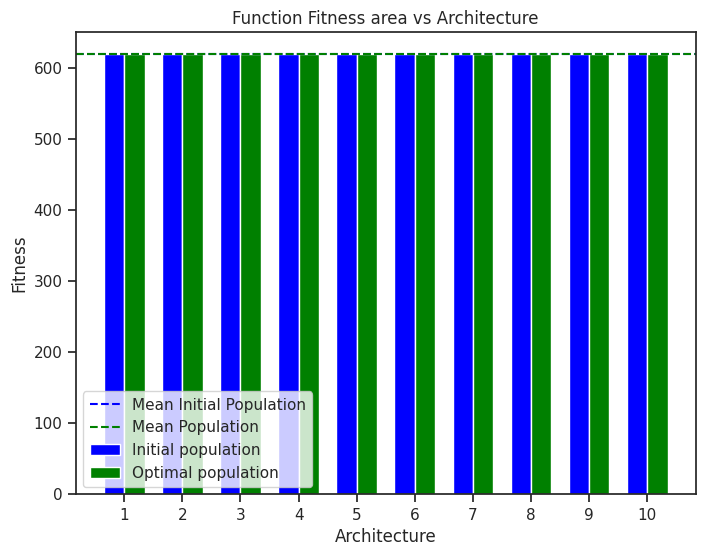

In [1634]:
bar_graph_population( GA_ring.initial_population_fitness, GA_ring.population_fitness, 'area' , True )

### Comparación Arquitecturas

##### Evolución Generaciones

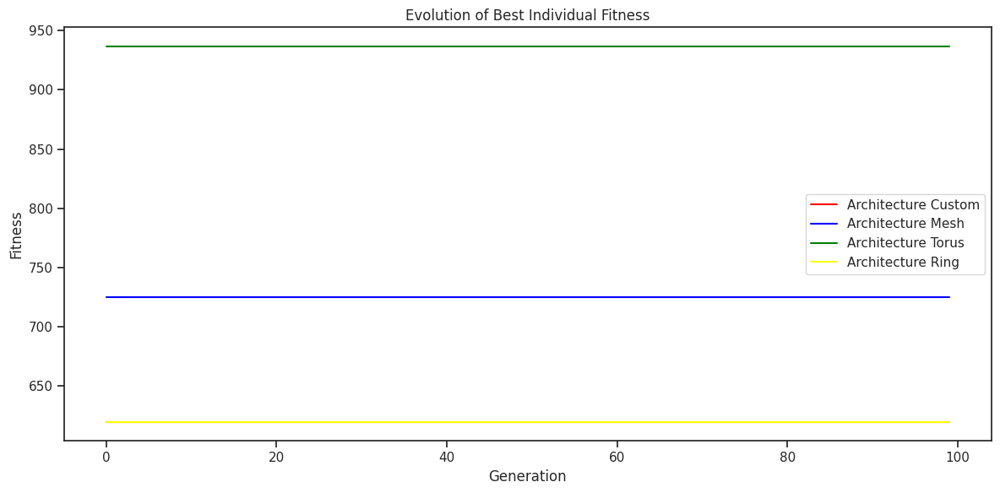

In [1635]:
def plot_best_individual_evolution_generations(best_individuals_custom, best_individuals_mesh, best_individuals_torus, best_individuals_ring):
    import seaborn as sns

    x_vals = np.arange(len(best_individuals_mesh))
    y_vals_custom = best_individuals_custom
    y_vals_mesh   = best_individuals_mesh
    y_vals_torus  = best_individuals_torus
    y_vals_ring   = best_individuals_ring

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals_custom, color='red',     label='Architecture Custom')
    plt.plot(x_vals, y_vals_mesh,   color='blue',    label='Architecture Mesh')
    plt.plot(x_vals, y_vals_torus,  color='green' ,  label='Architecture Torus' )
    plt.plot(x_vals, y_vals_ring,   color ='yellow', label='Architecture Ring' )


    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_custom.best_individuals_fitness, GA_mesh.best_individuals_fitness, GA_torus.best_individuals_fitness, GA_ring.best_individuals_fitness )

#### Comparación

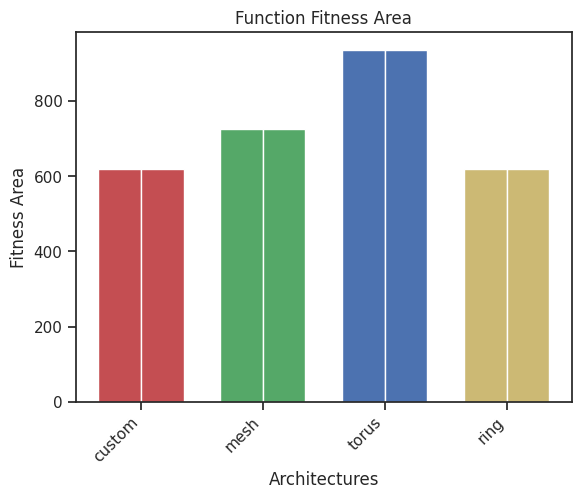

In [1636]:
def bar_graph_area_architectures( initial_architectures, optimized_architectures  ):
  import seaborn as sns
  sns.set()
  sns.set_style('ticks')

  architectures = ['custom', 'mesh', 'torus', 'ring']

  initial_architectures_area_network_topology = [architecture.metric_area.area_total for architecture in initial_architectures]
  initial_architectures_type_network_topology  = [architecture.topology_type for architecture in initial_architectures]

  optimized_architectures_area_network_topology = [architecture.metric_area.area_total for architecture in optimized_architectures]
  optimized_architectures_type_network_topology  = [architecture.topology_type for architecture in optimized_architectures]


  fig, ax = plt.subplots()

  width = 0.35  # Ancho de las barras
  offset = width / 2  # Espacio entre las barras

  ax.bar(np.arange(len(architectures)) - offset, initial_architectures_area_network_topology, width, color=['r','g','b','y','m','c','k'], label='Reliability Network Topology')
  ax.bar(np.arange(len(architectures)) + offset, optimized_architectures_area_network_topology, width, color=['r','g','b','y','m','c','k'], label='Reliability Minimum Edge Cut Set')


  labels = ax.get_xticklabels()
  plt.setp(labels, rotation = 45, horizontalalignment = 'right')

  plt.xlabel( 'Architectures' )
  plt.ylabel( 'Fitness Area' )
  plt.title( 'Function Fitness Area' )
  ax.set_xticks(range(len(population)))
  ax.set_xticklabels(architectures)
  #ax.legend()

  plt.show()

architectures = []
architectures.append( architecture_custom )
architectures.append( architecture_mesh )
architectures.append( architecture_torus )
architectures.append( architecture_ring )

initial_architectures = []
initial_architectures.append( GA_custom.best_individuals[0] )
initial_architectures.append( GA_mesh.best_individuals[0]  )
initial_architectures.append( GA_torus.best_individuals[0]  )
initial_architectures.append( GA_ring.best_individuals[0]  )

optimized_architectures = []
optimized_architectures.append( GA_custom.best_individuals[-1] )
optimized_architectures .append( GA_mesh.best_individuals[-1]  )
optimized_architectures .append( GA_torus.best_individuals[-1]  )
optimized_architectures .append( GA_ring.best_individuals[-1]  )

bar_graph_area_architectures( initial_architectures, optimized_architectures  )

## Consumo

### Arquitectura Custom

#### Población Inicial




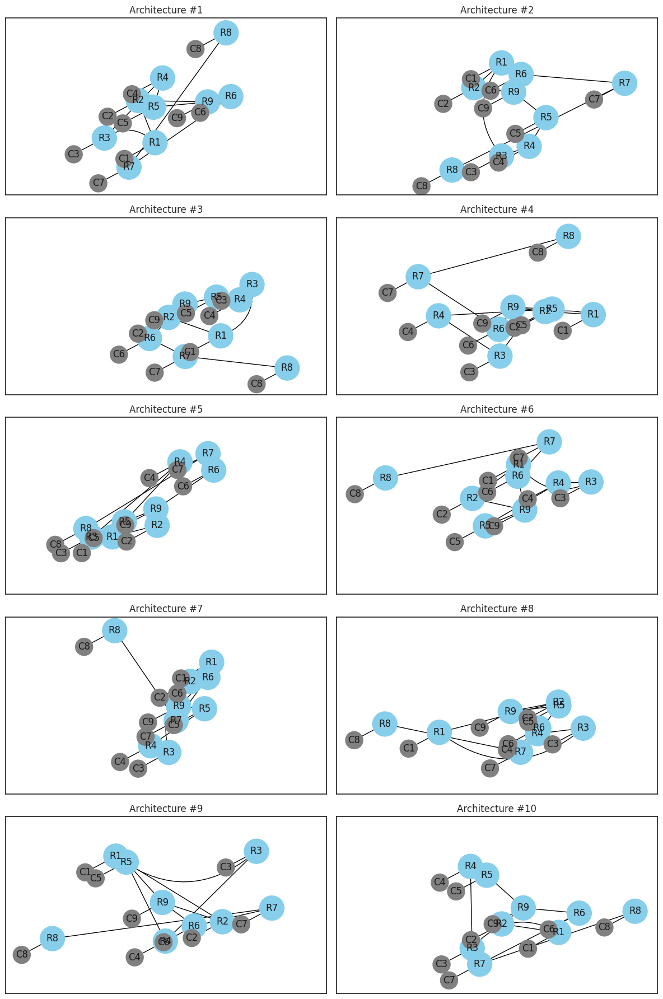

In [1637]:
plot_population( population_custom )

#### Optimización

In [1638]:
GA_custom = GeneticAlgorithm( population_custom, 'power' )
GA_custom.solve()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
Iteration: 9
Iteration: 10
Iteration: 11
Iteration: 12
Iteration: 13
Iteration: 14
Iteration: 15
Iteration: 16
Iteration: 17
Iteration: 18
Iteration: 19
Iteration: 20
Iteration: 21
Iteration: 22
Iteration: 23
Iteration: 24
Iteration: 25
Iteration: 26
Iteration: 27
Iteration: 28
Iteration: 29
Iteration: 30
Iteration: 31
Iteration: 32
Iteration: 33
Iteration: 34
Iteration: 35
Iteration: 36
Iteration: 37
Iteration: 38
Iteration: 39
Iteration: 40
Iteration: 41
Iteration: 42
Iteration: 43
Iteration: 44
Iteration: 45
Iteration: 46
Iteration: 47
Iteration: 48
Iteration: 49
Iteration: 50
Iteration: 51
Iteration: 52
Iteration: 53
Iteration: 54
Iteration: 55
Iteration: 56
Iteration: 57
Iteration: 58
Iteration: 59
Iteration: 60
Iteration: 61
Iteration: 62
Iteration: 63
Iteration: 64
Iteration: 65
Iteration: 66
Iteration: 67
Iteration: 68
Iteration: 69
Iteration: 70
Iteration: 71
It

#### Evolución Generaciones

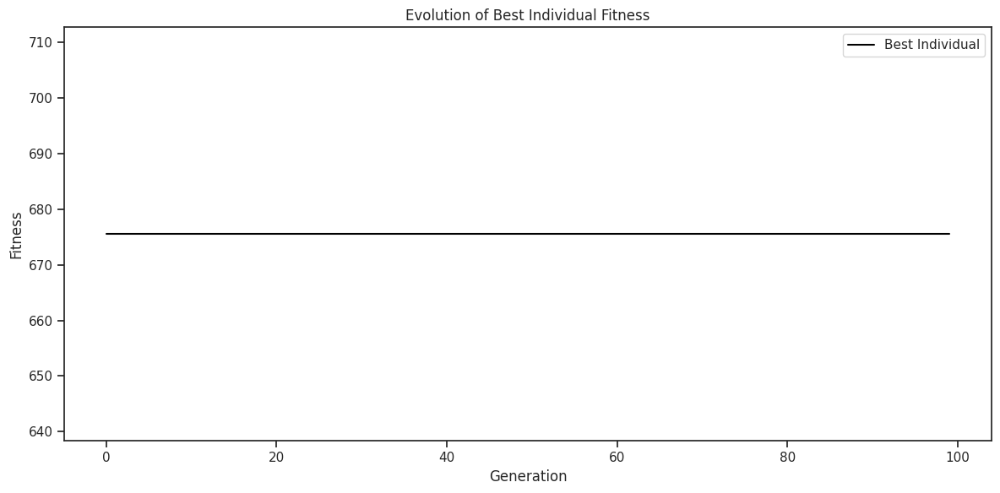

In [1639]:
def plot_best_individual_evolution_generations(best_individual_per_generation):
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals = best_individual_per_generation

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals, color='black', label='Best Individual')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_custom.best_individuals_fitness )

#### Población Inicial vs Optimizada

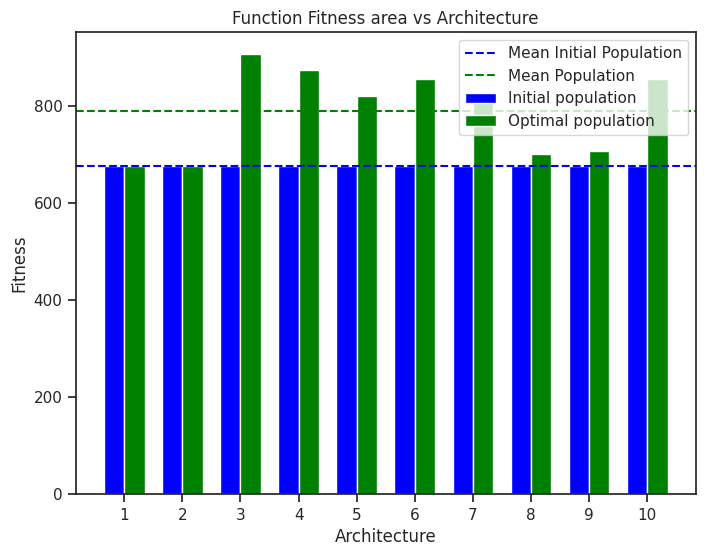

In [1640]:
bar_graph_population( GA_custom.initial_population_fitness, GA_custom.population_fitness, 'area' , True )

### Arquitectura Mesh

#### Población Inicial




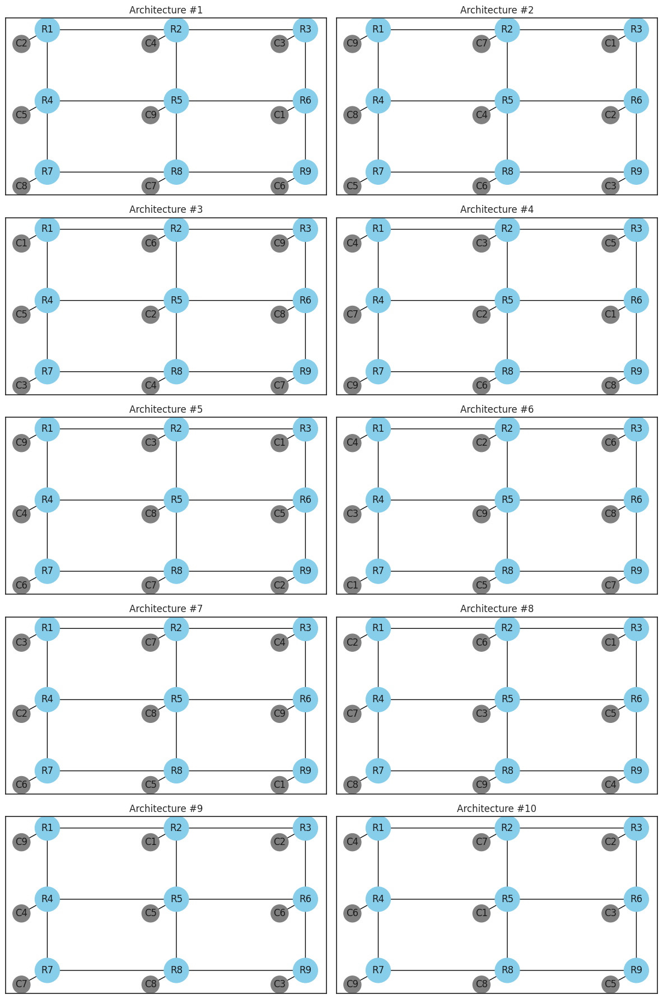

In [1641]:
plot_population( population_mesh )

#### Optimización

In [1642]:
GA_mesh = GeneticAlgorithm( population_mesh, 'power' )
GA_mesh.solve()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
Iteration: 9
Iteration: 10
Iteration: 11
Iteration: 12
Iteration: 13
Iteration: 14
Iteration: 15
Iteration: 16
Iteration: 17
Iteration: 18
Iteration: 19
Iteration: 20
Iteration: 21
Iteration: 22
Iteration: 23
Iteration: 24
Iteration: 25
Iteration: 26
Iteration: 27
Iteration: 28
Iteration: 29
Iteration: 30
Iteration: 31
Iteration: 32
Iteration: 33
Iteration: 34
Iteration: 35
Iteration: 36
Iteration: 37
Iteration: 38
Iteration: 39
Iteration: 40
Iteration: 41
Iteration: 42
Iteration: 43
Iteration: 44
Iteration: 45
Iteration: 46
Iteration: 47
Iteration: 48
Iteration: 49
Iteration: 50
Iteration: 51
Iteration: 52
Iteration: 53
Iteration: 54
Iteration: 55
Iteration: 56
Iteration: 57
Iteration: 58
Iteration: 59
Iteration: 60
Iteration: 61
Iteration: 62
Iteration: 63
Iteration: 64
Iteration: 65
Iteration: 66
Iteration: 67
Iteration: 68
Iteration: 69
Iteration: 70
Iteration: 71
It

#### Evolución Generaciones

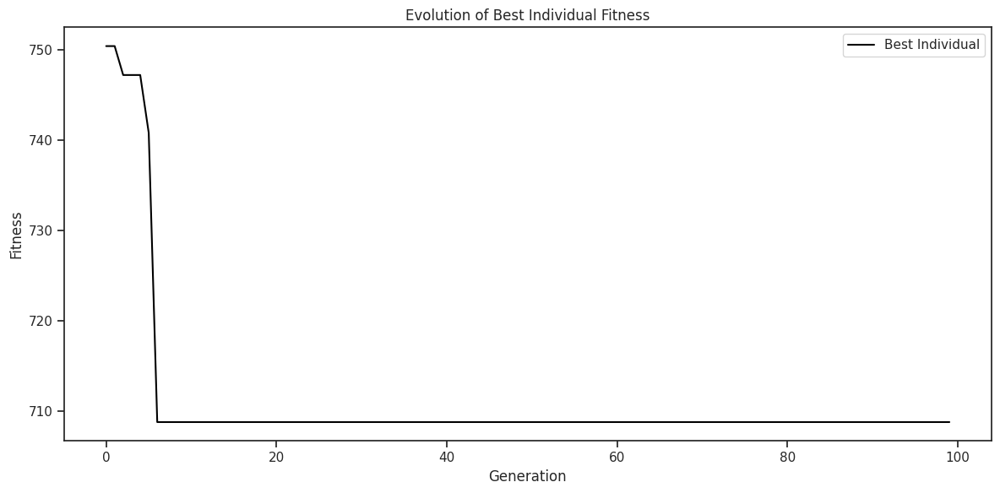

In [1643]:
def plot_best_individual_evolution_generations(best_individual_per_generation):
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals = best_individual_per_generation

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals, color='black', label='Best Individual')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_mesh.best_individuals_fitness )

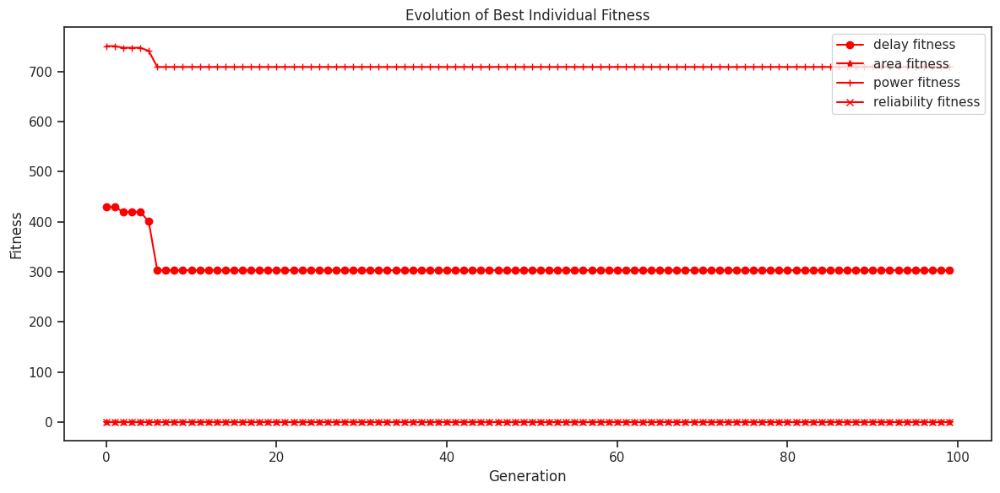

In [1644]:
def plot_best_individual_evolution_generations(  best_individual_per_generation ):
    from sklearn.preprocessing import MinMaxScaler
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals_delay       = []
    y_vals_area        = []
    y_vals_power       = []
    y_vals_reliability = []


    for individual in best_individual_per_generation:
      y_vals_delay.append( individual.fitness_delay )
      y_vals_area.append( individual.fitness_area )
      y_vals_power.append(individual.fitness_power )
      y_vals_reliability.append( individual.fitness_reliability )

    plt.figure(figsize=(12, 6))

    scaler = MinMaxScaler( feature_range=(0,1) )
    #y_vals_delay = scaler.fit_transform( np.array(y_vals_delay).reshape(-1,1) )
    y_vals_area = scaler.fit_transform( np.array(y_vals_area).reshape(-1,1) )
    #y_vals_power = scaler.fit_transform( np.array(y_vals_power).reshape(-1,1) )
    #y_vals_reliability = scaler.fit_transform( np.array(y_vals_reliability).reshape(-1,1) )

    plt.plot(x_vals, y_vals_delay,       color='red', marker='o', label='delay fitness')
    plt.plot(x_vals, y_vals_area,        color='red', marker='*', label='area fitness')
    plt.plot(x_vals, y_vals_power,       color='red', marker='+', label='power fitness')
    plt.plot(x_vals, y_vals_reliability, color='red', marker='x', label='reliability fitness')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_mesh.best_individuals )

#### Población Inicial vs Optimizada

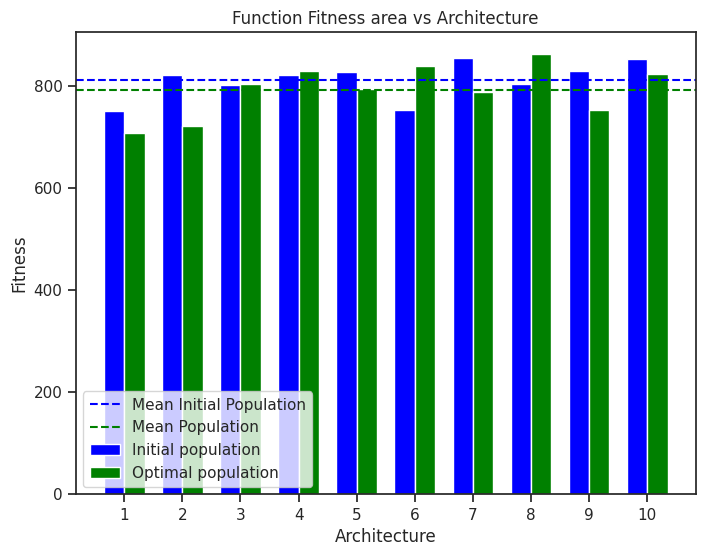

In [1645]:
bar_graph_population( GA_mesh.initial_population_fitness, GA_mesh.population_fitness, 'area' , True )

### Arquitectura Torus

#### Población Inicial

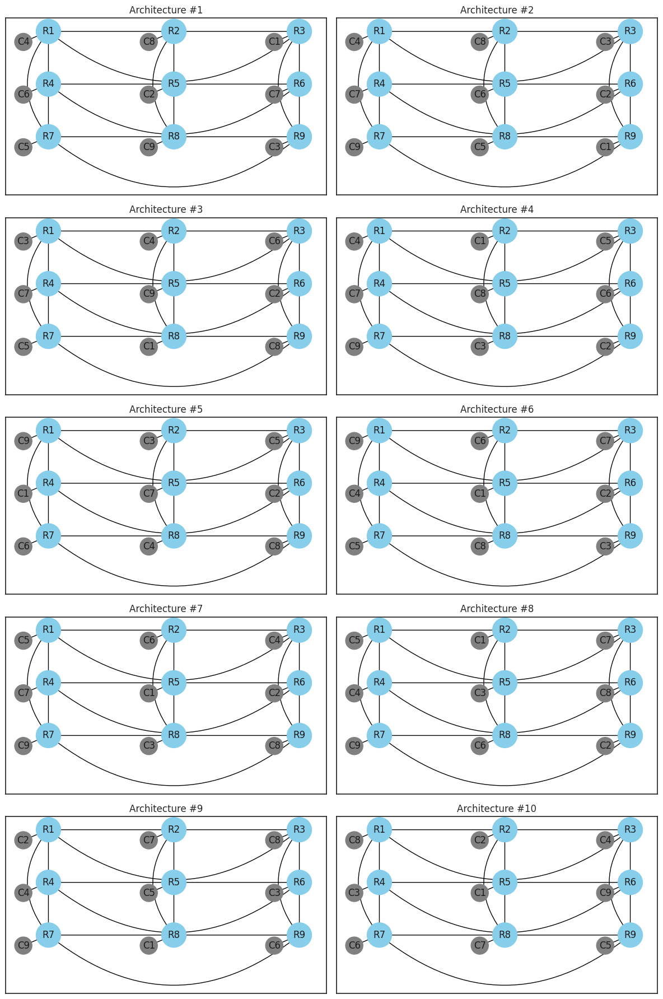

In [1646]:
plot_population( population_torus )

#### Optimización

In [1647]:
GA_torus = GeneticAlgorithm( population_torus, 'power' )
GA_torus.solve()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
Iteration: 9
Iteration: 10
Iteration: 11
Iteration: 12
Iteration: 13
Iteration: 14
Iteration: 15
Iteration: 16
Iteration: 17
Iteration: 18
Iteration: 19
Iteration: 20
Iteration: 21
Iteration: 22
Iteration: 23
Iteration: 24
Iteration: 25
Iteration: 26
Iteration: 27
Iteration: 28
Iteration: 29
Iteration: 30
Iteration: 31
Iteration: 32
Iteration: 33
Iteration: 34
Iteration: 35
Iteration: 36
Iteration: 37
Iteration: 38
Iteration: 39
Iteration: 40
Iteration: 41
Iteration: 42
Iteration: 43
Iteration: 44
Iteration: 45
Iteration: 46
Iteration: 47
Iteration: 48
Iteration: 49
Iteration: 50
Iteration: 51
Iteration: 52
Iteration: 53
Iteration: 54
Iteration: 55
Iteration: 56
Iteration: 57
Iteration: 58
Iteration: 59
Iteration: 60
Iteration: 61
Iteration: 62
Iteration: 63
Iteration: 64
Iteration: 65
Iteration: 66
Iteration: 67
Iteration: 68
Iteration: 69
Iteration: 70
Iteration: 71
It

#### Evolución Generaciones

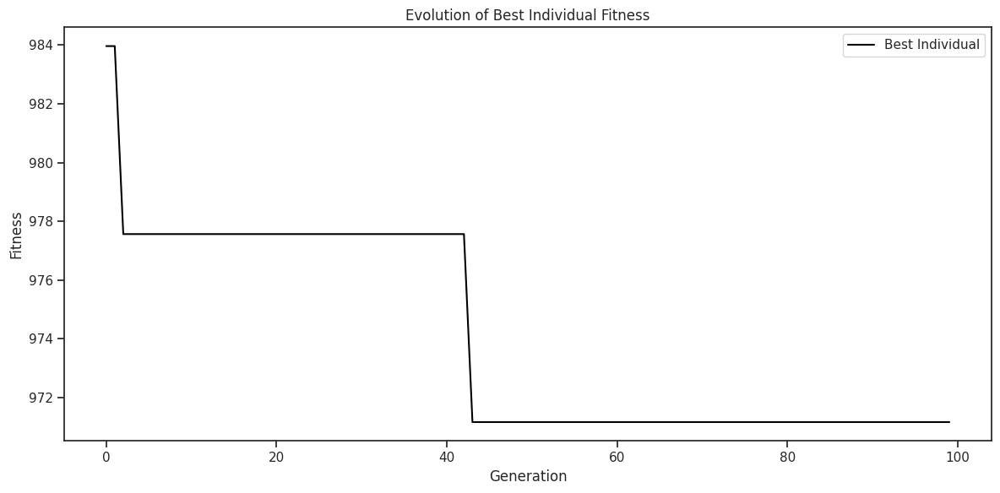

In [1648]:
def plot_best_individual_evolution_generations(best_individual_per_generation):
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals = best_individual_per_generation

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals, color='black', label='Best Individual')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_torus.best_individuals_fitness )

#### Población Inicial vs Optimizada

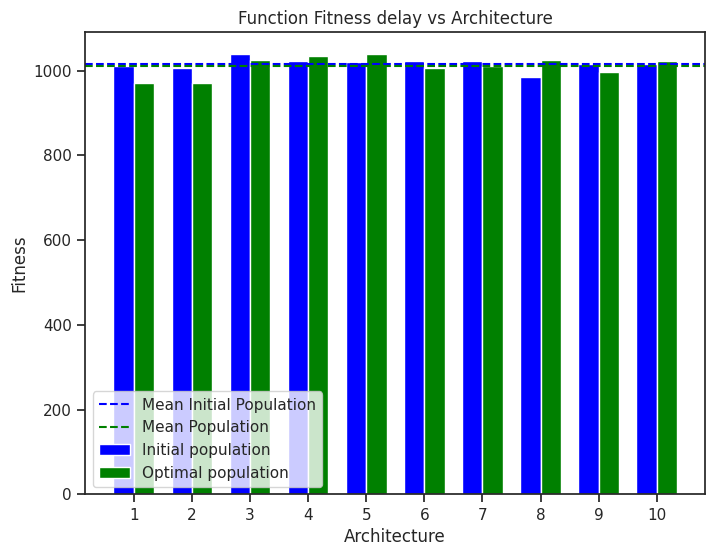

In [1649]:
bar_graph_population( GA_torus.initial_population_fitness, GA_torus.population_fitness, 'delay' , True )

### Arquitectura Ring

#### Población Inicial

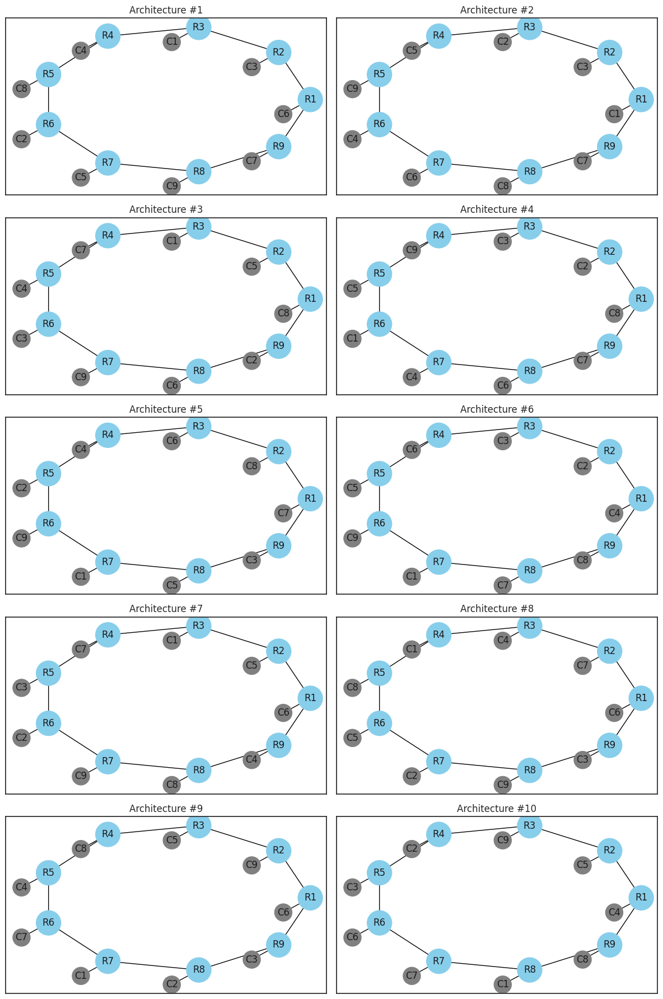

In [1650]:
plot_population( population_ring )

#### Optimización

In [1651]:
GA_ring = GeneticAlgorithm( population_ring, 'power' )
GA_ring.solve()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
Iteration: 9
Iteration: 10
Iteration: 11
Iteration: 12
Iteration: 13
Iteration: 14
Iteration: 15
Iteration: 16
Iteration: 17
Iteration: 18
Iteration: 19
Iteration: 20
Iteration: 21
Iteration: 22
Iteration: 23
Iteration: 24
Iteration: 25
Iteration: 26
Iteration: 27
Iteration: 28
Iteration: 29
Iteration: 30
Iteration: 31
Iteration: 32
Iteration: 33
Iteration: 34
Iteration: 35
Iteration: 36
Iteration: 37
Iteration: 38
Iteration: 39
Iteration: 40
Iteration: 41
Iteration: 42
Iteration: 43
Iteration: 44
Iteration: 45
Iteration: 46
Iteration: 47
Iteration: 48
Iteration: 49
Iteration: 50
Iteration: 51
Iteration: 52
Iteration: 53
Iteration: 54
Iteration: 55
Iteration: 56
Iteration: 57
Iteration: 58
Iteration: 59
Iteration: 60
Iteration: 61
Iteration: 62
Iteration: 63
Iteration: 64
Iteration: 65
Iteration: 66
Iteration: 67
Iteration: 68
Iteration: 69
Iteration: 70
Iteration: 71
It

#### Evolución Generaciones

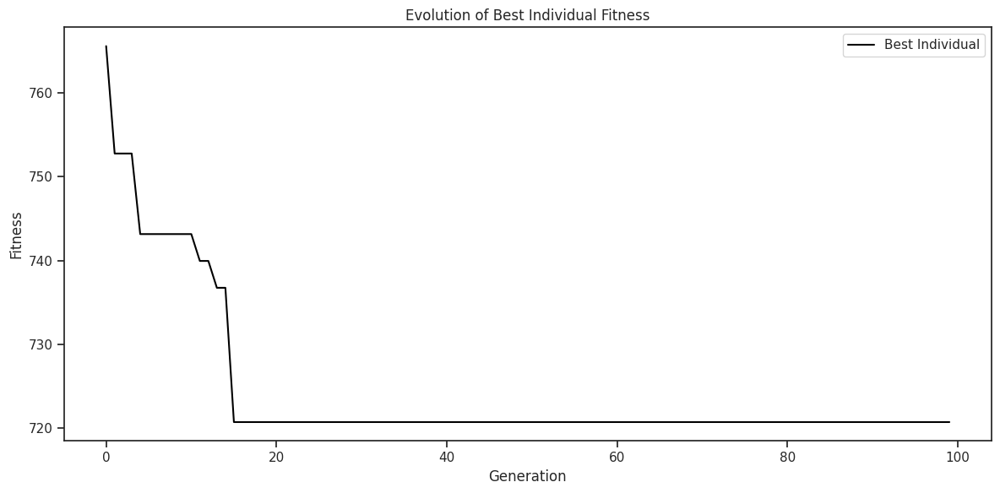

In [1652]:
def plot_best_individual_evolution_generations(best_individual_per_generation):
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals = best_individual_per_generation

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals, color='black', label='Best Individual')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_ring.best_individuals_fitness )

#### Población Inicial vs Optimizada

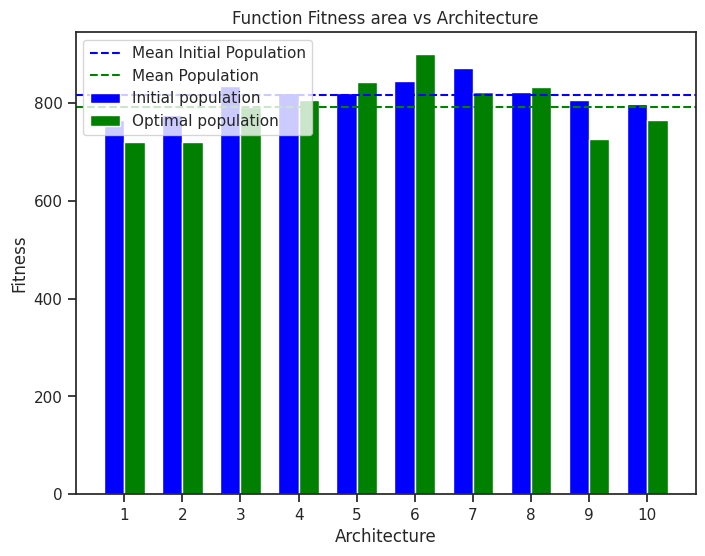

In [1653]:
bar_graph_population( GA_ring.initial_population_fitness, GA_ring.population_fitness, 'area' , True )

### Comparación Arquitecturas

##### Evolución Generaciones

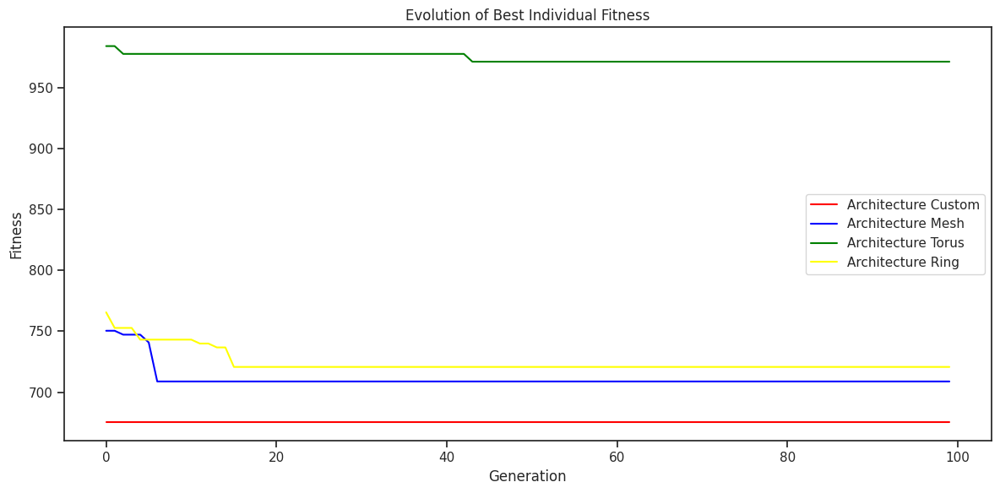

In [1654]:
def plot_best_individual_evolution_generations(best_individuals_custom, best_individuals_mesh, best_individuals_torus, best_individuals_ring):
    import seaborn as sns

    x_vals = np.arange(len(best_individuals_mesh))
    y_vals_custom = best_individuals_custom
    y_vals_mesh   = best_individuals_mesh
    y_vals_torus  = best_individuals_torus
    y_vals_ring   = best_individuals_ring

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals_custom, color='red',     label='Architecture Custom')
    plt.plot(x_vals, y_vals_mesh,   color='blue',    label='Architecture Mesh')
    plt.plot(x_vals, y_vals_torus,  color='green' ,  label='Architecture Torus' )
    plt.plot(x_vals, y_vals_ring,   color ='yellow', label='Architecture Ring' )


    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_custom.best_individuals_fitness, GA_mesh.best_individuals_fitness, GA_torus.best_individuals_fitness, GA_ring.best_individuals_fitness )

#### Comparación

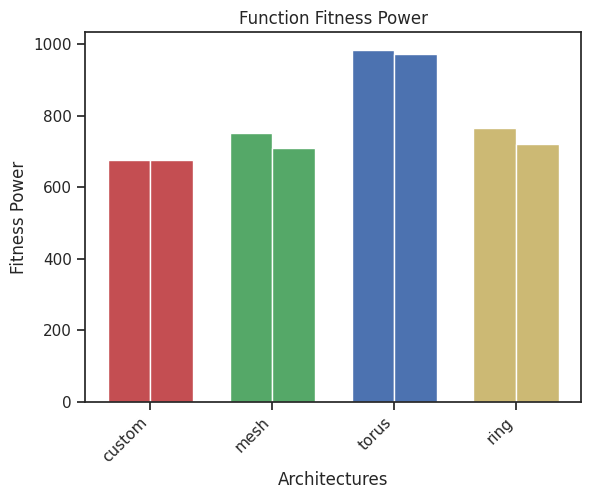

In [1655]:
def bar_graph_power_architectures( initial_architectures, optimized_architectures  ):
  import seaborn as sns
  sns.set()
  sns.set_style('ticks')

  architectures = ['custom', 'mesh', 'torus', 'ring']

  initial_architectures_power_network_topology = [architecture.metric_power.power_total for architecture in initial_architectures]
  initial_architectures_type_network_topology  = [architecture.topology_type for architecture in initial_architectures]

  optimized_architectures_power_network_topology = [architecture.metric_power.power_total for architecture in optimized_architectures]
  optimized_architectures_type_network_topology  = [architecture.topology_type for architecture in optimized_architectures]


  fig, ax = plt.subplots()

  width = 0.35  # Ancho de las barras
  offset = width / 2  # Espacio entre las barras

  ax.bar(np.arange(len(architectures)) - offset, initial_architectures_power_network_topology, width, color=['r','g','b','y','m','c','k'], label='Reliability Network Topology')
  ax.bar(np.arange(len(architectures)) + offset, optimized_architectures_power_network_topology, width, color=['r','g','b','y','m','c','k'], label='Reliability Minimum Edge Cut Set')


  labels = ax.get_xticklabels()
  plt.setp(labels, rotation = 45, horizontalalignment = 'right')

  plt.xlabel( 'Architectures' )
  plt.ylabel( 'Fitness Power' )
  plt.title( 'Function Fitness Power' )
  ax.set_xticks(range(len(population)))
  ax.set_xticklabels(architectures)
  #ax.legend()

  plt.show()

architectures = []
architectures.append( architecture_custom )
architectures.append( architecture_mesh )
architectures.append( architecture_torus )
architectures.append( architecture_ring )

initial_architectures = []
initial_architectures.append( GA_custom.best_individuals[0] )
initial_architectures.append( GA_mesh.best_individuals[0]  )
initial_architectures.append( GA_torus.best_individuals[0]  )
initial_architectures.append( GA_ring.best_individuals[0]  )

optimized_architectures = []
optimized_architectures.append( GA_custom.best_individuals[-1] )
optimized_architectures .append( GA_mesh.best_individuals[-1]  )
optimized_architectures .append( GA_torus.best_individuals[-1]  )
optimized_architectures .append( GA_ring.best_individuals[-1]  )

bar_graph_power_architectures( initial_architectures, optimized_architectures  )

## Confiabilidad

### Arquitectura Custom

#### Población Inicial




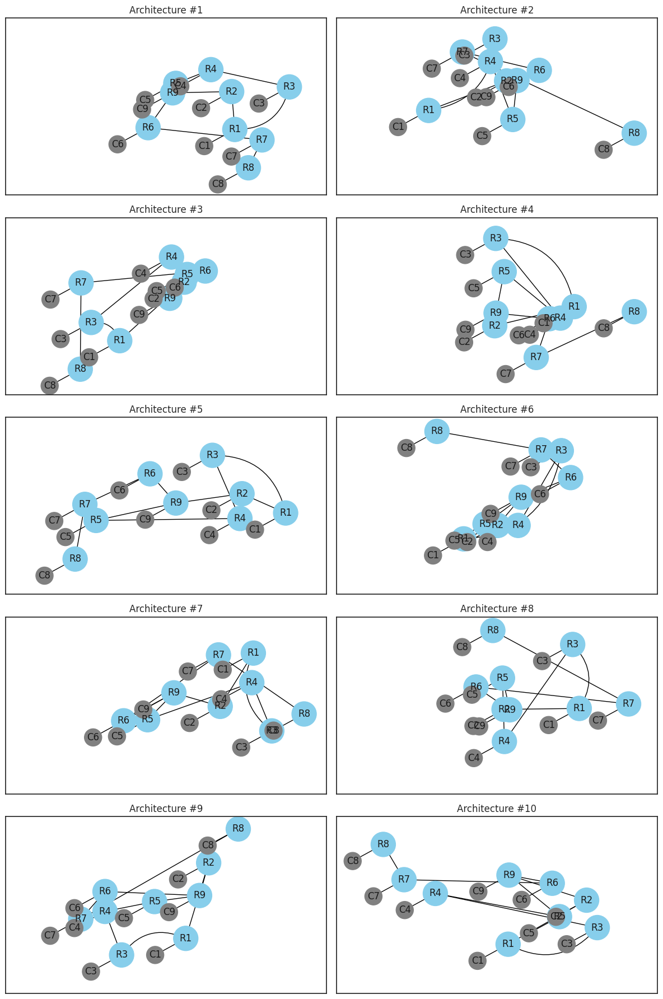

In [1656]:
plot_population( population_custom )

#### Optimización

In [1657]:
GA_custom = GeneticAlgorithm( population_custom, 'reliability' )
GA_custom.solve()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
Iteration: 9
Iteration: 10
Iteration: 11
Iteration: 12
Iteration: 13
Iteration: 14
Iteration: 15
Iteration: 16
Iteration: 17
Iteration: 18
Iteration: 19
Iteration: 20
Iteration: 21
Iteration: 22
Iteration: 23
Iteration: 24
Iteration: 25
Iteration: 26
Iteration: 27
Iteration: 28
Iteration: 29
Iteration: 30
Iteration: 31
Iteration: 32
Iteration: 33
Iteration: 34
Iteration: 35
Iteration: 36
Iteration: 37
Iteration: 38
Iteration: 39
Iteration: 40
Iteration: 41
Iteration: 42
Iteration: 43
Iteration: 44
Iteration: 45
Iteration: 46
Iteration: 47
Iteration: 48
Iteration: 49
Iteration: 50
Iteration: 51
Iteration: 52
Iteration: 53
Iteration: 54
Iteration: 55
Iteration: 56
Iteration: 57
Iteration: 58
Iteration: 59
Iteration: 60
Iteration: 61
Iteration: 62
Iteration: 63
Iteration: 64
Iteration: 65
Iteration: 66
Iteration: 67
Iteration: 68
Iteration: 69
Iteration: 70
Iteration: 71
It

#### Evolución Generaciones

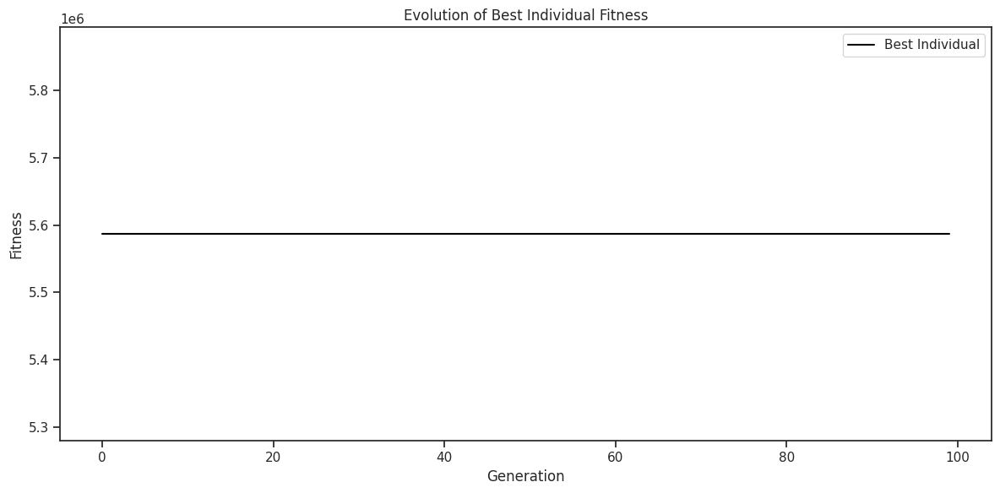

In [1658]:
def plot_best_individual_evolution_generations(best_individual_per_generation):
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals = best_individual_per_generation

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals, color='black', label='Best Individual')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_custom.best_individuals_fitness )

#### Población Inicial vs Optimizada

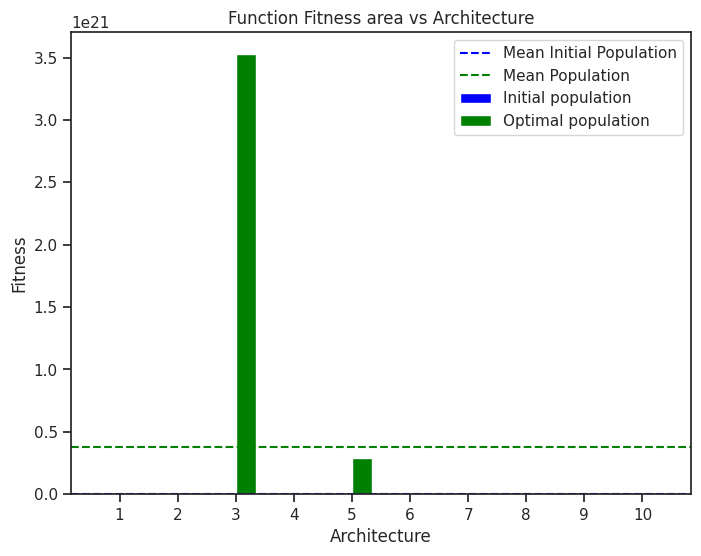

In [1659]:
bar_graph_population( GA_custom.initial_population_fitness, GA_custom.population_fitness, 'area' , True )

### Arquitectura Mesh

#### Población Inicial




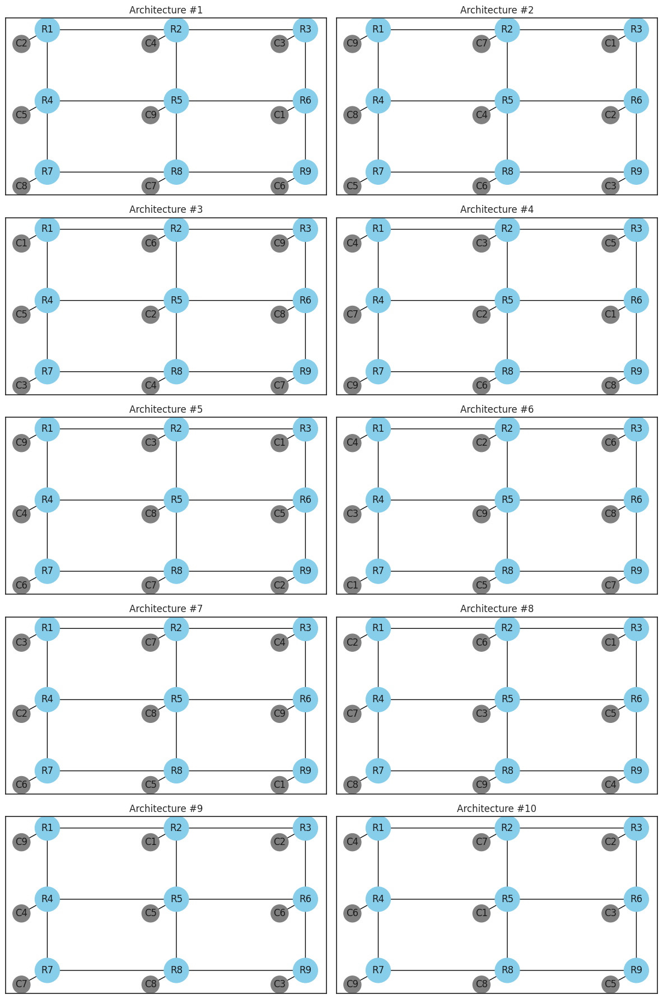

In [1660]:
plot_population( population_mesh )

#### Optimización

In [1661]:
GA_mesh = GeneticAlgorithm( population_mesh, 'reliability' )
GA_mesh.solve()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
Iteration: 9
Iteration: 10
Iteration: 11
Iteration: 12
Iteration: 13
Iteration: 14
Iteration: 15
Iteration: 16
Iteration: 17
Iteration: 18
Iteration: 19
Iteration: 20
Iteration: 21
Iteration: 22
Iteration: 23
Iteration: 24
Iteration: 25
Iteration: 26
Iteration: 27
Iteration: 28
Iteration: 29
Iteration: 30
Iteration: 31
Iteration: 32
Iteration: 33
Iteration: 34
Iteration: 35
Iteration: 36
Iteration: 37
Iteration: 38
Iteration: 39
Iteration: 40
Iteration: 41
Iteration: 42
Iteration: 43
Iteration: 44
Iteration: 45
Iteration: 46
Iteration: 47
Iteration: 48
Iteration: 49
Iteration: 50
Iteration: 51
Iteration: 52
Iteration: 53
Iteration: 54
Iteration: 55
Iteration: 56
Iteration: 57
Iteration: 58
Iteration: 59
Iteration: 60
Iteration: 61
Iteration: 62
Iteration: 63
Iteration: 64
Iteration: 65
Iteration: 66
Iteration: 67
Iteration: 68
Iteration: 69
Iteration: 70
Iteration: 71
It

#### Evolución Generaciones

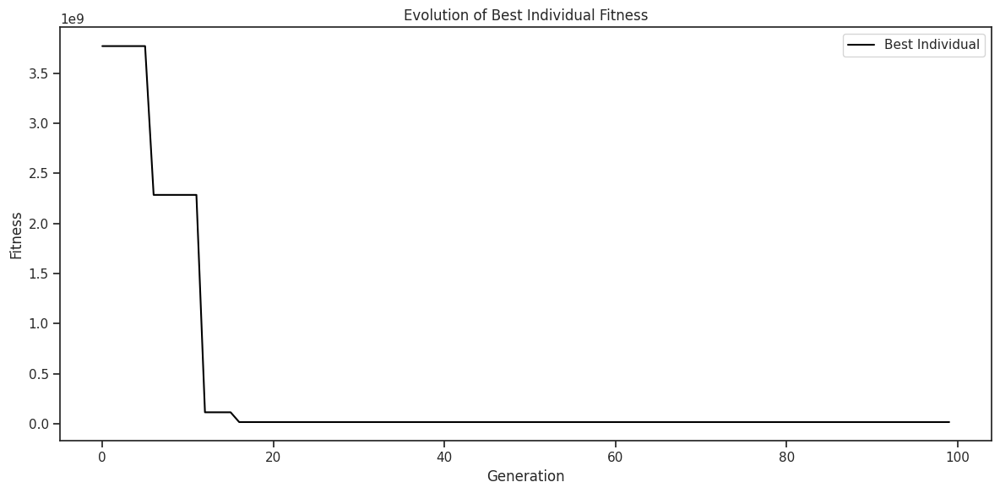

In [1662]:
def plot_best_individual_evolution_generations(best_individual_per_generation):
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals = best_individual_per_generation

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals, color='black', label='Best Individual')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_mesh.best_individuals_fitness )

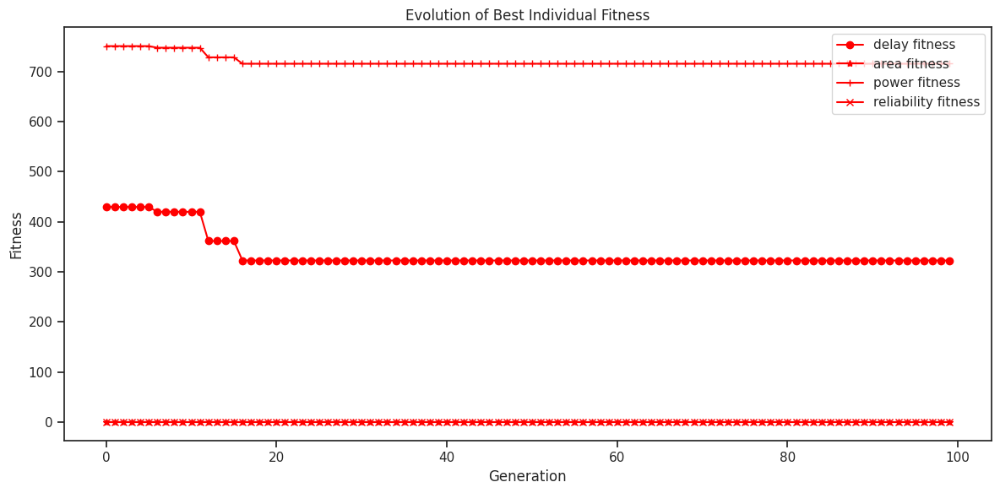

In [1663]:
def plot_best_individual_evolution_generations(  best_individual_per_generation ):
    from sklearn.preprocessing import MinMaxScaler
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals_delay       = []
    y_vals_area        = []
    y_vals_power       = []
    y_vals_reliability = []


    for individual in best_individual_per_generation:
      y_vals_delay.append( individual.fitness_delay )
      y_vals_area.append( individual.fitness_area )
      y_vals_power.append(individual.fitness_power )
      y_vals_reliability.append( individual.fitness_reliability )

    plt.figure(figsize=(12, 6))

    scaler = MinMaxScaler( feature_range=(0,1) )
    #y_vals_delay = scaler.fit_transform( np.array(y_vals_delay).reshape(-1,1) )
    y_vals_area = scaler.fit_transform( np.array(y_vals_area).reshape(-1,1) )
    #y_vals_power = scaler.fit_transform( np.array(y_vals_power).reshape(-1,1) )
    #y_vals_reliability = scaler.fit_transform( np.array(y_vals_reliability).reshape(-1,1) )

    plt.plot(x_vals, y_vals_delay,       color='red', marker='o', label='delay fitness')
    plt.plot(x_vals, y_vals_area,        color='red', marker='*', label='area fitness')
    plt.plot(x_vals, y_vals_power,       color='red', marker='+', label='power fitness')
    plt.plot(x_vals, y_vals_reliability, color='red', marker='x', label='reliability fitness')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_mesh.best_individuals )

#### Población Inicial vs Optimizada

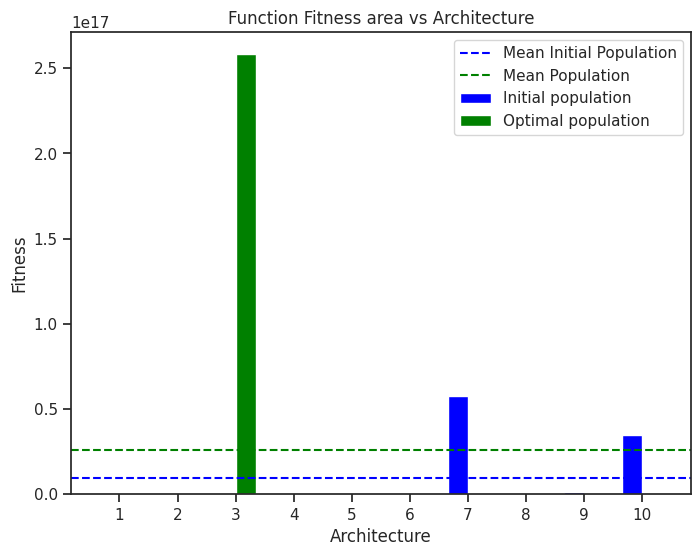

In [1664]:
bar_graph_population( GA_mesh.initial_population_fitness, GA_mesh.population_fitness, 'area' , True )

### Arquitectura Torus

#### Población Inicial

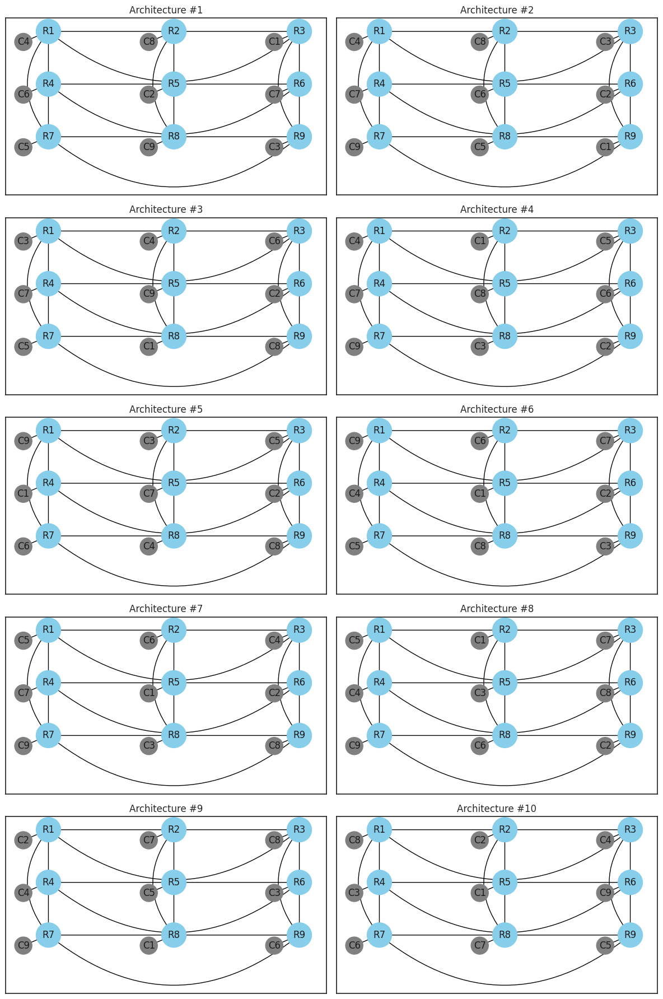

In [1665]:
plot_population( population_torus )

#### Optimización

In [1666]:
GA_torus = GeneticAlgorithm( population_torus, 'reliability' )
GA_torus.solve()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
Iteration: 9
Iteration: 10
Iteration: 11
Iteration: 12
Iteration: 13
Iteration: 14
Iteration: 15
Iteration: 16
Iteration: 17
Iteration: 18
Iteration: 19
Iteration: 20
Iteration: 21
Iteration: 22
Iteration: 23
Iteration: 24
Iteration: 25
Iteration: 26
Iteration: 27
Iteration: 28
Iteration: 29
Iteration: 30
Iteration: 31
Iteration: 32
Iteration: 33
Iteration: 34
Iteration: 35
Iteration: 36
Iteration: 37
Iteration: 38
Iteration: 39
Iteration: 40
Iteration: 41
Iteration: 42
Iteration: 43
Iteration: 44
Iteration: 45
Iteration: 46
Iteration: 47
Iteration: 48
Iteration: 49
Iteration: 50
Iteration: 51
Iteration: 52
Iteration: 53
Iteration: 54
Iteration: 55
Iteration: 56
Iteration: 57
Iteration: 58
Iteration: 59
Iteration: 60
Iteration: 61
Iteration: 62
Iteration: 63
Iteration: 64
Iteration: 65
Iteration: 66
Iteration: 67
Iteration: 68
Iteration: 69
Iteration: 70
Iteration: 71
It

#### Evolución Generaciones

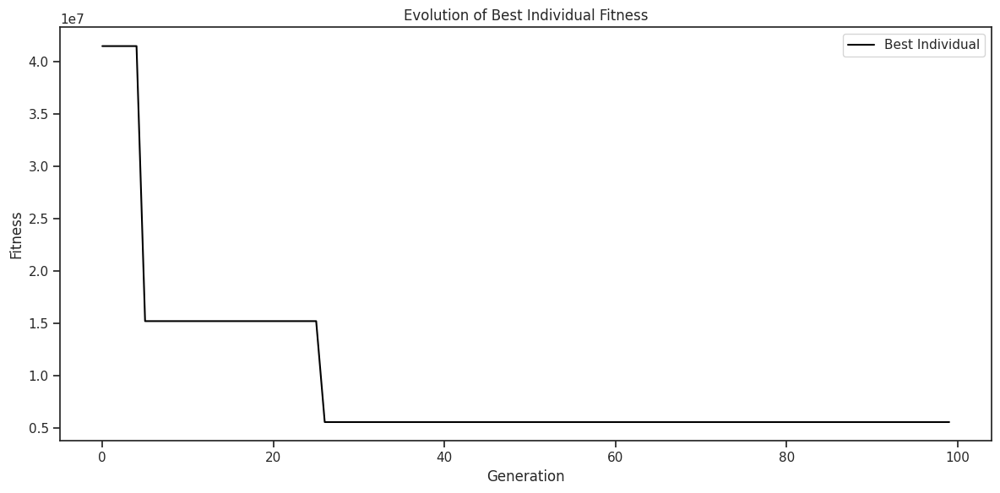

In [1667]:
def plot_best_individual_evolution_generations(best_individual_per_generation):
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals = best_individual_per_generation

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals, color='black', label='Best Individual')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_torus.best_individuals_fitness )

#### Población Inicial vs Optimizada

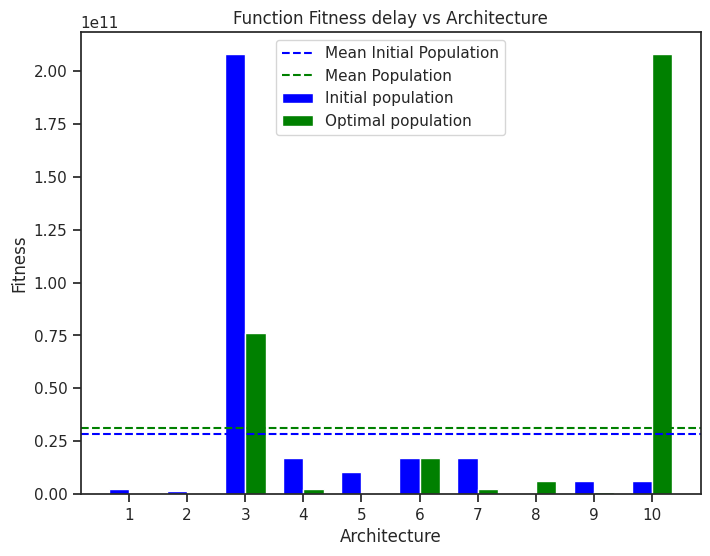

In [1668]:
bar_graph_population( GA_torus.initial_population_fitness, GA_torus.population_fitness, 'delay' , True )

### Arquitectura Ring

#### Población Inicial

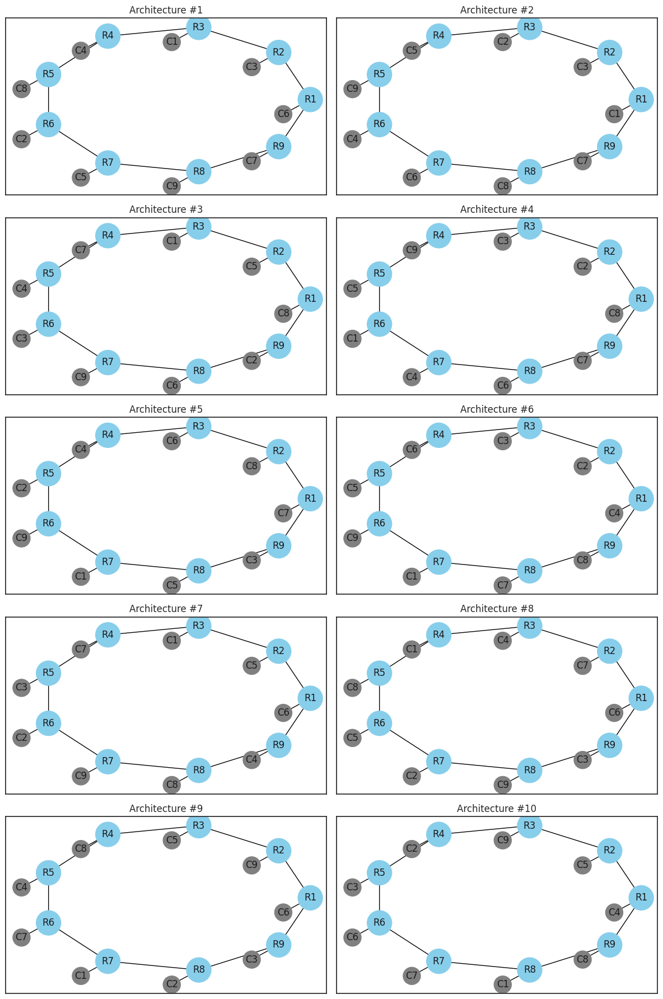

In [1669]:
plot_population( population_ring )

#### Optimización

In [1670]:
GA_ring = GeneticAlgorithm( population_ring, 'reliability' )
GA_ring.solve()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
Iteration: 9
Iteration: 10
Iteration: 11
Iteration: 12
Iteration: 13
Iteration: 14
Iteration: 15
Iteration: 16
Iteration: 17
Iteration: 18
Iteration: 19
Iteration: 20
Iteration: 21
Iteration: 22
Iteration: 23
Iteration: 24
Iteration: 25
Iteration: 26
Iteration: 27
Iteration: 28
Iteration: 29
Iteration: 30
Iteration: 31
Iteration: 32
Iteration: 33
Iteration: 34
Iteration: 35
Iteration: 36
Iteration: 37
Iteration: 38
Iteration: 39
Iteration: 40
Iteration: 41
Iteration: 42
Iteration: 43
Iteration: 44
Iteration: 45
Iteration: 46
Iteration: 47
Iteration: 48
Iteration: 49
Iteration: 50
Iteration: 51
Iteration: 52
Iteration: 53
Iteration: 54
Iteration: 55
Iteration: 56
Iteration: 57
Iteration: 58
Iteration: 59
Iteration: 60
Iteration: 61
Iteration: 62
Iteration: 63
Iteration: 64
Iteration: 65
Iteration: 66
Iteration: 67
Iteration: 68
Iteration: 69
Iteration: 70
Iteration: 71
It

#### Evolución Generaciones

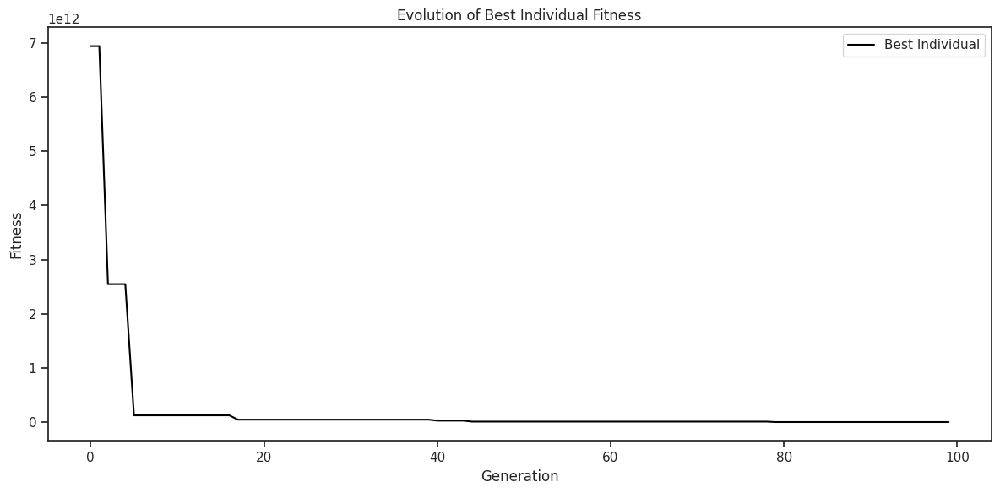

In [1671]:
def plot_best_individual_evolution_generations(best_individual_per_generation):
    x_vals = np.arange(len(best_individual_per_generation))
    y_vals = best_individual_per_generation

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals, color='black', label='Best Individual')

    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_ring.best_individuals_fitness )

#### Población Inicial vs Optimizada

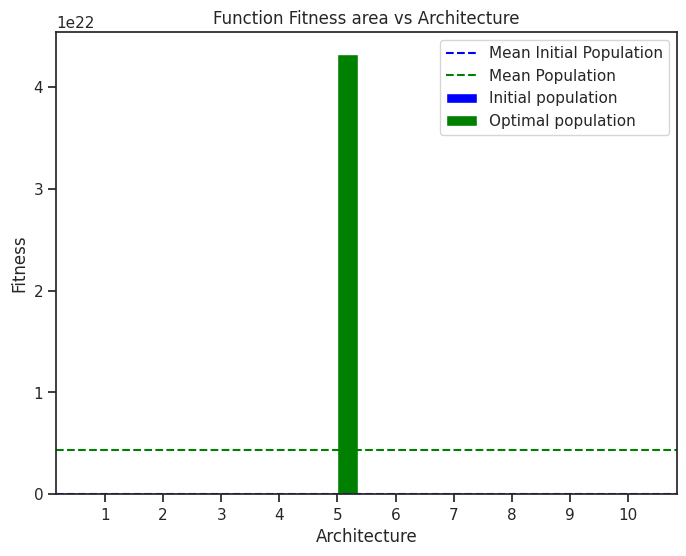

In [1672]:
bar_graph_population( GA_ring.initial_population_fitness, GA_ring.population_fitness, 'area' , True )

### Comparación Arquitecturas

##### Evolución Generaciones

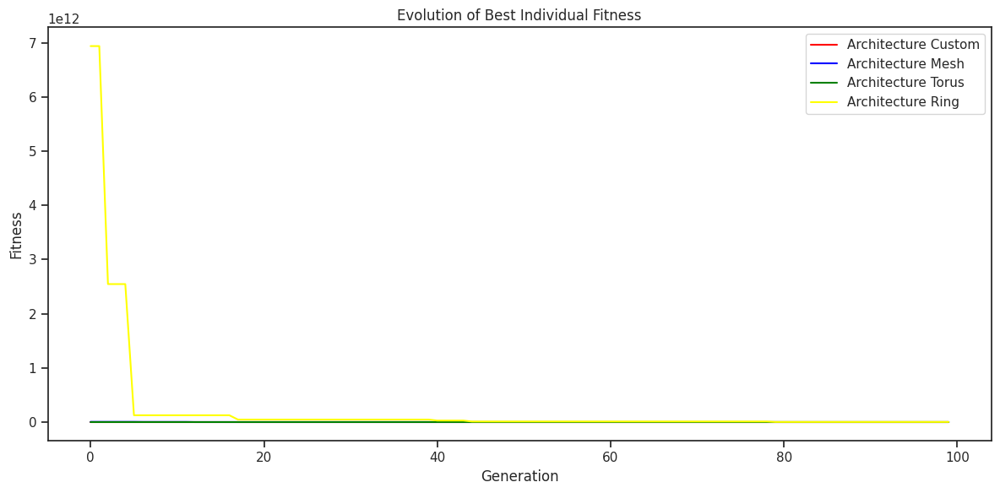

In [1673]:
def plot_best_individual_evolution_generations(best_individuals_custom, best_individuals_mesh, best_individuals_torus, best_individuals_ring):
    import seaborn as sns

    x_vals = np.arange(len(best_individuals_mesh))
    y_vals_custom = best_individuals_custom
    y_vals_mesh   = best_individuals_mesh
    y_vals_torus  = best_individuals_torus
    y_vals_ring   = best_individuals_ring

    plt.figure(figsize=(12, 6))

    plt.plot(x_vals, y_vals_custom, color='red',     label='Architecture Custom')
    plt.plot(x_vals, y_vals_mesh,   color='blue',    label='Architecture Mesh')
    plt.plot(x_vals, y_vals_torus,  color='green' ,  label='Architecture Torus' )
    plt.plot(x_vals, y_vals_ring,   color ='yellow', label='Architecture Ring' )


    plt.xlabel('Generation')
    plt.ylabel('Fitness')
    plt.title('Evolution of Best Individual Fitness')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_best_individual_evolution_generations( GA_custom.best_individuals_fitness, GA_mesh.best_individuals_fitness, GA_torus.best_individuals_fitness, GA_ring.best_individuals_fitness )

#### Comparación

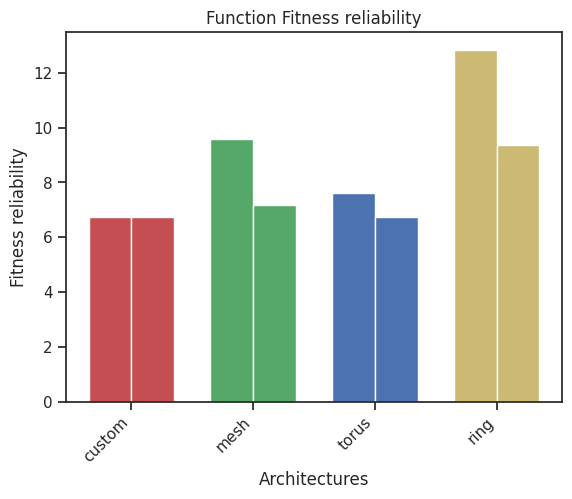

In [1674]:
def bar_graph_reliability_architectures( initial_architectures, optimized_architectures  ):
  import seaborn as sns
  sns.set()
  sns.set_style('ticks')

  architectures = ['custom', 'mesh', 'torus', 'ring']

  initial_architectures_reliability_network_topology = [architecture.metric_reliability.total_reliability for architecture in initial_architectures]
  initial_architectures_type_network_topology        = [architecture.topology_type for architecture in initial_architectures]

  optimized_architectures_reliability_network_topology = [architecture.metric_reliability.total_reliability for architecture in optimized_architectures]
  optimized_architectures_type_network_topology  = [architecture.topology_type for architecture in optimized_architectures]


  fig, ax = plt.subplots()

  width = 0.35  # Ancho de las barras
  offset = width / 2  # Espacio entre las barras

  ax.bar(np.arange(len(architectures)) - offset, -np.log10(initial_architectures_reliability_network_topology), width, color=['r','g','b','y','m','c','k'], label='Reliability Network Topology')
  ax.bar(np.arange(len(architectures)) + offset, -np.log10(optimized_architectures_reliability_network_topology), width, color=['r','g','b','y','m','c','k'], label='Reliability Minimum Edge Cut Set')


  labels = ax.get_xticklabels()
  plt.setp(labels, rotation = 45, horizontalalignment = 'right')

  plt.xlabel( 'Architectures' )
  plt.ylabel( 'Fitness reliability' )
  plt.title( 'Function Fitness reliability' )
  ax.set_xticks(range(len(population)))
  ax.set_xticklabels(architectures)
  #ax.legend()

  plt.show()

architectures = []
architectures.append( architecture_custom )
architectures.append( architecture_mesh )
architectures.append( architecture_torus )
architectures.append( architecture_ring )

initial_architectures = []
initial_architectures.append( GA_custom.best_individuals[0] )
initial_architectures.append( GA_mesh.best_individuals[0]  )
initial_architectures.append( GA_torus.best_individuals[0] )
initial_architectures.append( GA_ring.best_individuals[0]  )

optimized_architectures = []
optimized_architectures.append( GA_custom.best_individuals[-1] )
optimized_architectures .append( GA_mesh.best_individuals[-1]  )
optimized_architectures .append( GA_torus.best_individuals[-1] )
optimized_architectures .append( GA_ring.best_individuals[-1]  )

bar_graph_reliability_architectures( initial_architectures, optimized_architectures  )